# Frontal Detection Analysis (Extreme Precip)

In [1]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib as mpl
import xesmf as xe
import nc_time_axis
import cftime 
# Previously: needed cftime < 1.5 or nc-time-axis won't work (https://github.com/SciTools/nc-time-axis/issues/58)
# This was resolved in nc-time-axis 1.3.0 (https://github.com/SciTools/nc-time-axis/releases/tag/v1.3.0)
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.util import add_cyclic_point
from scipy import stats

In [2]:
# Import dask
import dask

# Use dask jobqueue
from dask_jobqueue import PBSCluster

# Import a client
from dask.distributed import Client

# Setup your PBSCluster
cluster = PBSCluster(
    cores=1, # The number of cores you want
    memory='10GB', # Amount of memory
    processes=1, # How many processes
    queue='casper', # The type of queue to utilize (/glade/u/apps/dav/opt/usr/bin/execcasper)
    local_directory='/glade/scratch/kdagon/dask-local', # Use your dask-local directory
    resource_spec='select=1:ncpus=1:mem=10GB', # Specify resources
    project='P06010014', # Input your project ID here
    walltime='01:00:00', # Amount of wall time
    interface='ib0', # Interface to use
)

# Scale up -- how to determine this number?
# Here asking for 10 or 20 nodes (10 or 20 dask workers)
cluster.scale(10)

# Adaptive scaling option!
#cluster.adapt(minimum=1, maximum=100, wait_count=60)

# Change your url to the dask dashboard so you can see it
dask.config.set({'distributed.dashboard.link':'https://jupyterhub.hpc.ucar.edu/stable/user/{USER}/proxy/{port}/status'})

# Setup your client
client = Client(cluster)

In [3]:
client

Connection method: Cluster object,Cluster type: PBSCluster
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/kdagon/proxy/8787/status,
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/kdagon/proxy/8787/status,Workers: 0
Total threads: 0,Total memory: 0 B
Comm: tcp://10.12.206.51:36257,Workers: 0
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/kdagon/proxy/8787/status,Total threads: 0
Started: Just now,Total memory: 0 B


## Read and process fronts given input file
All fronts and fronts by type

In [4]:
def process_fronts(path, file):
    fronts_ds = xr.open_dataset(path+file, chunks={'time':360})
    
    # convert longitudes to match CESM data (conservative regridding only)
    #fronts_ds_lons = fronts_ds.assign_coords(lon=(fronts_ds.lon % 360), keep_attrs=True)
    #fronts_ds_lons.lon.attrs = fronts_ds.lon.attrs
    #fronts = fronts_ds_lons.fronts
    
    fronts = fronts_ds.fronts
    print(fronts.front_type.values)
    
    # subset for a 15-year climatology (if applicable)
    if fronts.shape[0] > 43800:
        fronts = fronts[:43800]

    # all fronts
    allfronts = fronts.argmax(dim='front')
    anyfront = allfronts.where(allfronts < 4) # masking out no front areas
    
    # cold fronts
    allcoldfronts = fronts.sel(front=0) # see fronts.front_type.values for indices
    anycoldfront = allcoldfronts.where(allcoldfronts == 1) # masking out no cold front areas
    
    # warm fronts
    allwarmfronts = fronts.sel(front=1)
    anywarmfront = allwarmfronts.where(allwarmfronts == 1)
    
    # stationary fronts
    allstatfronts = fronts.sel(front=2)
    anystatfront = allstatfronts.where(allstatfronts == 1)
    
    # occluded fronts
    alloccfronts = fronts.sel(front=3)
    anyoccfront = alloccfronts.where(alloccfronts == 1)
    
    anyfront_types = xr.concat([anycoldfront, anywarmfront, anystatfront, anyoccfront], dim='front_type')
    
    return(anyfront, anyfront_types)

In [5]:
cesm_fronts_filepath = "/glade/work/kdagon/FrontDetector/CESMOutputs/"
fronts_file = "cesm_fronts_2000-2015_MaskedNetCDF_customgrid.nc"
fronts, fronts_type = process_fronts(cesm_fronts_filepath, fronts_file)

['cold' 'warm' 'stationary' 'occluded' 'none']


In [53]:
fronts

<xarray.DataArray 'fronts' (time: 43800, lat: 68, lon: 141)>
dask.array<where, shape=(43800, 68, 141), dtype=float64, chunksize=(360, 68, 141), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) object 2000-01-01 03:00:00 ... 2015-01-01 00:00:00
  * lon      (lon) float64 -171.0 -170.0 -169.0 -168.0 ... -33.0 -32.0 -31.0
  * lat      (lat) float64 10.0 11.0 12.0 13.0 14.0 ... 73.0 74.0 75.0 76.0 77.0

In [54]:
fronts_type

,Array,Chunk
Bytes,6.26 GiB,13.17 MiB
Shape,"(4, 43800, 68, 141)","(1, 360, 68, 141)"
Count,2693 Tasks,488 Chunks
Type,float32,numpy.ndarray


In [6]:
fronts_file_rcp = "cesm_fronts_2086-2100_MaskedNetCDF_customgrid.nc"
fronts_rcp, fronts_type_rcp = process_fronts(cesm_fronts_filepath, fronts_file_rcp)
#fronts_rcp

['cold' 'warm' 'stationary' 'occluded' 'none']


In [56]:
fronts_type_rcp

,Array,Chunk
Bytes,6.26 GiB,13.17 MiB
Shape,"(4, 43800, 68, 141)","(1, 360, 68, 141)"
Count,2563 Tasks,488 Chunks
Type,float32,numpy.ndarray


### Testing removing low precip days

In [8]:
path = '/glade/campaign/cgd/ccr/kdagon/dlfront/postprocessing/'
file = 'PRECT_3hravg_NA_hist_rcp26_1deg_bil.nc'
PRECT_1deg = xr.open_dataarray(path+file, chunks={'time':600, 'lat':10, 'lon':20})

In [14]:
# units didn't save out after regridding; PRECT is m/s at 3hrly averages
convert=1000*60*60*3 # convert m/s to mm in each 3hr period
PRECT_1deg_day = (PRECT_1deg*convert).resample(time="1D").sum() # resample to daily values and sum over each day

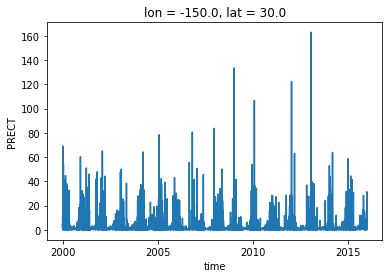

In [16]:
PRECT_1deg_day.sel(lat=30,lon=-150).plot()

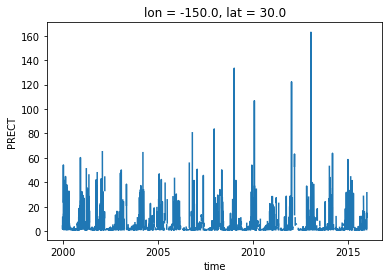

In [17]:
# filter out days with <1mm total precip
PRECT_1deg_day_filter = PRECT_1deg_day.where(PRECT_1deg_day > 1)
PRECT_1deg_day_filter.sel(lat=30,lon=-150).plot()

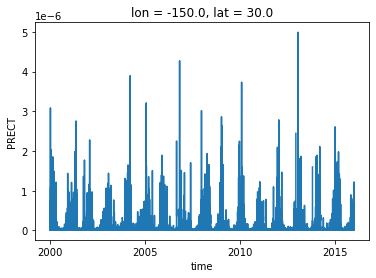

In [23]:
# problem is this is a daily timeseries, and I would need to isolate the filtered out days and remove them from PRECT_1deg timeseries which is 3hrly
#PRECT_1deg.where(PRECT_1deg_day > 1) # this works but it gives me a daily timeseries
PRECT_1deg_filter = PRECT_1deg.where((PRECT_1deg*convert) > 1/8) # here, remove 3hrly timesteps with <1/8 mm assuming even spread (8 time steps per day)
PRECT_1deg_filter.sel(lat=30,lon=-150).plot()
# but is this fair to then later look at monthly climatologies because only certain 3hrly timesteps are removed (could be only part of a day)?
# makes the results very noisy, probably due to the uneven temporal sampling

## Read landfrac to subset land points

In [7]:
postprocessing_filepath = '/glade/campaign/cgd/ccr/kdagon/dlfront/postprocessing/'
landfrac_file = 'landfrac_1deg_bil.nc'

In [8]:
landfrac = xr.open_dataarray(postprocessing_filepath+landfrac_file)
#landfrac

## Read and process extreme precipitation given input file and percentile

In [9]:
def process_PEx(path, file, landfrac, percentile):
    PRECT_1deg = xr.open_dataarray(path+file, chunks={'time':600, 'lat':10, 'lon':20})
    
    # subset for a 15-year climatology (if applicable)
    if PRECT_1deg.shape[0] > 43800:
        PRECT_1deg = PRECT_1deg[:43800]
    
    # remove low PRECT amounts (optional)
    #convert = 1000*60*60*3 # convert m/s to mm in each 3hr period
    #PRECT_1deg = PRECT_1deg.where((PRECT_1deg*convert) > 1/8) # here, remove 3hrly timesteps with <1/8 mm assuming even spread (8 time steps per day)
    
    # subset for land only (optional; comment out to use whole domain)
    PRECT_1deg = PRECT_1deg.where(landfrac > 0)
    
    quantile = percentile/100
    
    # PEx over time
    pX = PRECT_1deg.chunk({'time': -1}).quantile(quantile, dim='time')
    PEx = PRECT_1deg.where(PRECT_1deg > pX)
    
    # PEx by season
    pX_season = PRECT_1deg.chunk({'time': -1}).groupby("time.season").quantile(quantile, dim='time')
    PEx_season = PRECT_1deg.groupby("time.season").where(PRECT_1deg.groupby("time.season") > pX_season)
    
    # subset for CONUS (optional; don't need to calculate this explicitly since it will be the same to subset later on)
    #PEx_CONUS = PEx.sel(lat=slice(26,50), lon=slice(-125,-68)) # MERRA lons
    #PEx_CONUS = PEx.sel(lat=slice(26,50), lon=slice(235,292)) # CESM lons
    
    # PEx over space (deprecated)
    #pX_time = PRECT_1deg.chunk({'lat': -1, 'lon': -1}).quantile(quantile, dim=('lat','lon'))
    #PEx_time = PRECT_1deg.where(PRECT_1deg > pX_time)
    
    # subset for CONUS, starting from quantile calculation since it's looking over space
    # MERRA lons
    #pX_time_CONUS = PRECT_1deg.sel(lat=slice(26,50), lon=slice(-125,-68)).chunk({'lat': -1, 'lon': -1}).quantile(quantile, dim=('lat','lon'))
    #PEx_time_CONUS = PRECT_1deg.sel(lat=slice(26,50), lon=slice(-125,-68)).where(PRECT_1deg.sel(lat=slice(26,50), lon=slice(-125,-68)) > pX_time_CONUS)
    # CESM lons
    #pX_time_CONUS = PRECT_1deg.sel(lat=slice(26,50), lon=slice(235,292)).chunk({'lat': -1, 'lon': -1}).quantile(quantile, dim=('lat','lon'))
    #PEx_time_CONUS = PRECT_1deg.sel(lat=slice(26,50), lon=slice(235,292)).where(PRECT_1deg.sel(lat=slice(26,50), lon=slice(235,292)) > pX_time_CONUS)
    
    #return(PEx, PEx_CONUS, PEx_time, PEx_time_CONUS)
    return(PEx, PEx_season)

In [10]:
postprocessing_filepath = '/glade/campaign/cgd/ccr/kdagon/dlfront/postprocessing/'
PRECT_file = 'PRECT_3hravg_NA_hist_rcp26_1deg_bil.nc' # bilinear interpolation
#PRECT_file = 'PRECT_3hravg_NA_hist_rcp26_1deg_cons.nc' # conservative regridding

### IMPORTANT: toggle this to test different PEx definitions ###
percentile = 90
#percentile = 95
#percentile = 99

PEx, PEx_season = process_PEx(postprocessing_filepath, PRECT_file, landfrac, percentile)
#PEx

/glade/work/kdagon/miniconda/envs/PEx/lib/python3.9/site-packages/xarray/core/indexing.py:1379: PerformanceWarning: Slicing is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array[indexer]

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array[indexer]
  return self.array[key]
/glade/work/kdagon/miniconda/envs/PEx/lib/python3.9/site-packages/xarray/core/indexing.py:1379: PerformanceWarning: Slicing is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array[indexer]

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array[indexer]
  return self.array

In [11]:
# modify processing function to account for using a different baseline
def process_PEx_base(path, file, basefile, landfrac, percentile):
    PRECT_1deg = xr.open_dataarray(path+file, chunks={'time':600, 'lat':10, 'lon':20})
    PRECT_1deg_base = xr.open_dataarray(path+basefile, chunks={'time':600, 'lat':10, 'lon':20})
    
    # subset for a 15-year climatology (if applicable)
    if PRECT_1deg.shape[0] > 43800:
        PRECT_1deg = PRECT_1deg[:43800]
    if PRECT_1deg_base.shape[0] > 43800:
        PRECT_1deg_base = PRECT_1deg_base[:43800]
        
    # subset for land only (optional; comment out to use whole domain)
    PRECT_1deg = PRECT_1deg.where(landfrac > 0)
    PRECT_1deg_base = PRECT_1deg_base.where(landfrac > 0)

    quantile = percentile/100
    
    # PEx over time
    #pX = PRECT_1deg.chunk({'time': -1}).quantile(quantile, dim='time')
    pX = PRECT_1deg_base.chunk({'time': -1}).quantile(quantile, dim='time') # use the baseline file to define the percentile
    PEx = PRECT_1deg.where(PRECT_1deg > pX)
    
    # PEx by season
    pX_season = PRECT_1deg_base.chunk({'time': -1}).groupby("time.season").quantile(quantile, dim='time')
    PEx_season = PRECT_1deg.groupby("time.season").where(PRECT_1deg.groupby("time.season") > pX_season)
    
    # subset for CONUS (optional; don't need to calculate this explicitly since it will be the same to subset later on)
    #PEx_CONUS = PEx.sel(lat=slice(26,50), lon=slice(-125,-68)) # MERRA lons
    #PEx_CONUS = PEx.sel(lat=slice(26,50), lon=slice(235,292)) # CESM lons
    
    # PEx over space (deprecated)
    #pX_time = PRECT_1deg.chunk({'lat': -1, 'lon': -1}).quantile(quantile, dim=('lat','lon'))
    #pX_time = PRECT_1deg_base.chunk({'lat': -1, 'lon': -1}).quantile(quantile, dim=('lat','lon'))
    # copy the time attribute from PRECT_1deg to pX_time so they will match
    #pX_time = pX_time.assign_coords(time=PRECT_1deg.time)
    #PEx_time = PRECT_1deg.where(PRECT_1deg > pX_time) 
    
    # subset for CONUS, starting from quantile calculation since it's looking over space
    # MERRA lons
    #pX_time_CONUS = PRECT_1deg_base.sel(lat=slice(26,50), lon=slice(-125,-68)).chunk({'lat': -1, 'lon': -1}).quantile(quantile, dim=('lat','lon'))
    #pX_time_CONUS = pX_time_CONUS.assign_coords(time=PRECT_1deg.time)
    #PEx_time_CONUS = PRECT_1deg.sel(lat=slice(26,50), lon=slice(-125,-68)).where(PRECT_1deg.sel(lat=slice(26,50), lon=slice(-125,-68)) > pX_time_CONUS)
    # CESM lons
    #pX_time_CONUS = PRECT_1deg.sel(lat=slice(26,50), lon=slice(235,292)).chunk({'lat': -1, 'lon': -1}).quantile(quantile, dim=('lat','lon'))
    #pX_time_CONUS = PRECT_1deg_base.sel(lat=slice(26,50), lon=slice(235,292)).chunk({'lat': -1, 'lon': -1}).quantile(quantile, dim=('lat','lon'))
    #pX_time_CONUS = pX_time_CONUS.assign_coords(time=PRECT_1deg.time)
    #PEx_time_CONUS = PRECT_1deg.sel(lat=slice(26,50), lon=slice(235,292)).where(PRECT_1deg.sel(lat=slice(26,50), lon=slice(235,292)) > pX_time_CONUS)
    
    #return(PEx, PEx_CONUS, PEx_time, PEx_time_CONUS)
    return(PEx, PEx_season)

In [12]:
PRECT_file_rcp = 'PRECT_3hravg_NA_rcp85_1deg_bil.nc'
#PRECT_file_rcp = 'PRECT_3hravg_NA_rcp85_1deg_cons.nc'
PEx_rcp, PEx_season_rcp = process_PEx_base(postprocessing_filepath, file=PRECT_file_rcp, basefile=PRECT_file, landfrac=landfrac, percentile=percentile)
#PEx_rcp

/glade/work/kdagon/miniconda/envs/PEx/lib/python3.9/site-packages/xarray/core/indexing.py:1379: PerformanceWarning: Slicing is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array[indexer]

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array[indexer]
  return self.array[key]
/glade/work/kdagon/miniconda/envs/PEx/lib/python3.9/site-packages/xarray/core/indexing.py:1379: PerformanceWarning: Slicing is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array[indexer]

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array[indexer]
  return self.array

## Calculate fraction of extreme precipitation associated with a front
Also return total extreme precipitation

In [11]:
#def calc_overlap(fronts,fronts_type,PEx,PEx_season):
def calc_overlap(fronts,fronts_type,PEx_season):
    
    # PExgridpoints is a sum over time, given PEx as input
    # It is constant over space for historical simulation (by quantile construction), since mathematically each point will have e.g., p > p90 10% of the time for 90th percentile
    #PExgridpoints = PEx.notnull().sum(dim='time')
    
    # Alternatively, compute sum of extreme precipitation amount over time at each gridpoint
    #PEx_sum = PEx.sum(dim='time')
    
    # subset for land only (optional; comment out to use whole domain)
    #PExgridpoints = PExgridpoints.where(landfrac > 0)
    #PEx_sum = PEx_sum.where(landfrac > 0)
    
    # Subset PEx gridpoints where there is a front
    #PEx_front = PEx.where(fronts.notnull())
    #PEx_front_type = PEx.where(fronts_type.notnull())
        
    # Overlap is number of times each gridcell has a front AND precip is > some percentile
    # Based on percentile calculated at each gridpoint over time
    #overlap = PEx_front.notnull().sum(dim='time')
    #overlap_type = PEx_front_type.notnull().sum(dim=('time'))
    
    # Alternatively, compute overlap based on sum of extreme frontal precip
    #overlap_sum = PEx_front.sum(dim='time')
    #overlap_sum_type = PEx_front_type.sum(dim='time')
    
    # Here we want percent (of the time) each gridpoint has extreme precip associated with front
    # Percent should be based on total PEx timepoints, which is constant over space by quantile construction
    # Can also calculate e.g., 10% of timepoints (for 90th percentile) and use a constant integer value instead of PExgridpoints map
    #npercentPEx = 100*(overlap/PExgridpoints)
    #npercentPEx_type = 100*(overlap_type/PExgridpoints)
    
    # Alternatively, calculate percentage based on total extreme precipitation amounts
    #npercentPEx_sum = 100*(overlap_sum/PEx_sum)
    #npercentPEx_sum_type = 100*(overlap_sum_type/PEx_sum)
    
    # For the seasonal breakdown, use the percentiles calculated by season
    #PExgridpoints_byseason = PEx_season.notnull().groupby("time.season").sum(dim='time') # by season (4; DJF, JJA, MAM, SON)
    #PExgridpoints_byseason = PExgridpoints_byseason.where(landfrac > 0)
    
    PEx_sum_byseason = PEx_season.groupby("time.season").sum(dim='time')
    PEx_sum_byseason = PEx_sum_byseason.where(landfrac > 0)
    
    PEx_front_byseason = PEx_season.where(fronts.notnull())
    PEx_front_type_byseason = PEx_season.where(fronts_type.notnull())
    
    #overlap_byseason = PEx_front_byseason.notnull().groupby("time.season").sum(dim='time')
    #overlap_type_byseason = PEx_front_type_byseason.notnull().groupby("time.season").sum(dim='time')
    
    overlap_sum_byseason = PEx_front_byseason.groupby("time.season").sum(dim='time')
    overlap_sum_type_byseason = PEx_front_type_byseason.groupby("time.season").sum(dim='time')
    
    #npercentPEx_byseason = 100*(overlap_byseason/PExgridpoints_byseason)
    #npercentPEx_type_byseason = 100*(overlap_type_byseason/PExgridpoints_byseason)
    
    npercentPEx_sum_byseason = 100*(overlap_sum_byseason/PEx_sum_byseason)
    npercentPEx_sum_type_byseason = 100*(overlap_sum_type_byseason/PEx_sum_byseason)
    
    # only need to return seasonal calculations for plots
    #return(npercentPEx_byseason, npercentPEx_type_byseason, PExgridpoints_byseason)
    return(npercentPEx_sum_byseason, npercentPEx_sum_type_byseason, PEx_sum_byseason)

    # testing alternate approach
    #return(PExgridpoints, PEx_sum, overlap, overlap_sum, npercentPEx, npercentPEx_sum)

In [16]:
# historical
#npercentPEx, npercentPEx_type, PExgridpoints = calc_overlap(fronts, fronts_type, PEx, PEx_season)
#npercentPEx, npercentPEx_type, PEx_sum = calc_overlap(fronts, fronts_type, PEx, PEx_season)
npercentPEx, npercentPEx_type, PEx_sum = calc_overlap(fronts, fronts_type, PEx_season)
# rcp
#npercentPEx_rcp, npercentPEx_type_rcp, PExgridpoints_rcp = calc_overlap(fronts_rcp, fronts_type_rcp, PEx_rcp, PEx_season_rcp)
#npercentPEx_rcp, npercentPEx_type_rcp, PEx_sum_rcp = calc_overlap(fronts_rcp, fronts_type_rcp, PEx_rcp, PEx_season_rcp)
npercentPEx_rcp, npercentPEx_type_rcp, PEx_sum_rcp = calc_overlap(fronts_rcp, fronts_type_rcp, PEx_season_rcp)

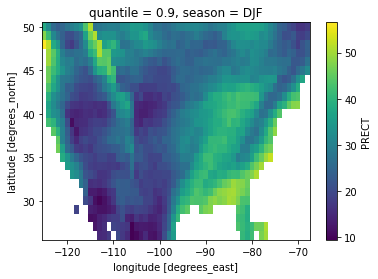

In [141]:
# Percent PEx associated with front
npercentPEx.sel(season='DJF', lat=slice(26,50), lon=slice(-125,-68)).plot()

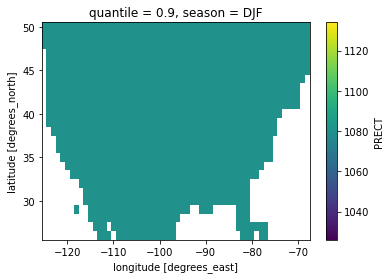

In [142]:
# Total PEx gridpoints (should be constant over space)
PExgridpoints.sel(season='DJF', lat=slice(26,50), lon=slice(-125,-68)).plot()

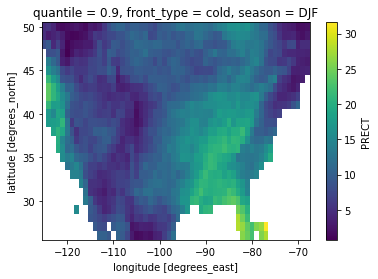

In [150]:
npercentPEx_type.sel(season='DJF', front_type='cold', lat=slice(26,50), lon=slice(-125,-68)).plot()

### Testing sensitivity of percent calculation basis (number of points vs. total precipitation rate)

In [14]:
PExgridpoints, PEx_sum, overlap, overlap_sum, npercentPEx, npercentPEx_sum = calc_overlap(fronts, fronts_type, PEx, PEx_season)

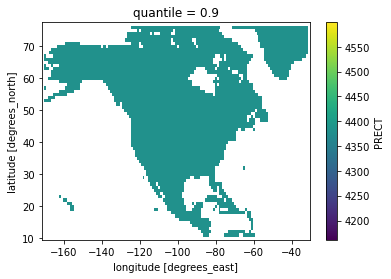

In [16]:
# constant by quantile construction
PExgridpoints.plot()

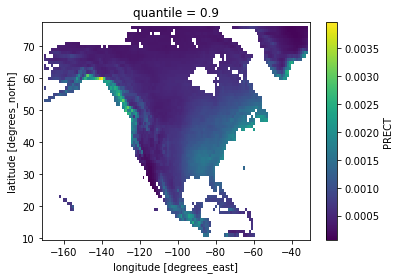

In [18]:
# sum of extreme precipitation amount over time
PEx_sum.plot()

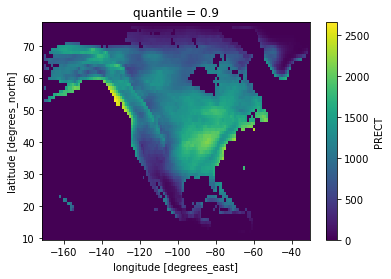

In [21]:
# sum of extreme frontal precipitation gridpoints over time
overlap.plot()

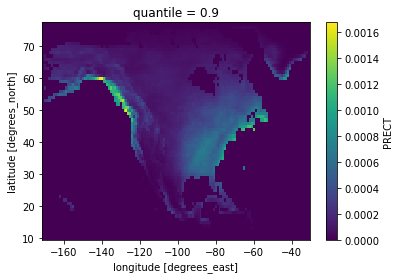

In [22]:
# sum of extreme frontal precipitation amount over time
overlap_sum.plot()

In [25]:
print(npercentPEx.sel(lat=slice(26,50), lon=slice(-125,-68)).max().values, npercentPEx_sum.sel(lat=slice(26,50), lon=slice(-125,-68)).max().values)

51.757990867579906 56.26496129759334


/glade/work/kdagon/miniconda/envs/PEx/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1887: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  result = matplotlib.axes.Axes.pcolor(self, *args, **kwargs)


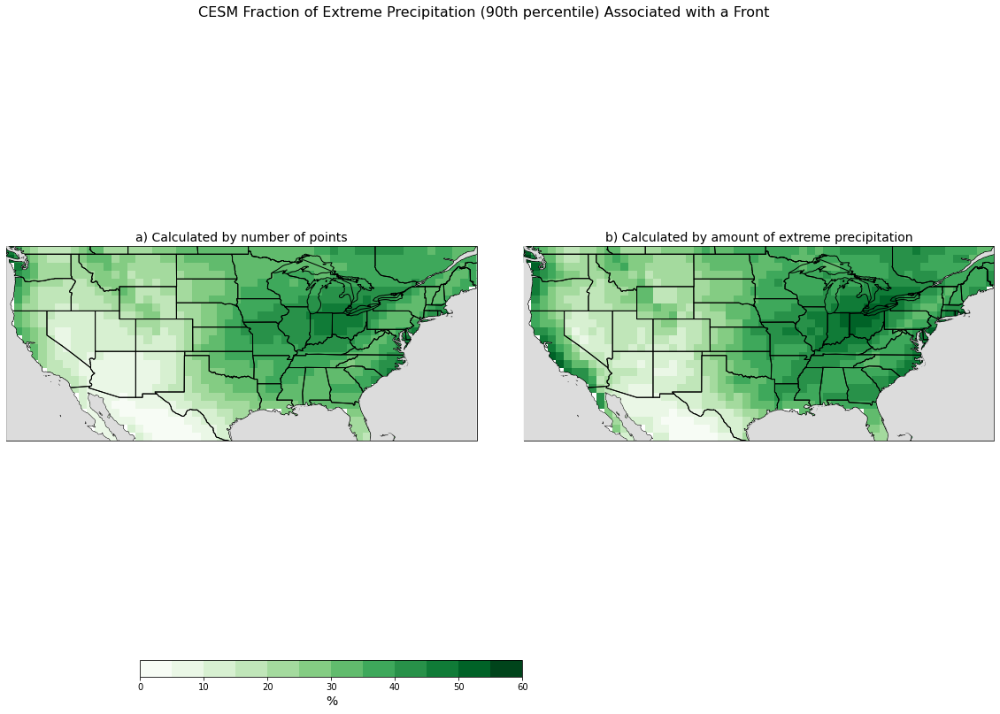

In [26]:
# compare spatial map of npercentPEx based on different calculations
fig, axs = plt.subplots(1, 2, figsize=(20,13), subplot_kw={'projection': ccrs.PlateCarree()})

# discrete colormap for absolute plots
cmap=plt.cm.get_cmap('Greens', 12)
vmax = 60 # 90th, 95th, 99th percentiles

axs[0].set_title('a) Calculated by number of points', fontsize=14) 
field, lon = add_cyclic_point(npercentPEx.sel(lat=slice(26,50), lon=slice(-125,-68)), coord=npercentPEx.sel(lat=slice(26,50), lon=slice(-125,-68)).lon)
lat = npercentPEx.sel(lat=slice(26,50), lon=slice(-125,-68)).lat
cf = axs[0].pcolor(lon, lat, field, cmap=cmap, vmin=0, vmax=vmax, transform=ccrs.PlateCarree())
axs[0].coastlines(zorder=1)
axs[0].add_feature(cfeature.BORDERS, zorder=2)
axs[0].add_feature(cfeature.STATES, zorder=3)
# add greyed out ocean
axs[0].add_feature(cfeature.OCEAN, zorder=4, facecolor='gainsboro', edgecolor='none')

axs[1].set_title('b) Calculated by amount of extreme precipitation', fontsize=14)
field, lon = add_cyclic_point(npercentPEx_sum.sel(lat=slice(26,50), lon=slice(-125,-68)), coord=npercentPEx_sum.sel(lat=slice(26,50), lon=slice(-125,-68)).lon)
lat = npercentPEx_sum.sel(lat=slice(26,50), lon=slice(-125,-68)).lat
cf = axs[1].pcolor(lon, lat, field, cmap=cmap, vmin=0, vmax=vmax, transform=ccrs.PlateCarree())
axs[1].coastlines(zorder=1)
axs[1].add_feature(cfeature.BORDERS, zorder=2)
axs[1].add_feature(cfeature.STATES, zorder=3)
# add greyed out ocean
axs[1].add_feature(cfeature.OCEAN, zorder=4, facecolor='gainsboro', edgecolor='none')

cb1_ax = fig.add_axes([0.23, 0.1, 0.3, 0.02])
norm = mpl.colors.Normalize(vmin=0, vmax=vmax)
cb1 = mpl.colorbar.ColorbarBase(cb1_ax, cmap=cmap, norm=norm, orientation='horizontal') # 90th percentile
#cb1 = mpl.colorbar.ColorbarBase(cb1_ax, cmap=cmap, norm=norm, orientation='horizontal', extend='max') # 95th, 99th percentiles
cb1.ax.set_xlabel('%', fontsize=14)

fig.suptitle('CESM Fraction of Extreme Precipitation (90th percentile) Associated with a Front', fontsize=16, y=0.91)

plt.subplots_adjust(wspace=0.1, hspace=0)
# there is some subtle differences in the plots so go with the amount calculation to be consistent with total frontal precip calculations

### Climatological monthly mean plots
(Deprecated code )

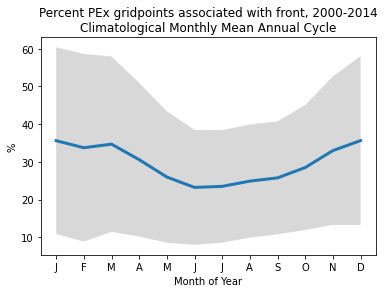

In [63]:
npercentPEx_monthofyear = npercentPEx_space.groupby("time.month").mean().persist()
npercentPEx_monthofyear_std = npercentPEx_space.groupby("time.month").std().persist()

plt.plot(npercentPEx_monthofyear.month, npercentPEx_monthofyear, linewidth=3)
plt.fill_between(npercentPEx_monthofyear.month, npercentPEx_monthofyear-npercentPEx_monthofyear_std, 
                npercentPEx_monthofyear+npercentPEx_monthofyear_std, alpha=0.3, facecolor='grey')
plt.xticks(np.arange(12)+1, ['J','F','M','A','M','J','J','A','S','O','N','D'])
plt.xlabel('Month of Year')
plt.ylabel('%')
plt.title('Percent PEx gridpoints associated with front, 2000-2014\nClimatological Monthly Mean Annual Cycle');

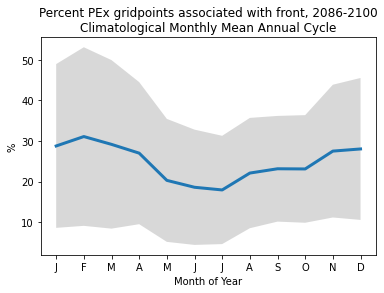

In [64]:
npercentPEx_rcp85_monthofyear = npercentPEx_space_rcp.groupby("time.month").mean().persist()
npercentPEx_rcp85_monthofyear_std = npercentPEx_space_rcp.groupby("time.month").std().persist()

plt.plot(npercentPEx_rcp85_monthofyear.month, npercentPEx_rcp85_monthofyear, linewidth=3)
plt.fill_between(npercentPEx_rcp85_monthofyear.month, npercentPEx_rcp85_monthofyear-npercentPEx_rcp85_monthofyear_std, 
                npercentPEx_rcp85_monthofyear+npercentPEx_rcp85_monthofyear_std, alpha=0.3, facecolor='grey')
plt.xticks(np.arange(12)+1, ['J','F','M','A','M','J','J','A','S','O','N','D'])
plt.xlabel('Month of Year')
plt.ylabel('%')
plt.title('Percent PEx gridpoints associated with front, 2086-2100\nClimatological Monthly Mean Annual Cycle');

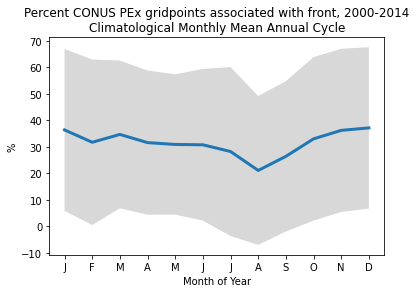

In [65]:
npercentPEx_monthofyear_CONUS = npercentPEx_space_CONUS.groupby("time.month").mean().persist()
npercentPEx_monthofyear_std_CONUS = npercentPEx_space_CONUS.groupby("time.month").std().persist()

plt.plot(npercentPEx_monthofyear_CONUS.month, npercentPEx_monthofyear_CONUS, linewidth=3)
plt.fill_between(npercentPEx_monthofyear_CONUS.month, npercentPEx_monthofyear_CONUS-npercentPEx_monthofyear_std_CONUS, 
                npercentPEx_monthofyear_CONUS+npercentPEx_monthofyear_std_CONUS, alpha=0.3, facecolor='grey')
plt.xticks(np.arange(12)+1, ['J','F','M','A','M','J','J','A','S','O','N','D'])
plt.xlabel('Month of Year')
plt.ylabel('%')
plt.title('Percent CONUS PEx gridpoints associated with front, 2000-2014\nClimatological Monthly Mean Annual Cycle');

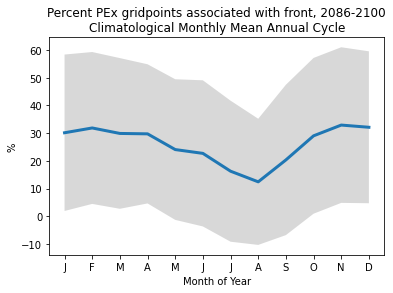

In [66]:
npercentPEx_rcp85_monthofyear_CONUS = npercentPEx_space_CONUS_rcp.groupby("time.month").mean().persist()
npercentPEx_rcp85_monthofyear_std_CONUS = npercentPEx_space_CONUS_rcp.groupby("time.month").std().persist()

plt.plot(npercentPEx_rcp85_monthofyear_CONUS.month, npercentPEx_rcp85_monthofyear_CONUS, linewidth=3)
plt.fill_between(npercentPEx_rcp85_monthofyear_CONUS.month, npercentPEx_rcp85_monthofyear_CONUS-npercentPEx_rcp85_monthofyear_std_CONUS, 
                npercentPEx_rcp85_monthofyear_CONUS+npercentPEx_rcp85_monthofyear_std_CONUS, alpha=0.3, facecolor='grey')
plt.xticks(np.arange(12)+1, ['J','F','M','A','M','J','J','A','S','O','N','D'])
plt.xlabel('Month of Year')
plt.ylabel('%')
plt.title('Percent PEx gridpoints associated with front, 2086-2100\nClimatological Monthly Mean Annual Cycle');

In [67]:
# calculate differences, rcp-hist
npercentPEx_monthofyear_CONUS_diff = npercentPEx_rcp85_monthofyear_CONUS - npercentPEx_monthofyear_CONUS
npercentPEx_monthofyear_diff = npercentPEx_rcp85_monthofyear - npercentPEx_monthofyear

#### Panel the climatology plots

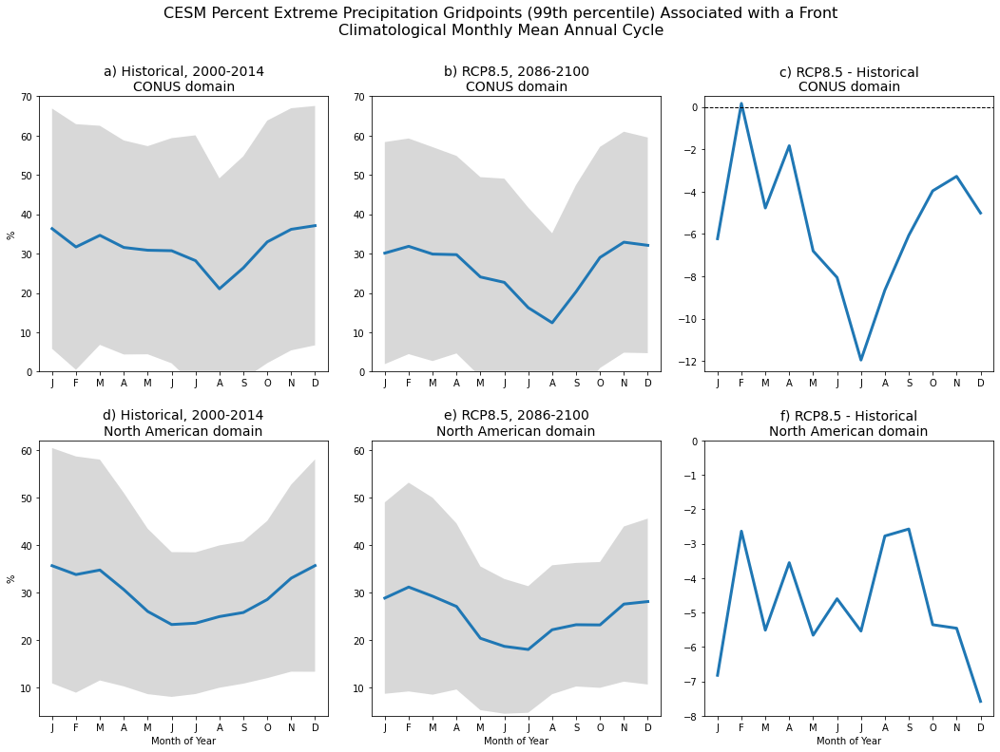

In [68]:
fig, axs = plt.subplots(2, 3, figsize=(18,12))

# CONUS, hist
axs[0,0].plot(npercentPEx_monthofyear_CONUS.month, npercentPEx_monthofyear_CONUS, linewidth=3)
axs[0,0].fill_between(npercentPEx_monthofyear_CONUS.month, npercentPEx_monthofyear_CONUS-npercentPEx_monthofyear_std_CONUS, 
                npercentPEx_monthofyear_CONUS+npercentPEx_monthofyear_std_CONUS, alpha=0.3, facecolor='grey')
axs[0,0].set_xticks(np.arange(12)+1)
axs[0,0].set_xticklabels(['J','F','M','A','M','J','J','A','S','O','N','D'])
#axs[0,0].set_ylim(10,50) # 90th
#axs[0,0].set_ylim(5,60) # 95th
#axs[0,0].set_ylim(0,75) # 99th
#axs[0,0].set_ylim(8,46) # 90th, land only
#axs[0,0].set_ylim(4,55) # 95th, land only
axs[0,0].set_ylim(0,70) # 99th, land only
axs[0,0].set_ylabel('%')
axs[0,0].set_title('a) Historical, 2000-2014\nCONUS domain', fontsize=14)

# CONUS, rcp
axs[0,1].plot(npercentPEx_rcp85_monthofyear_CONUS.month, npercentPEx_rcp85_monthofyear_CONUS, linewidth=3)
axs[0,1].fill_between(npercentPEx_rcp85_monthofyear_CONUS.month, npercentPEx_rcp85_monthofyear_CONUS-npercentPEx_rcp85_monthofyear_std_CONUS, 
                npercentPEx_rcp85_monthofyear_CONUS+npercentPEx_rcp85_monthofyear_std_CONUS, alpha=0.3, facecolor='grey')
axs[0,1].set_xticks(np.arange(12)+1) 
axs[0,1].set_xticklabels(['J','F','M','A','M','J','J','A','S','O','N','D'])
#axs[0,1].set_ylim(10,50)
#axs[0,1].set_ylim(5,60)
#axs[0,1].set_ylim(0,75)
# land only
#axs[0,1].set_ylim(8,46)
#axs[0,1].set_ylim(4,55)
axs[0,1].set_ylim(0,70)
axs[0,1].set_title('b) RCP8.5, 2086-2100\nCONUS domain', fontsize=14);

# CONUS, diff
axs[0,2].plot(npercentPEx_monthofyear_CONUS_diff.month, npercentPEx_monthofyear_CONUS_diff, linewidth=3)
axs[0,2].axhline(y=0, c='k', linestyle='dashed', linewidth=1)
axs[0,2].set_xticks(np.arange(12)+1) 
axs[0,2].set_xticklabels(['J','F','M','A','M','J','J','A','S','O','N','D'])
#axs[0,2].set_ylim(-5,0)
#axs[0,2].set_ylim(-7,0)
#axs[0,2].set_ylim(-13,0)
# land only
#axs[0,2].set_ylim(-4,1)
#axs[0,2].set_ylim(-6,1)
axs[0,2].set_ylim(-12.5,0.5)
axs[0,2].set_title('c) RCP8.5 - Historical\nCONUS domain', fontsize=14);

# NA, hist
axs[1,0].plot(npercentPEx_monthofyear.month, npercentPEx_monthofyear, linewidth=3)
axs[1,0].fill_between(npercentPEx_monthofyear.month, npercentPEx_monthofyear-npercentPEx_monthofyear_std, 
                npercentPEx_monthofyear+npercentPEx_monthofyear_std, alpha=0.3, facecolor='grey')
axs[1,0].set_xticks(np.arange(12)+1)
axs[1,0].set_xticklabels(['J','F','M','A','M','J','J','A','S','O','N','D'])
axs[1,0].set_xlabel('Month of Year')
#axs[1,0].set_ylim(12,40)
#axs[1,0].set_ylim(10,50)
#axs[1,0].set_ylim(8,68)
# land only
#axs[1,0].set_ylim(8,36)
#axs[1,0].set_ylim(10,43)
axs[1,0].set_ylim(4,62)
axs[1,0].set_ylabel('%')
axs[1,0].set_title('d) Historical, 2000-2014\nNorth American domain', fontsize=14);
#axs[1,0].set_title('North American domain', fontsize=14);

# NA, rcp
axs[1,1].plot(npercentPEx_rcp85_monthofyear.month, npercentPEx_rcp85_monthofyear, linewidth=3)
axs[1,1].fill_between(npercentPEx_rcp85_monthofyear.month, npercentPEx_rcp85_monthofyear-npercentPEx_rcp85_monthofyear_std, 
                npercentPEx_rcp85_monthofyear+npercentPEx_rcp85_monthofyear_std, alpha=0.3, facecolor='grey')
axs[1,1].set_xticks(np.arange(12)+1)
axs[1,1].set_xticklabels(['J','F','M','A','M','J','J','A','S','O','N','D'])
axs[1,1].set_xlabel('Month of Year')
#axs[1,1].set_ylim(12,40)
#axs[1,1].set_ylim(10,50)
#axs[1,1].set_ylim(8,68)
# land only
#axs[1,1].set_ylim(8,36)
#axs[1,1].set_ylim(10,43)
axs[1,1].set_ylim(4,62)
axs[1,1].set_title('e) RCP8.5, 2086-2100\nNorth American domain', fontsize=14);
#axs[1,1].set_title('North American domain', fontsize=14);

# NA, diff
axs[1,2].plot(npercentPEx_monthofyear_diff.month, npercentPEx_monthofyear_diff, linewidth=3)
#axs[1,2].axhline(y=0, c='k', linestyle='dashed', linewidth=1)
axs[1,2].set_xticks(np.arange(12)+1) 
axs[1,2].set_xticklabels(['J','F','M','A','M','J','J','A','S','O','N','D'])
axs[1,2].set_xlabel('Month of Year')
#axs[1,2].set_ylim(-6,0)
#axs[1,2].set_ylim(-7,0)
#axs[1,2].set_ylim(-7,0)
# land only
#axs[1,2].set_ylim(-8,0)
#axs[1,2].set_ylim(-9,0)
axs[1,2].set_ylim(-8,0)
axs[1,2].set_title('f) RCP8.5 - Historical\nNorth American domain', fontsize=14);
#axs[1,2].set_title('North American domain', fontsize=14);

#fig.suptitle('CESM Percent Extreme Precipitation Gridpoints (90th percentile) Associated with a Front\nClimatological Monthly Mean Annual Cycle', fontsize=16, y=0.99)
#fig.suptitle('CESM Percent Extreme Precipitation Gridpoints (95th percentile) Associated with a Front\nClimatological Monthly Mean Annual Cycle', fontsize=16, y=0.99)
fig.suptitle('CESM Percent Extreme Precipitation Gridpoints (99th percentile) Associated with a Front\nClimatological Monthly Mean Annual Cycle', fontsize=16, y=0.99)

plt.subplots_adjust(wspace=0.15, hspace=0.25)

#plt.savefig('../figures/toSCP/npercentPEx_monthofyear_compare_withdiff.png', bbox_inches='tight')
#plt.savefig('../figures/toSCP/npercentPEx95_monthofyear_compare_withdiff.png', bbox_inches='tight')
#plt.savefig('../figures/toSCP/npercentPEx99_monthofyear_compare_withdiff.png', bbox_inches='tight')
# plots with altered PEx baseline for RCP simulation
#plt.savefig('../figures/toSCP/npercentPEx90_monthofyear_compare_withdiff_alterbase.png', bbox_inches='tight')
#plt.savefig('../figures/toSCP/npercentPEx95_monthofyear_compare_withdiff_alterbase.png', bbox_inches='tight')
#plt.savefig('../figures/toSCP/npercentPEx99_monthofyear_compare_withdiff_alterbase.png', bbox_inches='tight')
# plot with PRECT conservative regridding
#plt.savefig('../figures/toSCP/npercentPEx90_monthofyear_compare_withdiff_alterbase_consregrid.png', bbox_inches='tight')
# plot land points only
#plt.savefig('../figures/toSCP/npercentPEx90_monthofyear_compare_withdiff_alterbase_landonly.png', bbox_inches='tight')
#plt.savefig('../figures/toSCP/npercentPEx95_monthofyear_compare_withdiff_alterbase_landonly.png', bbox_inches='tight')
#plt.savefig('../figures/toSCP/npercentPEx99_monthofyear_compare_withdiff_alterbase_landonly.png', bbox_inches='tight')

#### Cold fronts

In [147]:
npercentPEx_c_monthofyear = npercentPEx_c_space.groupby("time.month").mean().persist()
npercentPEx_c_monthofyear_std = npercentPEx_c_space.groupby("time.month").std().persist()
npercentPEx_c_rcp85_monthofyear = npercentPEx_c_space_rcp.groupby("time.month").mean().persist()
npercentPEx_c_rcp85_monthofyear_std = npercentPEx_c_space_rcp.groupby("time.month").std().persist()
npercentPEx_c_monthofyear_CONUS = npercentPEx_c_space_CONUS.groupby("time.month").mean().persist()
npercentPEx_c_monthofyear_std_CONUS = npercentPEx_c_space_CONUS.groupby("time.month").std().persist()
npercentPEx_c_rcp85_monthofyear_CONUS = npercentPEx_c_space_CONUS_rcp.groupby("time.month").mean().persist()
npercentPEx_c_rcp85_monthofyear_std_CONUS = npercentPEx_c_space_CONUS_rcp.groupby("time.month").std().persist()

In [148]:
npercentPEx_c_monthofyear_CONUS_diff = npercentPEx_c_rcp85_monthofyear_CONUS - npercentPEx_c_monthofyear_CONUS
npercentPEx_c_monthofyear_diff = npercentPEx_c_rcp85_monthofyear - npercentPEx_c_monthofyear

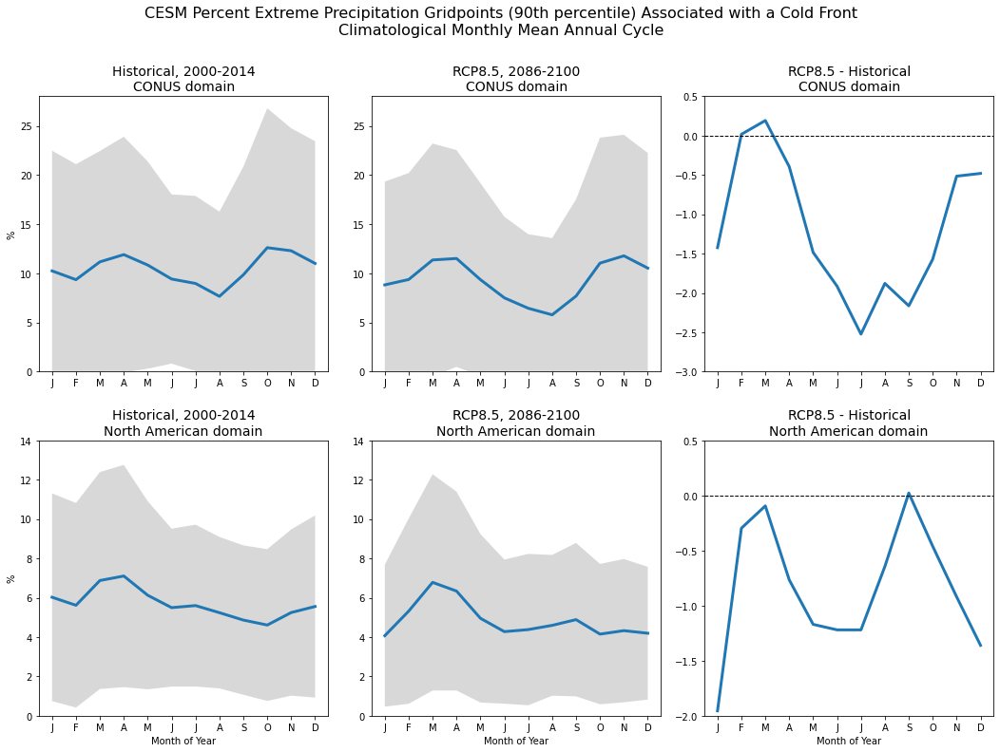

In [149]:
fig, axs = plt.subplots(2, 3, figsize=(18,12))

# CONUS, hist
axs[0,0].plot(npercentPEx_c_monthofyear_CONUS.month, npercentPEx_c_monthofyear_CONUS, linewidth=3)
axs[0,0].fill_between(npercentPEx_c_monthofyear_CONUS.month, npercentPEx_c_monthofyear_CONUS-npercentPEx_c_monthofyear_std_CONUS, 
                npercentPEx_c_monthofyear_CONUS+npercentPEx_c_monthofyear_std_CONUS, alpha=0.3, facecolor='grey')
axs[0,0].set_xticks(np.arange(12)+1)
axs[0,0].set_xticklabels(['J','F','M','A','M','J','J','A','S','O','N','D'])
#axs[0,0].set_ylim(0,30) # 90th
axs[0,0].set_ylim(0,28) # 90th, land only
axs[0,0].set_ylabel('%')
axs[0,0].set_title('Historical, 2000-2014\nCONUS domain', fontsize=14)

# CONUS, rcp
axs[0,1].plot(npercentPEx_c_rcp85_monthofyear_CONUS.month, npercentPEx_c_rcp85_monthofyear_CONUS, linewidth=3)
axs[0,1].fill_between(npercentPEx_c_rcp85_monthofyear_CONUS.month, npercentPEx_c_rcp85_monthofyear_CONUS-npercentPEx_c_rcp85_monthofyear_std_CONUS, 
                npercentPEx_c_rcp85_monthofyear_CONUS+npercentPEx_c_rcp85_monthofyear_std_CONUS, alpha=0.3, facecolor='grey')
axs[0,1].set_xticks(np.arange(12)+1) 
axs[0,1].set_xticklabels(['J','F','M','A','M','J','J','A','S','O','N','D'])
#axs[0,1].set_ylim(0,30)
axs[0,1].set_ylim(0,28)
axs[0,1].set_title('RCP8.5, 2086-2100\nCONUS domain', fontsize=14);

# CONUS, diff
axs[0,2].plot(npercentPEx_c_monthofyear_CONUS_diff.month, npercentPEx_c_monthofyear_CONUS_diff, linewidth=3)
axs[0,2].axhline(y=0, c='k', linestyle='dashed', linewidth=1)
axs[0,2].set_xticks(np.arange(12)+1) 
axs[0,2].set_xticklabels(['J','F','M','A','M','J','J','A','S','O','N','D'])
#axs[0,2].set_ylim(-3.5,0)
axs[0,2].set_ylim(-3,0.5)
axs[0,2].set_title('RCP8.5 - Historical\nCONUS domain', fontsize=14);

# NA, hist
axs[1,0].plot(npercentPEx_c_monthofyear.month, npercentPEx_c_monthofyear, linewidth=3)
axs[1,0].fill_between(npercentPEx_c_monthofyear.month, npercentPEx_c_monthofyear-npercentPEx_c_monthofyear_std, 
                npercentPEx_c_monthofyear+npercentPEx_c_monthofyear_std, alpha=0.3, facecolor='grey')
axs[1,0].set_xticks(np.arange(12)+1)
axs[1,0].set_xticklabels(['J','F','M','A','M','J','J','A','S','O','N','D'])
axs[1,0].set_xlabel('Month of Year')
#axs[1,0].set_ylim(0,18)
axs[1,0].set_ylim(0,14)
axs[1,0].set_ylabel('%')
axs[1,0].set_title('Historical, 2000-2014\nNorth American domain', fontsize=14);

# NA, rcp
axs[1,1].plot(npercentPEx_c_rcp85_monthofyear.month, npercentPEx_c_rcp85_monthofyear, linewidth=3)
axs[1,1].fill_between(npercentPEx_c_rcp85_monthofyear.month, npercentPEx_c_rcp85_monthofyear-npercentPEx_c_rcp85_monthofyear_std, 
                npercentPEx_c_rcp85_monthofyear+npercentPEx_c_rcp85_monthofyear_std, alpha=0.3, facecolor='grey')
axs[1,1].set_xticks(np.arange(12)+1)
axs[1,1].set_xticklabels(['J','F','M','A','M','J','J','A','S','O','N','D'])
axs[1,1].set_xlabel('Month of Year')
#axs[1,1].set_ylim(0,18)
axs[1,1].set_ylim(0,14)
axs[1,1].set_title('RCP8.5, 2086-2100\nNorth American domain', fontsize=14);

# NA, diff
axs[1,2].plot(npercentPEx_c_monthofyear_diff.month, npercentPEx_c_monthofyear_diff, linewidth=3)
axs[1,2].axhline(y=0, c='k', linestyle='dashed', linewidth=1)
axs[1,2].set_xticks(np.arange(12)+1) 
axs[1,2].set_xticklabels(['J','F','M','A','M','J','J','A','S','O','N','D'])
axs[1,2].set_xlabel('Month of Year')
#axs[1,2].set_ylim(-2.5,0)
axs[1,2].set_ylim(-2,0.5)
axs[1,2].set_title('RCP8.5 - Historical\nNorth American domain', fontsize=14);

fig.suptitle('CESM Percent Extreme Precipitation Gridpoints (90th percentile) Associated with a Cold Front\nClimatological Monthly Mean Annual Cycle', fontsize=16, y=0.99)

plt.subplots_adjust(wspace=0.15, hspace=0.25)

#plt.savefig('../figures/toSCP/npercentPEx90_monthofyear_compare_withdiff_cold_fronts.png', bbox_inches='tight')
#plt.savefig('../figures/toSCP/npercentPEx90_monthofyear_compare_withdiff_cold_fronts_landonly.png', bbox_inches='tight')

#### Stationary fronts

In [150]:
npercentPEx_s_monthofyear = npercentPEx_s_space.groupby("time.month").mean().persist()
npercentPEx_s_monthofyear_std = npercentPEx_s_space.groupby("time.month").std().persist()
npercentPEx_s_rcp85_monthofyear = npercentPEx_s_space_rcp.groupby("time.month").mean().persist()
npercentPEx_s_rcp85_monthofyear_std = npercentPEx_s_space_rcp.groupby("time.month").std().persist()
npercentPEx_s_monthofyear_CONUS = npercentPEx_s_space_CONUS.groupby("time.month").mean().persist()
npercentPEx_s_monthofyear_std_CONUS = npercentPEx_s_space_CONUS.groupby("time.month").std().persist()
npercentPEx_s_rcp85_monthofyear_CONUS = npercentPEx_s_space_CONUS_rcp.groupby("time.month").mean().persist()
npercentPEx_s_rcp85_monthofyear_std_CONUS = npercentPEx_s_space_CONUS_rcp.groupby("time.month").std().persist()

In [151]:
npercentPEx_s_monthofyear_CONUS_diff = npercentPEx_s_rcp85_monthofyear_CONUS - npercentPEx_s_monthofyear_CONUS
npercentPEx_s_monthofyear_diff = npercentPEx_s_rcp85_monthofyear - npercentPEx_s_monthofyear

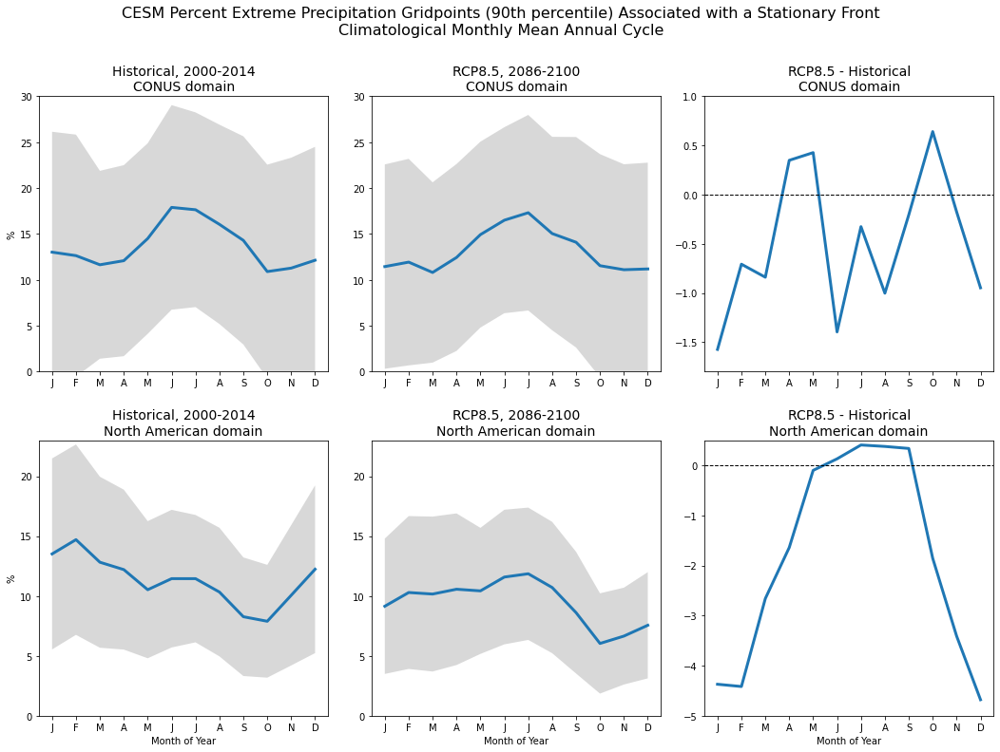

In [152]:
fig, axs = plt.subplots(2, 3, figsize=(18,12))

# CONUS, hist
axs[0,0].plot(npercentPEx_s_monthofyear_CONUS.month, npercentPEx_s_monthofyear_CONUS, linewidth=3)
axs[0,0].fill_between(npercentPEx_s_monthofyear_CONUS.month, npercentPEx_s_monthofyear_CONUS-npercentPEx_s_monthofyear_std_CONUS, 
                npercentPEx_s_monthofyear_CONUS+npercentPEx_s_monthofyear_std_CONUS, alpha=0.3, facecolor='grey')
axs[0,0].set_xticks(np.arange(12)+1)
axs[0,0].set_xticklabels(['J','F','M','A','M','J','J','A','S','O','N','D'])
axs[0,0].set_ylim(0,30) # 90th
axs[0,0].set_ylabel('%')
axs[0,0].set_title('Historical, 2000-2014\nCONUS domain', fontsize=14)

# CONUS, rcp
axs[0,1].plot(npercentPEx_s_rcp85_monthofyear_CONUS.month, npercentPEx_s_rcp85_monthofyear_CONUS, linewidth=3)
axs[0,1].fill_between(npercentPEx_s_rcp85_monthofyear_CONUS.month, npercentPEx_s_rcp85_monthofyear_CONUS-npercentPEx_s_rcp85_monthofyear_std_CONUS, 
                npercentPEx_s_rcp85_monthofyear_CONUS+npercentPEx_s_rcp85_monthofyear_std_CONUS, alpha=0.3, facecolor='grey')
axs[0,1].set_xticks(np.arange(12)+1) 
axs[0,1].set_xticklabels(['J','F','M','A','M','J','J','A','S','O','N','D'])
axs[0,1].set_ylim(0,30)
axs[0,1].set_title('RCP8.5, 2086-2100\nCONUS domain', fontsize=14);

# CONUS, diff
axs[0,2].plot(npercentPEx_s_monthofyear_CONUS_diff.month, npercentPEx_s_monthofyear_CONUS_diff, linewidth=3)
axs[0,2].axhline(y=0, c='k', linestyle='dashed', linewidth=1)
axs[0,2].set_xticks(np.arange(12)+1) 
axs[0,2].set_xticklabels(['J','F','M','A','M','J','J','A','S','O','N','D'])
#axs[0,2].set_ylim(-2,0.5)
axs[0,2].set_ylim(-1.8,1) # 90th, land only
axs[0,2].set_title('RCP8.5 - Historical\nCONUS domain', fontsize=14);

# NA, hist
axs[1,0].plot(npercentPEx_s_monthofyear.month, npercentPEx_s_monthofyear, linewidth=3)
axs[1,0].fill_between(npercentPEx_s_monthofyear.month, npercentPEx_s_monthofyear-npercentPEx_s_monthofyear_std, 
                npercentPEx_s_monthofyear+npercentPEx_s_monthofyear_std, alpha=0.3, facecolor='grey')
axs[1,0].set_xticks(np.arange(12)+1)
axs[1,0].set_xticklabels(['J','F','M','A','M','J','J','A','S','O','N','D'])
axs[1,0].set_xlabel('Month of Year')
#axs[1,0].set_ylim(2,16)
axs[1,0].set_ylim(0,23)
axs[1,0].set_ylabel('%')
axs[1,0].set_title('Historical, 2000-2014\nNorth American domain', fontsize=14);

# NA, rcp
axs[1,1].plot(npercentPEx_s_rcp85_monthofyear.month, npercentPEx_s_rcp85_monthofyear, linewidth=3)
axs[1,1].fill_between(npercentPEx_s_rcp85_monthofyear.month, npercentPEx_s_rcp85_monthofyear-npercentPEx_s_rcp85_monthofyear_std, 
                npercentPEx_s_rcp85_monthofyear+npercentPEx_s_rcp85_monthofyear_std, alpha=0.3, facecolor='grey')
axs[1,1].set_xticks(np.arange(12)+1)
axs[1,1].set_xticklabels(['J','F','M','A','M','J','J','A','S','O','N','D'])
axs[1,1].set_xlabel('Month of Year')
#axs[1,1].set_ylim(2,16)
axs[1,1].set_ylim(0,23)
axs[1,1].set_title('RCP8.5, 2086-2100\nNorth American domain', fontsize=14);

# NA, diff
axs[1,2].plot(npercentPEx_s_monthofyear_diff.month, npercentPEx_s_monthofyear_diff, linewidth=3)
axs[1,2].axhline(y=0, c='k', linestyle='dashed', linewidth=1)
axs[1,2].set_xticks(np.arange(12)+1) 
axs[1,2].set_xticklabels(['J','F','M','A','M','J','J','A','S','O','N','D'])
axs[1,2].set_xlabel('Month of Year')
#axs[1,2].set_ylim(-2.5,0.5)
axs[1,2].set_ylim(-5,0.5)
axs[1,2].set_title('RCP8.5 - Historical\nNorth American domain', fontsize=14);

fig.suptitle('CESM Percent Extreme Precipitation Gridpoints (90th percentile) Associated with a Stationary Front\nClimatological Monthly Mean Annual Cycle', fontsize=16, y=0.99)

plt.subplots_adjust(wspace=0.15, hspace=0.25)

#plt.savefig('../figures/toSCP/npercentPEx90_monthofyear_compare_withdiff_stationary_fronts.png', bbox_inches='tight')
#plt.savefig('../figures/toSCP/npercentPEx90_monthofyear_compare_withdiff_stationary_fronts_landonly.png', bbox_inches='tight')

### Seasonal spatial plots

#### North American domain

In [15]:
# persist the data 
npercentPEx = npercentPEx.persist()
npercentPEx_rcp = npercentPEx_rcp.persist()

In [139]:
npercentPEx.max().values

array(74.90842491)

In [140]:
npercentPEx_rcp.max().values

array(68.92488954)

In [141]:
# difference
npercentPEx_diff = npercentPEx_rcp - npercentPEx

In [142]:
npercentPEx_diff.max().values

array(21.41418607)

In [143]:
npercentPEx_diff.min().values

array(-33.98293443)

/glade/work/kdagon/miniconda/envs/PEx/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1887: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  result = matplotlib.axes.Axes.pcolor(self, *args, **kwargs)


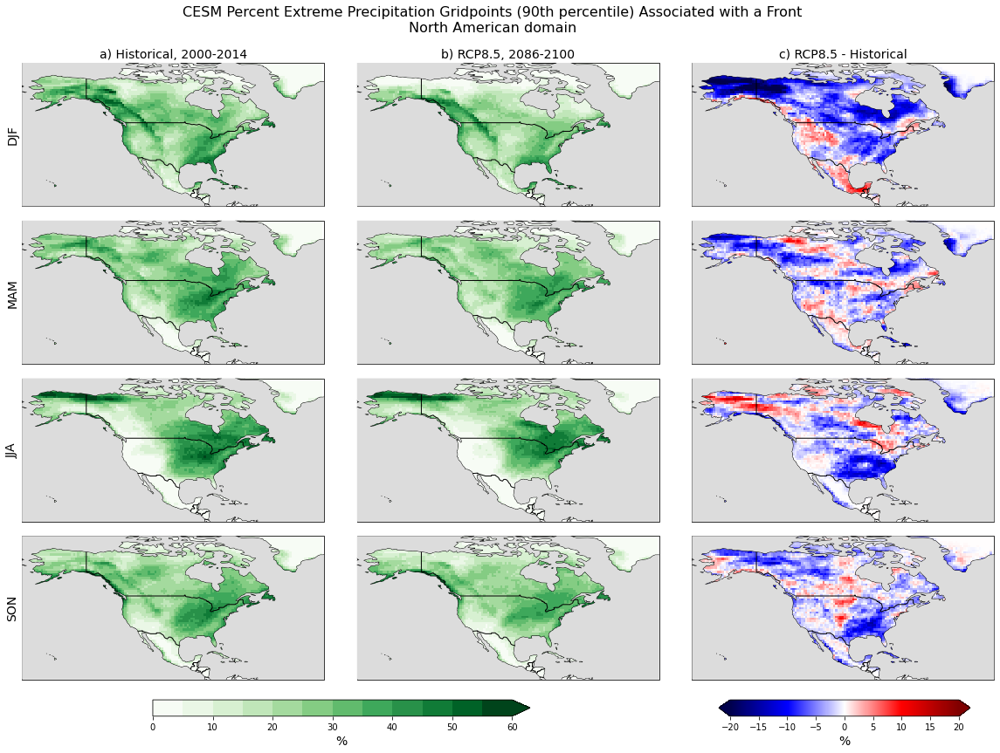

In [170]:
fig, axs = plt.subplots(4, 3, figsize=(20,13), subplot_kw={'projection': ccrs.PlateCarree()})

# discrete colormap for absolute plots
cmap=plt.cm.get_cmap('Greens', 12)
vmax = 60

for i, season in enumerate(('DJF', 'MAM', 'JJA', 'SON')):
    if i == 0:
        axs[i,0].set_title('a) Historical, 2000-2014', fontsize=14) 
    field, lon = add_cyclic_point(npercentPEx.sel(season=season), coord=npercentPEx.lon)
    lat = npercentPEx.lat
    cf = axs[i,0].pcolor(lon, lat, field, cmap=cmap, vmin=0, vmax=vmax, transform=ccrs.PlateCarree())
    axs[i,0].coastlines(zorder=1)
    axs[i,0].add_feature(cfeature.BORDERS, zorder=2)
    #axs[i,0].add_feature(cfeature.STATES, zorder=3)
    # add greyed out ocean
    axs[i,0].add_feature(cfeature.OCEAN, zorder=4, facecolor='gainsboro', edgecolor='none')
    axs[i,0].set_ylabel(season, fontsize=14)
    axs[i,0].set_yticks([])

for i, season in enumerate(('DJF', 'MAM', 'JJA', 'SON')):
    if i == 0:
        axs[i,1].set_title('b) RCP8.5, 2086-2100', fontsize=14)
    field, lon = add_cyclic_point(npercentPEx_rcp.sel(season=season), coord=npercentPEx_rcp.lon)
    lat = npercentPEx_rcp.lat
    cf = axs[i,1].pcolor(lon, lat, field, cmap=cmap, vmin=0, vmax=vmax, transform=ccrs.PlateCarree())
    axs[i,1].coastlines(zorder=1)
    axs[i,1].add_feature(cfeature.BORDERS, zorder=2)
    #axs[i,1].add_feature(cfeature.STATES, zorder=3)
    axs[i,1].add_feature(cfeature.OCEAN, zorder=4, facecolor='gainsboro', edgecolor='none')
    
# add colorbar for absolute plots
cb1_ax = fig.add_axes([0.23, 0.08, 0.3, 0.02])
norm = mpl.colors.Normalize(vmin=0, vmax=vmax)
cb1 = mpl.colorbar.ColorbarBase(cb1_ax, cmap=cmap, norm=norm, orientation='horizontal', extend='max')
cb1.ax.set_xlabel('%', fontsize=14)

# colormap for diff plots
cmap2 = plt.cm.get_cmap('seismic')
vmin2=-20
vmax2=20

for i, season in enumerate(('DJF', 'MAM', 'JJA', 'SON')):
    if i == 0:
        axs[i,2].set_title('c) RCP8.5 - Historical', fontsize=14)
    field, lon = add_cyclic_point(npercentPEx_diff.sel(season=season), coord=npercentPEx_diff.lon)
    lat = npercentPEx_diff.lat
    cf = axs[i,2].pcolor(lon, lat, field, cmap=cmap2, vmin=vmin2, vmax=vmax2, transform=ccrs.PlateCarree())
    axs[i,2].coastlines(zorder=1)
    axs[i,2].add_feature(cfeature.BORDERS, zorder=2)
    #axs[i,2].add_feature(cfeature.STATES, zorder=3)
    axs[i,2].add_feature(cfeature.OCEAN, zorder=4, facecolor='gainsboro', edgecolor='none')

# colorbar for diff plots
cb2_ax = fig.add_axes([0.68, 0.08, 0.2, 0.02])
norm2 = mpl.colors.Normalize(vmin=vmin2, vmax=vmax2)
cb2 = mpl.colorbar.ColorbarBase(cb2_ax, cmap=cmap2, norm=norm2, orientation='horizontal', extend='both')
cb2.ax.set_xlabel('%', fontsize=14)
    
# add title
fig.suptitle('CESM Percent Extreme Precipitation Gridpoints (90th percentile) Associated with a Front\nNorth American domain', fontsize=16, y=0.95)

plt.subplots_adjust(wspace=0.1, hspace=0.1)

#plt.savefig('../figures/toSCP/npercentPEx_time_byseason_diff.png', bbox_inches='tight')
#plt.savefig('../figures/toSCP/npercentPEx_time_byseason_diff_alterbase.png', bbox_inches='tight')
#plt.savefig('../figures/toSCP/npercentPEx_time_byseason_diff_alterbase_landonly.png', bbox_inches='tight')
# modified npercentPEx calculations
#plt.savefig('../figures/toSCP/npercentPEx90_hist_rcp_diff_NA.png', bbox_inches='tight', dpi=300)

#### CONUS domain

In [16]:
npercentPEx_CONUS = npercentPEx.sel(lat=slice(26,50), lon=slice(-125,-68)).persist()
npercentPEx_CONUS.max().values

array(61.99759963)

In [17]:
npercentPEx_CONUS_rcp = npercentPEx_rcp.sel(lat=slice(26,50), lon=slice(-125,-68)).persist()
npercentPEx_CONUS_rcp.max().values

array(57.44766861)

In [18]:
npercentPEx_CONUS_diff = npercentPEx_CONUS_rcp - npercentPEx_CONUS
npercentPEx_CONUS_diff.max().values

array(21.75116496)

In [19]:
npercentPEx_CONUS_diff.min().values

array(-25.49671557)

/glade/work/kdagon/miniconda/envs/PEx/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1887: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  result = matplotlib.axes.Axes.pcolor(self, *args, **kwargs)


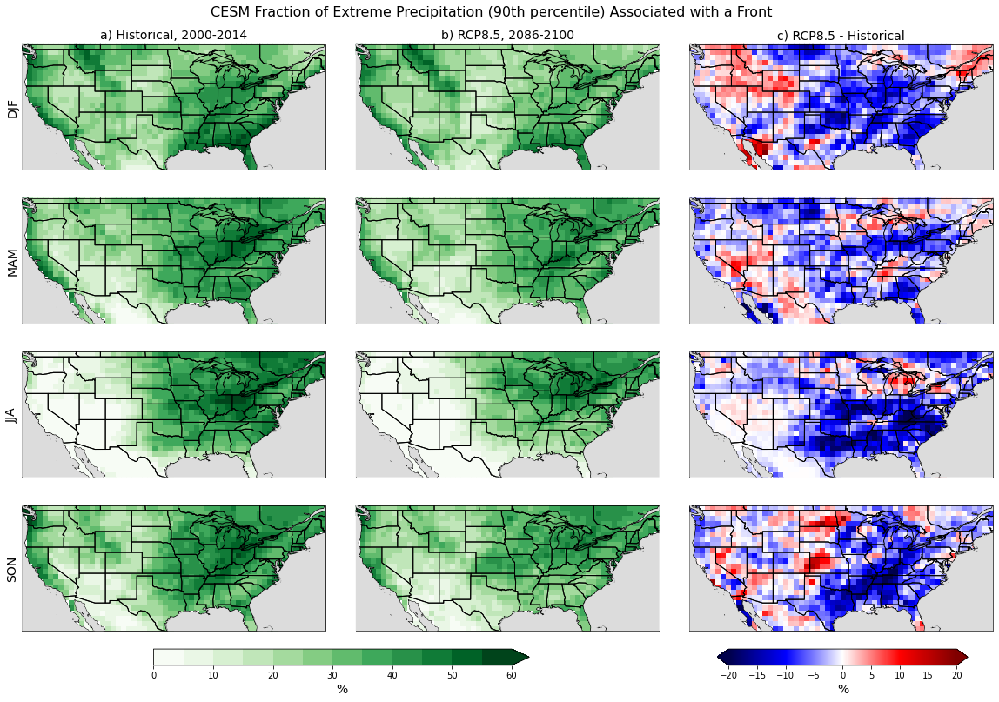

In [20]:
fig, axs = plt.subplots(4, 3, figsize=(20,13), subplot_kw={'projection': ccrs.PlateCarree()})

# discrete colormap for absolute plots
cmap=plt.cm.get_cmap('Greens', 12)
vmax = 60 # 90th, 95th, 99th percentiles

for i, season in enumerate(('DJF', 'MAM', 'JJA', 'SON')):
    if i == 0:
        axs[i,0].set_title('a) Historical, 2000-2014', fontsize=14) 
    field, lon = add_cyclic_point(npercentPEx_CONUS.sel(season=season), coord=npercentPEx_CONUS.lon)
    lat = npercentPEx_CONUS.lat
    cf = axs[i,0].pcolor(lon, lat, field, cmap=cmap, vmin=0, vmax=vmax, transform=ccrs.PlateCarree())
    axs[i,0].coastlines(zorder=1)
    axs[i,0].add_feature(cfeature.BORDERS, zorder=2)
    axs[i,0].add_feature(cfeature.STATES, zorder=3)
    # add greyed out ocean
    axs[i,0].add_feature(cfeature.OCEAN, zorder=4, facecolor='gainsboro', edgecolor='none')
    axs[i,0].set_ylabel(season, fontsize=14)
    axs[i,0].set_yticks([])

for i, season in enumerate(('DJF', 'MAM', 'JJA', 'SON')):
    if i == 0:
        axs[i,1].set_title('b) RCP8.5, 2086-2100', fontsize=14)
    field, lon = add_cyclic_point(npercentPEx_CONUS_rcp.sel(season=season), coord=npercentPEx_CONUS_rcp.lon)
    lat = npercentPEx_CONUS_rcp.lat
    cf = axs[i,1].pcolor(lon, lat, field, cmap=cmap, vmin=0, vmax=vmax, transform=ccrs.PlateCarree())
    axs[i,1].coastlines(zorder=1)
    axs[i,1].add_feature(cfeature.BORDERS, zorder=2)
    axs[i,1].add_feature(cfeature.STATES, zorder=3)
    axs[i,1].add_feature(cfeature.OCEAN, zorder=4, facecolor='gainsboro', edgecolor='none')
    
# add colorbar for absolute plots
cb1_ax = fig.add_axes([0.23, 0.1, 0.3, 0.02])
norm = mpl.colors.Normalize(vmin=0, vmax=vmax)
#cb1 = mpl.colorbar.ColorbarBase(cb1_ax, cmap=cmap, norm=norm, orientation='horizontal')
cb1 = mpl.colorbar.ColorbarBase(cb1_ax, cmap=cmap, norm=norm, orientation='horizontal', extend='max')
cb1.ax.set_xlabel('%', fontsize=14)

# colormap for diff plots
cmap2 = plt.cm.get_cmap('seismic')
# 90th, 95th, 99th percentiles
vmin2=-20
vmax2=20

for i, season in enumerate(('DJF', 'MAM', 'JJA', 'SON')):
    if i == 0:
        axs[i,2].set_title('c) RCP8.5 - Historical', fontsize=14)
    field, lon = add_cyclic_point(npercentPEx_CONUS_diff.sel(season=season), coord=npercentPEx_CONUS_diff.lon)
    lat = npercentPEx_CONUS_diff.lat
    cf = axs[i,2].pcolor(lon, lat, field, cmap=cmap2, vmin=vmin2, vmax=vmax2, transform=ccrs.PlateCarree())
    axs[i,2].coastlines(zorder=1)
    axs[i,2].add_feature(cfeature.BORDERS, zorder=2)
    axs[i,2].add_feature(cfeature.STATES, zorder=3)
    axs[i,2].add_feature(cfeature.OCEAN, zorder=4, facecolor='gainsboro', edgecolor='none')

# colorbar for diff plots
cb2_ax = fig.add_axes([0.68, 0.1, 0.2, 0.02])
norm2 = mpl.colors.Normalize(vmin=vmin2, vmax=vmax2)
cb2 = mpl.colorbar.ColorbarBase(cb2_ax, cmap=cmap2, norm=norm2, orientation='horizontal', extend='both')
cb2.ax.set_xlabel('%', fontsize=14)    
    
# add title
#fig.suptitle('CESM Percent Extreme Precipitation Gridpoints (90th percentile) Associated with a Front\nCONUS domain', fontsize=16, y=0.94)
#fig.suptitle('CESM Percent Extreme Precipitation Gridpoints (95th percentile) Associated with a Front\nCONUS domain', fontsize=16, y=0.94)
#fig.suptitle('CESM Percent Extreme Precipitation Gridpoints (99th percentile) Associated with a Front\nCONUS domain', fontsize=16, y=0.94)

#fig.suptitle('CESM Percent Extreme Precipitation Gridpoints (90th percentile) Associated with a Front', fontsize=16, y=0.91)
#fig.suptitle('CESM Percent Extreme Precipitation Gridpoints (95th percentile) Associated with a Front', fontsize=16, y=0.91)
#fig.suptitle('CESM Percent Extreme Precipitation Gridpoints (99th percentile) Associated with a Front', fontsize=16, y=0.91)

fig.suptitle('CESM Fraction of Extreme Precipitation (90th percentile) Associated with a Front', fontsize=16, y=0.91)
#fig.suptitle('CESM Fraction of Extreme Precipitation (95th percentile) Associated with a Front', fontsize=16, y=0.91)
#fig.suptitle('CESM Fraction of Extreme Precipitation (99th percentile) Associated with a Front', fontsize=16, y=0.91)

plt.subplots_adjust(wspace=0.1, hspace=0)

#plt.savefig('../figures/toSCP/npercentPEx_time_CONUS_byseason_diff.png', bbox_inches='tight')
#plt.savefig('../figures/toSCP/npercentPEx95_time_CONUS_byseason_diff.png', bbox_inches='tight')
#plt.savefig('../figures/toSCP/npercentPEx99_time_CONUS_byseason_diff.png', bbox_inches='tight')

# plots with altered PEx baseline for RCP simulation
#plt.savefig('../figures/toSCP/npercentPEx90_time_CONUS_byseason_diff_alterbase.png', bbox_inches='tight')
#plt.savefig('../figures/toSCP/npercentPEx95_time_CONUS_byseason_diff_alterbase.png', bbox_inches='tight')
#plt.savefig('../figures/toSCP/npercentPEx99_time_CONUS_byseason_diff_alterbase.png', bbox_inches='tight')

# plot with PRECT conservative regridding
#plt.savefig('../figures/toSCP/npercentPEx90_time_CONUS_byseason_diff_alterbase_consregrid.png', bbox_inches='tight')

# plot land points only
#plt.savefig('../figures/toSCP/npercentPEx90_time_CONUS_byseason_diff_alterbase_landonly.png', bbox_inches='tight')
#plt.savefig('../figures/toSCP/npercentPEx95_time_CONUS_byseason_diff_alterbase_landonly.png', bbox_inches='tight')
#plt.savefig('../figures/toSCP/npercentPEx99_time_CONUS_byseason_diff_alterbase_landonly.png', bbox_inches='tight')

# modified npercentPEx calculations
#plt.savefig('../figures/toSCP/npercentPEx90_hist_rcp_diff_CONUS.png', bbox_inches='tight', dpi=300)
#plt.savefig('../figures/toSCP/npercentPEx95_hist_rcp_diff_CONUS.png', bbox_inches='tight', dpi=300)
#plt.savefig('../figures/toSCP/npercentPEx99_hist_rcp_diff_CONUS.png', bbox_inches='tight', dpi=300)

# npercentPEx calculated on an amount basis (rather than number of points)
#plt.savefig('../figures/toSCP/PEx90_frontfrac_hist_rcp_diff_CONUS.png', bbox_inches='tight', dpi=300)
#plt.savefig('../figures/toSCP/PEx95_frontfrac_hist_rcp_diff_CONUS.png', bbox_inches='tight', dpi=300)
#plt.savefig('../figures/toSCP/PEx99_frontfrac_hist_rcp_diff_CONUS.png', bbox_inches='tight', dpi=300)

#### By front type

In [20]:
npercentPEx_type_CONUS = npercentPEx_type.sel(lat=slice(26,50), lon=slice(-125,-68)).persist()
npercentPEx_type_CONUS_rcp = npercentPEx_type_rcp.sel(lat=slice(26,50), lon=slice(-125,-68)).persist()

In [21]:
npercentPEx_type_CONUS.max(dim=('lat','lon','season')).values

array([37.55607492, 37.78932153, 47.13747784, 24.57297415])

In [22]:
npercentPEx_type_CONUS_rcp.max(dim=('lat','lon','season')).values

array([35.94780771, 29.29077997, 46.81859837, 15.2908189 ])

In [23]:
npercentPEx_type_CONUS_diff = npercentPEx_type_CONUS_rcp - npercentPEx_type_CONUS
#npercentPEx_type_CONUS_diff

In [24]:
npercentPEx_type_CONUS_diff.max(dim=('lat','lon','season')).values

array([24.56523009, 17.44093885, 17.49853529,  7.78668913])

In [25]:
npercentPEx_type_CONUS_diff.min(dim=('lat','lon','season')).values

array([-18.25489858, -11.18038032, -31.53726628, -22.64593092])

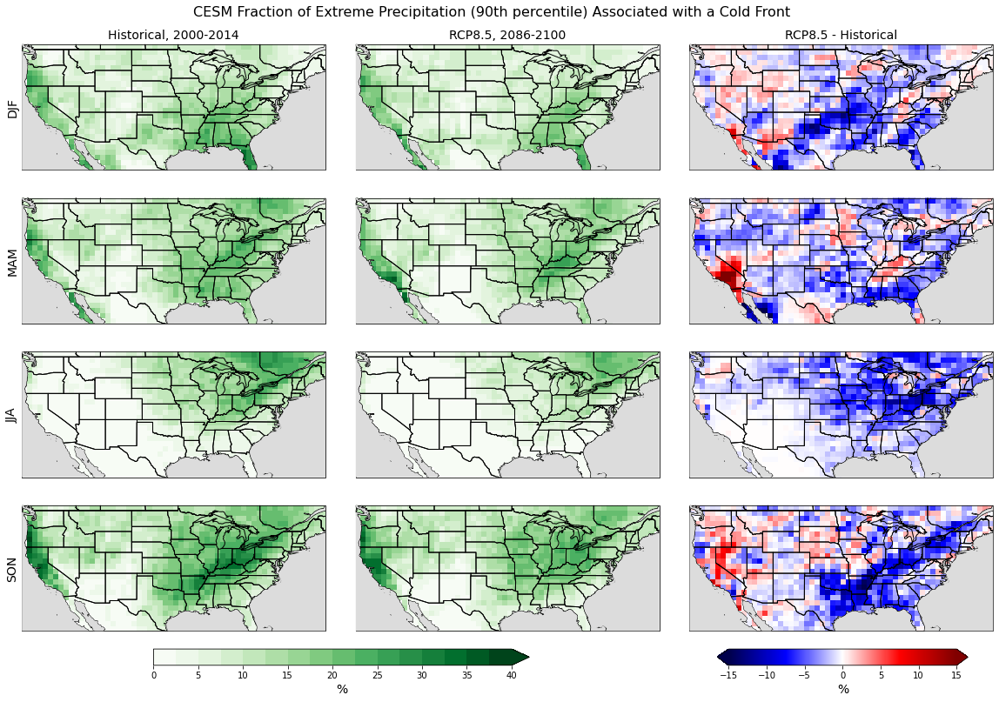

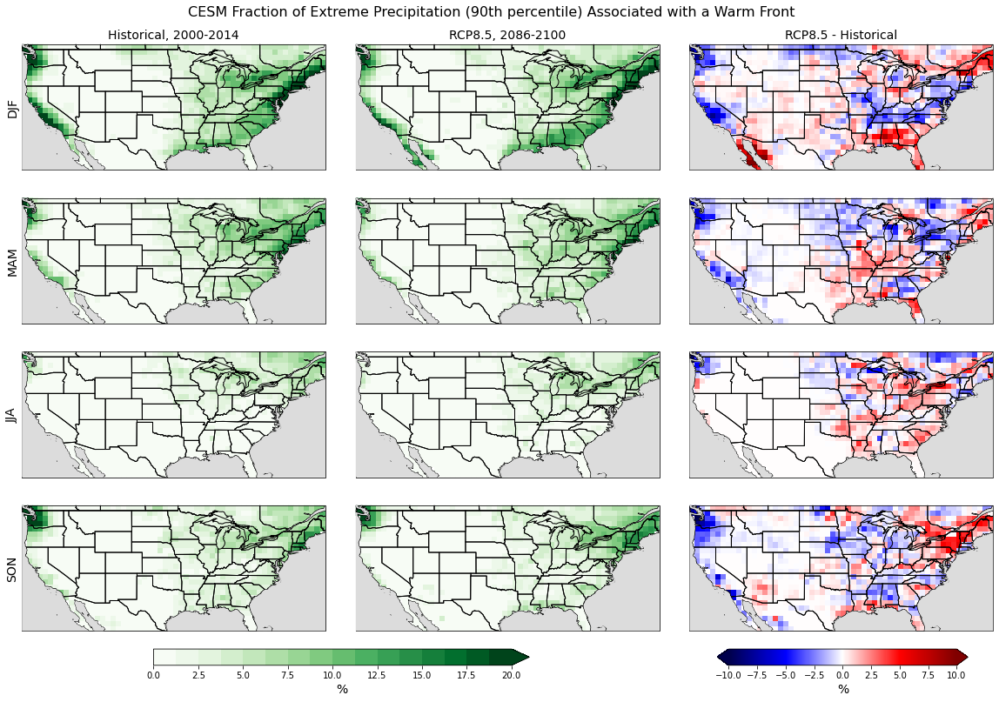

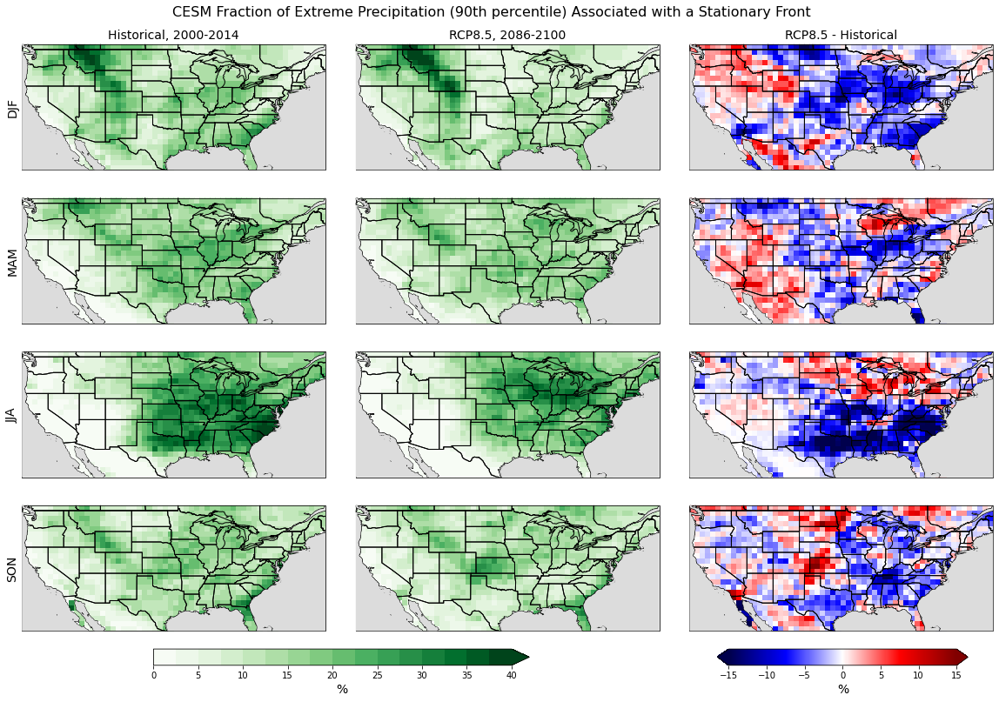

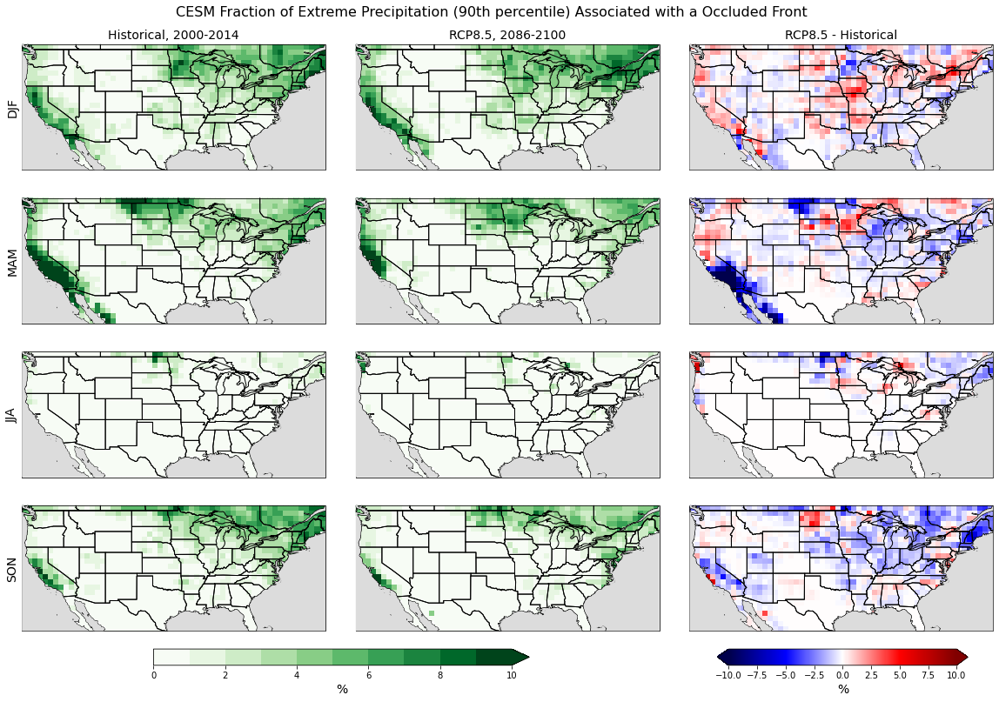

In [48]:
# loop over front type
frstrings = ('Cold', 'Warm', 'Stationary', 'Occluded') # for labels
ftypes = ('cold', 'warm', 'stationary', 'occluded') # lowercase for indexing
nfr = len(frstrings)

vmaxes = [40,20,40,10]
ncols = [16,16,16,10]
vdiffs = [15,10,15,10]

# then season
seastrings = ('DJF', 'MAM', 'JJA', 'SON')
nsea = len(seastrings)

for f in range(nfr):
    fig, axs = plt.subplots(nsea, 3, figsize=(20,13), subplot_kw={'projection': ccrs.PlateCarree()})

    # discrete colormap for absolute plots
    cmap=plt.cm.get_cmap('Greens',ncols[f])
    vmax = vmaxes[f]

    for i, season in enumerate(seastrings):
        if i == 0:
            axs[i,0].set_title('Historical, 2000-2014', fontsize=14) 
        field, lon = add_cyclic_point(npercentPEx_type_CONUS.sel(season=season, front_type=ftypes[f]), coord=npercentPEx_type_CONUS.lon)
        lat = npercentPEx_type_CONUS.lat
        cf = axs[i,0].pcolor(lon, lat, field, cmap=cmap, vmin=0, vmax=vmax, transform=ccrs.PlateCarree())
        axs[i,0].coastlines(zorder=1)
        axs[i,0].add_feature(cfeature.BORDERS, zorder=2)
        axs[i,0].add_feature(cfeature.STATES, zorder=3)
        # add greyed out ocean
        axs[i,0].add_feature(cfeature.OCEAN, zorder=4, facecolor='gainsboro', edgecolor='none')
        axs[i,0].set_ylabel(season, fontsize=14)
        axs[i,0].set_yticks([])

    for i, season in enumerate(('DJF', 'MAM', 'JJA', 'SON')):
        if i == 0:
            axs[i,1].set_title('RCP8.5, 2086-2100', fontsize=14)
        field, lon = add_cyclic_point(npercentPEx_type_CONUS_rcp.sel(season=season, front_type=ftypes[f]), coord=npercentPEx_type_CONUS_rcp.lon)
        lat = npercentPEx_type_CONUS_rcp.lat
        cf = axs[i,1].pcolor(lon, lat, field, cmap=cmap, vmin=0, vmax=vmax, transform=ccrs.PlateCarree())
        axs[i,1].coastlines(zorder=1)
        axs[i,1].add_feature(cfeature.BORDERS, zorder=2)
        axs[i,1].add_feature(cfeature.STATES, zorder=3)
        axs[i,1].add_feature(cfeature.OCEAN, zorder=4, facecolor='gainsboro', edgecolor='none')
    
    # add colorbar for absolute plots
    cb1_ax = fig.add_axes([0.23, 0.1, 0.3, 0.02])
    norm = mpl.colors.Normalize(vmin=0, vmax=vmax)
    cb1 = mpl.colorbar.ColorbarBase(cb1_ax, cmap=cmap, norm=norm, orientation='horizontal', extend='max')
    #cb1 = mpl.colorbar.ColorbarBase(cb1_ax, cmap=cmap, norm=norm, orientation='horizontal')
    cb1.ax.set_xlabel('%', fontsize=14)

    # colormap for diff plots
    cmap2 = plt.cm.get_cmap('seismic')
    vmin2=-vdiffs[f]
    vmax2=vdiffs[f]

    for i, season in enumerate(('DJF', 'MAM', 'JJA', 'SON')):
        if i == 0:
            axs[i,2].set_title('RCP8.5 - Historical', fontsize=14)
        field, lon = add_cyclic_point(npercentPEx_type_CONUS_diff.sel(season=season, front_type=ftypes[f]), coord=npercentPEx_type_CONUS_diff.lon)
        lat = npercentPEx_type_CONUS_diff.lat
        cf = axs[i,2].pcolor(lon, lat, field, cmap=cmap2, vmin=vmin2, vmax=vmax2, transform=ccrs.PlateCarree())
        axs[i,2].coastlines(zorder=1)
        axs[i,2].add_feature(cfeature.BORDERS, zorder=2)
        axs[i,2].add_feature(cfeature.STATES, zorder=3)
        axs[i,2].add_feature(cfeature.OCEAN, zorder=4, facecolor='gainsboro', edgecolor='none')

    # colorbar for diff plots
    cb2_ax = fig.add_axes([0.68, 0.1, 0.2, 0.02])
    norm2 = mpl.colors.Normalize(vmin=vmin2, vmax=vmax2)
    cb2 = mpl.colorbar.ColorbarBase(cb2_ax, cmap=cmap2, norm=norm2, orientation='horizontal', extend='both')
    cb2.ax.set_xlabel('%', fontsize=14)    
    
    # add title
    fig.suptitle('CESM Fraction of Extreme Precipitation (90th percentile) Associated with a '+frstrings[f]+' Front', fontsize=16, y=0.91)

    plt.subplots_adjust(wspace=0.1, hspace=0)

    #plt.savefig('../figures/toSCP/npercentPEx90_time_CONUS_byseason_diff_cold_fronts.png', bbox_inches='tight')
    #plt.savefig('../figures/toSCP/npercentPEx90_time_CONUS_byseason_diff_cold_fronts_landonly.png', bbox_inches='tight')
    #plt.savefig('../figures/toSCP/npercentPEx90_hist_rcp_diff_'+ftypes[f]+'_fronts_CONUS.png', bbox_inches='tight', dpi=300)
    plt.savefig('../figures/toSCP/PEx90_frontfrac_hist_rcp_diff_'+ftypes[f]+'_fronts_CONUS.png', bbox_inches='tight', dpi=300)

### Probability Ratio

$PR = (N_P|F/N_F)/(N_P/N)$ where $N$, $N_P$, $N_F$, and $N_P|F$ are the number of time steps, number of time steps with extreme precipitation, number of time steps with fronts, and number of extreme precipitation time steps associated with fronts, i.e., comparing the conditional probability of extreme precipitation during fronts to the climatological probability of extreme precipitation

In [26]:
def prob_ratio(fronts, PEx):
    # number of time steps (constant value)
    N = fronts.shape[0]
    
    # number of time steps with extreme precipitation (spatial map, constant value over land for historical sim, varies in space for rcp sim)
    N_P = PEx.notnull().sum(dim='time')
    
    # number of time steps with fronts (spatial map)
    N_F = fronts.notnull().sum(dim='time')
    
    # number of extreme precipitation time steps associated with fronts (spatial map)
    N_P_F = PEx.where(fronts.notnull()).notnull().sum(dim='time')  
    
    # probability ratio
    PR = (N_P_F/N_F)/(N_P/N)
    
    return(PR)

In [27]:
PR = prob_ratio(fronts, PEx)
PR_rcp = prob_ratio(fronts_rcp, PEx_rcp)

#### Seasonal PRs

In [27]:
def prob_ratio_season(fronts, PEx):
    # number of time steps in each season
    N_season = fronts.time.groupby('time.season').count()
    print(N_season)
    
    # number of time steps in each season with extreme precipitation (spatial maps, constant values over land for historical sim, varies in space for rcp sim)
    N_P_season = PEx.notnull().groupby('time.season').sum(dim='time')
    
    # number of time steps in each season with fronts (spatial maps)
    N_F_season = fronts.notnull().groupby('time.season').sum(dim='time')
    
    # number of extreme precipitation time steps associated with fronts (spatial maps)
    N_P_F_season = PEx.where(fronts.notnull()).notnull().groupby('time.season').sum(dim='time') 
    
    #print((N_P_F_season/N_F_season).max().values)
    #print((N_P_season/N_season).max().values)
    
    # probability ratio
    PR_season = (N_P_F_season/N_F_season)/(N_P_season/N_season)
    
    return(PR_season, N_P_season/N_season)

In [28]:
PR_season, denom = prob_ratio_season(fronts, PEx_season)
PR_season_rcp, denom_rcp = prob_ratio_season(fronts_rcp, PEx_season_rcp)

<xarray.DataArray 'time' (season: 4)>
array([10800, 11040, 11040, 10920])
Coordinates:
  * season   (season) object 'DJF' 'JJA' 'MAM' 'SON'
<xarray.DataArray 'time' (season: 4)>
array([10800, 11040, 11040, 10920])
Coordinates:
  * season   (season) object 'DJF' 'JJA' 'MAM' 'SON'


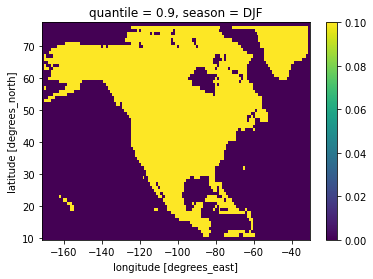

In [29]:
# sanity checking the denominator is constant across space for the historical simulation
denom.sel(season='DJF').plot()

In [30]:
denom.sel(season='DJF').max().values

array(0.1)

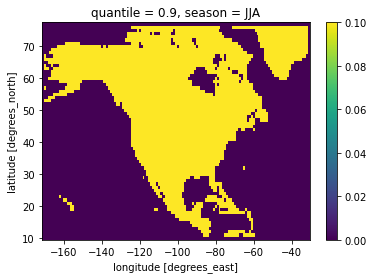

In [32]:
denom.sel(season='JJA').plot()

In [35]:
denom.sel(season='JJA').max().values

array(0.1)

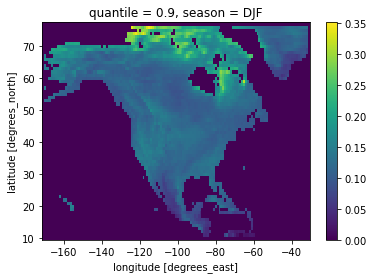

In [36]:
denom_rcp.sel(season='DJF').plot()

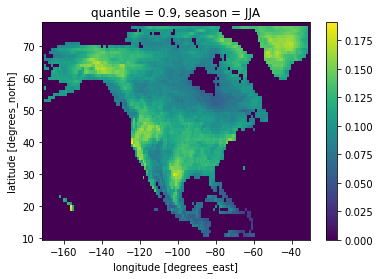

In [37]:
denom_rcp.sel(season='JJA').plot()

In [108]:
PR_season_CONUS = PR_season.sel(lat=slice(26,50), lon=slice(-125,-68)).persist()
print(PR_season_CONUS.max().values)
print(PR_season_CONUS.min().values)

24.864864864864867
0.0


In [109]:
PR_season_CONUS_rcp = PR_season_rcp.sel(lat=slice(26,50), lon=slice(-125,-68)).persist()
print(PR_season_CONUS_rcp.max().values)
print(PR_season_CONUS_rcp.min().values)

60.00000000000001
0.0


In [102]:
PR_season_CONUS_diff = PR_season_CONUS_rcp - PR_season_CONUS
print(PR_season_CONUS_diff.max().values)
print(PR_season_CONUS_diff.min().values)

11.694915254237289
-8.571428571428571


In [34]:
PR_season_CONUS_perdiff = 100*(PR_season_CONUS_diff/PR_season_CONUS)
print(PR_season_CONUS_perdiff.max().values)
print(PR_season_CONUS_perdiff.min().values)

inf
-100.0


PR is larger than one when the conditional occurrence exceeds the unconditional occurrence probability.\
PR is close to one when extreme precipitation is not associated with frontal occurrence.\
See Fischer & Knutti (2015)

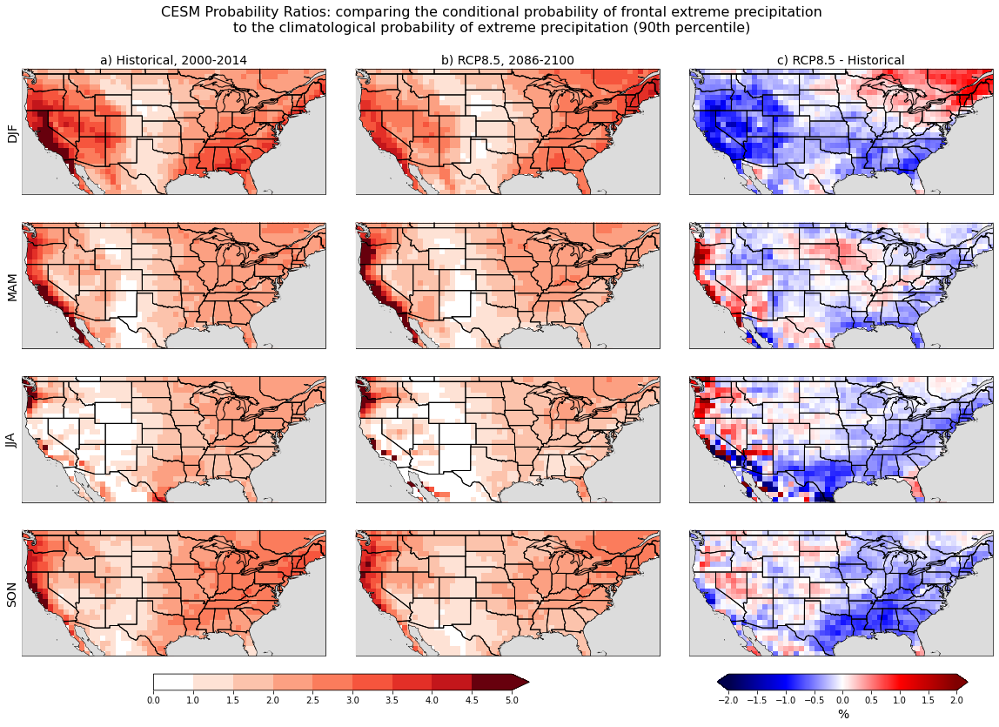

In [24]:
fig, axs = plt.subplots(4, 3, figsize=(20,13), subplot_kw={'projection': ccrs.PlateCarree()})

# continuous colormap centered on 1
#cmap = plt.cm.get_cmap('seismic')
# different mapping on either side of center
#norm = mpl.colors.TwoSlopeNorm(vmin=vmin, vmax=vmax, vcenter=1)

# discrete colorbar with specific colors
#cmap = mpl.colors.ListedColormap(['grey', 'lightcoral','indianred', 'firebrick', 'darkred'])
#bounds = [0, 1, 2, 3, 4, 5]
#norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

# using color sampled from Reds
reds = plt.cm.get_cmap('Reds', 10)
reds_cmap = reds(range(10))
#reds_cmap[0] = mpl.colors.to_rgba_array('grey') # replace first color with grey (optional)
reds_cmap[0] = mpl.colors.to_rgba_array('white') # replace first color with white
cmap = mpl.colors.ListedColormap(reds_cmap)
bounds = [0,1,1.5,2,2.5,3,3.5,4,4.5,5] # custom bounds to have one color between 0-1
#bounds = [1,1.5,2,2.5,3,3.5,4,4.5,5,5.5] #
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

vmin=0
vmax=5

for i, season in enumerate(('DJF', 'MAM', 'JJA', 'SON')):
    if i == 0:
        axs[i,0].set_title('a) Historical, 2000-2014', fontsize=14) 
    field, lon = add_cyclic_point(PR_season_CONUS.sel(season=season), coord=PR_season_CONUS.lon)
    lat = PR_season_CONUS.lat
    cf = axs[i,0].pcolor(lon, lat, field, cmap=cmap, vmin=vmin, vmax=vmax, norm=norm, transform=ccrs.PlateCarree())
    axs[i,0].coastlines(zorder=1)
    axs[i,0].add_feature(cfeature.BORDERS, zorder=2)
    axs[i,0].add_feature(cfeature.STATES, zorder=3)
    # add greyed out ocean
    axs[i,0].add_feature(cfeature.OCEAN, zorder=4, facecolor='gainsboro', edgecolor='none')
    axs[i,0].set_ylabel(season, fontsize=14)
    axs[i,0].set_yticks([])

for i, season in enumerate(('DJF', 'MAM', 'JJA', 'SON')):
    if i == 0:
        axs[i,1].set_title('b) RCP8.5, 2086-2100', fontsize=14)
    field, lon = add_cyclic_point(PR_season_CONUS_rcp.sel(season=season), coord=PR_season_CONUS_rcp.lon)
    lat = PR_season_CONUS_rcp.lat
    cf = axs[i,1].pcolor(lon, lat, field, cmap=cmap, vmin=vmin, vmax=vmax, norm=norm, transform=ccrs.PlateCarree())
    axs[i,1].coastlines(zorder=1)
    axs[i,1].add_feature(cfeature.BORDERS, zorder=2)
    axs[i,1].add_feature(cfeature.STATES, zorder=3)
    axs[i,1].add_feature(cfeature.OCEAN, zorder=4, facecolor='gainsboro', edgecolor='none')
    
# add colorbar for absolute plots
cb1_ax = fig.add_axes([0.23, 0.1, 0.3, 0.02])
cb1 = mpl.colorbar.ColorbarBase(cb1_ax, cmap=cmap, norm=norm, orientation='horizontal', extend='max')
#cb1 = mpl.colorbar.ColorbarBase(cb1_ax, cmap=cmap, norm=norm, orientation='horizontal', extend='both')

# colormap for diff plots
cmap2 = plt.cm.get_cmap('seismic')
# absolute changes
vmin2=-2
vmax2=2
# relative changes
#vmin2=-100
#vmax2=100

for i, season in enumerate(('DJF', 'MAM', 'JJA', 'SON')):
    if i == 0:
        axs[i,2].set_title('c) RCP8.5 - Historical', fontsize=14)
    field, lon = add_cyclic_point(PR_season_CONUS_diff.sel(season=season), coord=PR_season_CONUS_diff.lon) # absolute
    #field, lon = add_cyclic_point(PR_season_CONUS_perdiff.sel(season=season), coord=PR_season_CONUS_perdiff.lon) # relative
    lat = PR_season_CONUS_diff.lat
    #lat = PR_season_CONUS_perdiff.lat
    cf = axs[i,2].pcolor(lon, lat, field, cmap=cmap2, vmin=vmin2, vmax=vmax2, transform=ccrs.PlateCarree())
    axs[i,2].coastlines(zorder=1)
    axs[i,2].add_feature(cfeature.BORDERS, zorder=2)
    axs[i,2].add_feature(cfeature.STATES, zorder=3)
    axs[i,2].add_feature(cfeature.OCEAN, zorder=4, facecolor='gainsboro', edgecolor='none')

# colorbar for diff plots
cb2_ax = fig.add_axes([0.68, 0.1, 0.2, 0.02])
norm2 = mpl.colors.Normalize(vmin=vmin2, vmax=vmax2)
cb2 = mpl.colorbar.ColorbarBase(cb2_ax, cmap=cmap2, norm=norm2, orientation='horizontal', extend='both')
cb2.ax.set_xlabel('%', fontsize=14) # relative

# add title
fig.suptitle('CESM Probability Ratios: comparing the conditional probability of frontal extreme precipitation\nto the climatological probability of extreme precipitation (90th percentile)', fontsize=16, y=0.94)
#fig.suptitle('CESM Probability Ratios: comparing the conditional probability of frontal extreme precipitation\nto the climatological probability of extreme precipitation (95th percentile)', fontsize=16, y=0.94)
#fig.suptitle('CESM Probability Ratios: comparing the conditional probability of frontal extreme precipitation\nto the climatological probability of extreme precipitation (99th percentile)', fontsize=16, y=0.94)

plt.subplots_adjust(wspace=0.1, hspace=0)

#plt.savefig('../figures/toSCP/PR90_season_hist_rcp_diff_CONUS.png', bbox_inches='tight', dpi=300)
#plt.savefig('../figures/toSCP/PR95_season_hist_rcp_diff_CONUS.png', bbox_inches='tight', dpi=300)
#plt.savefig('../figures/toSCP/PR99_season_hist_rcp_diff_CONUS.png', bbox_inches='tight', dpi=300)

#### Plotting only the absolute changes (not diffs)

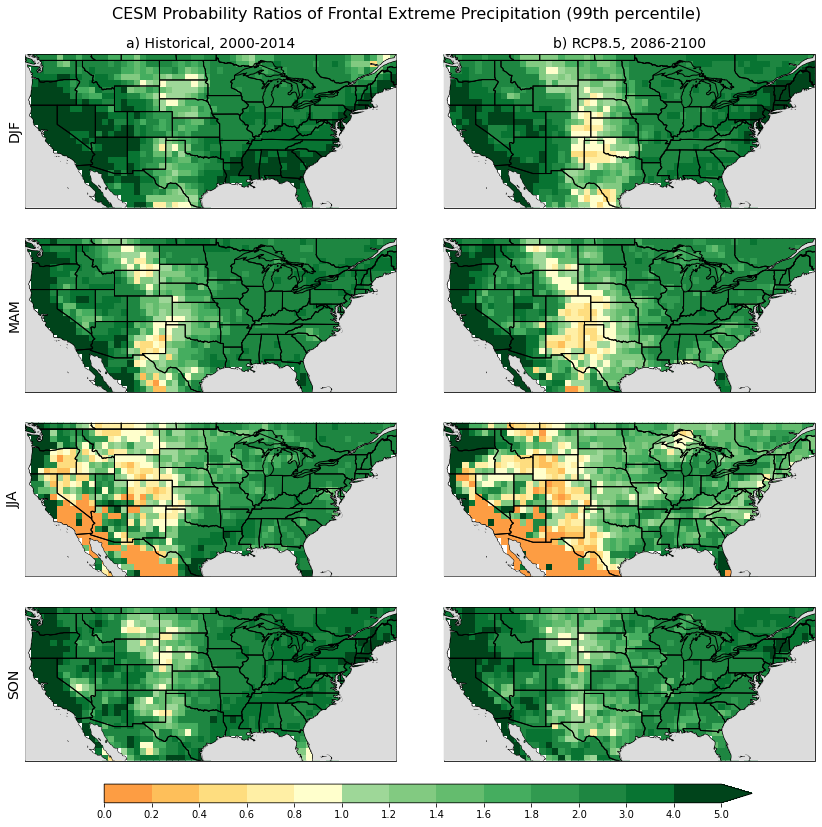

In [111]:
fig, axs = plt.subplots(4, 2, figsize=(15,13), subplot_kw={'projection': ccrs.PlateCarree()})

# using color sampled from Greens and Yellows
greens = plt.cm.get_cmap('Greens', 14)
greens_cmap = greens(range(14))
yellows = plt.cm.get_cmap('YlOrRd', 10)
yellows_cmap = yellows(range(5))
greens_cmap[:5] = np.flip(yellows_cmap, axis=0) # replace first 5 colors with flipped yellows
cmap = mpl.colors.ListedColormap(greens_cmap)
bounds = [0,0.2,0.4,0.6,0.8,1,1.2,1.4,1.6,1.8,2,3,4,5] # custom bounds sampling close to 1 on either side
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

vmin=0
vmax=5

for i, season in enumerate(('DJF', 'MAM', 'JJA', 'SON')):
    if i == 0:
        axs[i,0].set_title('a) Historical, 2000-2014', fontsize=14) 
    field, lon = add_cyclic_point(PR_season_CONUS.sel(season=season), coord=PR_season_CONUS.lon)
    lat = PR_season_CONUS.lat
    cf = axs[i,0].pcolor(lon, lat, field, cmap=cmap, vmin=vmin, vmax=vmax, norm=norm, transform=ccrs.PlateCarree())
    axs[i,0].coastlines(zorder=1)
    axs[i,0].add_feature(cfeature.BORDERS, zorder=2)
    axs[i,0].add_feature(cfeature.STATES, zorder=3)
    # add greyed out ocean
    axs[i,0].add_feature(cfeature.OCEAN, zorder=4, facecolor='gainsboro', edgecolor='none')
    axs[i,0].set_ylabel(season, fontsize=14)
    axs[i,0].set_yticks([])

for i, season in enumerate(('DJF', 'MAM', 'JJA', 'SON')):
    if i == 0:
        axs[i,1].set_title('b) RCP8.5, 2086-2100', fontsize=14)
    field, lon = add_cyclic_point(PR_season_CONUS_rcp.sel(season=season), coord=PR_season_CONUS_rcp.lon)
    lat = PR_season_CONUS_rcp.lat
    cf = axs[i,1].pcolor(lon, lat, field, cmap=cmap, vmin=vmin, vmax=vmax, norm=norm, transform=ccrs.PlateCarree())
    axs[i,1].coastlines(zorder=1)
    axs[i,1].add_feature(cfeature.BORDERS, zorder=2)
    axs[i,1].add_feature(cfeature.STATES, zorder=3)
    axs[i,1].add_feature(cfeature.OCEAN, zorder=4, facecolor='gainsboro', edgecolor='none')
    
# add colorbar for absolute plots
cb1_ax = fig.add_axes([0.22, 0.08, 0.6, 0.02])
cb1 = mpl.colorbar.ColorbarBase(cb1_ax, cmap=cmap, norm=norm, orientation='horizontal', extend='max', ticks=bounds)

# add title
#fig.suptitle('CESM Probability Ratios of Frontal Extreme Precipitation (90th percentile)', fontsize=16, y=0.93)
#fig.suptitle('CESM Probability Ratios of Frontal Extreme Precipitation (95th percentile)', fontsize=16, y=0.93)
fig.suptitle('CESM Probability Ratios of Frontal Extreme Precipitation (99th percentile)', fontsize=16, y=0.93)

plt.subplots_adjust(wspace=0, hspace=0.2)

#plt.savefig('../figures/toSCP/PR90_season_hist_rcp_CONUS.png', bbox_inches='tight', dpi=300)
#plt.savefig('../figures/toSCP/PR95_season_hist_rcp_CONUS.png', bbox_inches='tight', dpi=300)
#plt.savefig('../figures/toSCP/PR99_season_hist_rcp_CONUS.png', bbox_inches='tight', dpi=300)

#### By front type

In [99]:
PR_season_type = prob_ratio_season(fronts_type, PEx_season)
PR_season_type_rcp = prob_ratio_season(fronts_type_rcp, PEx_season_rcp)

1.0
0.1
1.0
0.3515740740740741


### Investigate this - why are the max values constant across front types?

In [37]:
PR_season_type_CONUS = PR_season_type.sel(lat=slice(26,50), lon=slice(-125,-68)).persist()
print(PR_season_type_CONUS.max(dim=('lat','lon','season')).values)
print(PR_season_type_CONUS.min(dim=('lat','lon','season')).values)

[10. 10. 10. 10.]
[0. 0. 0. 0.]


In [38]:
PR_season_type_CONUS_rcp = PR_season_type_rcp.sel(lat=slice(26,50), lon=slice(-125,-68)).persist()
print(PR_season_type_CONUS_rcp.max(dim=('lat','lon','season')).values)
print(PR_season_type_CONUS_rcp.min(dim=('lat','lon','season')).values)

[ 8.74702886 16.33136095  8.76886418 15.07510241]
[0. 0. 0. 0.]


In [39]:
PR_season_type_CONUS_diff = PR_season_type_CONUS_rcp - PR_season_type_CONUS
print(PR_season_type_CONUS_diff.max(dim=('lat','lon','season')).values)
print(PR_season_type_CONUS_diff.min(dim=('lat','lon','season')).values)

[ 6.47127784 11.0310791   5.6919411  10.00906618]
[ -5.23809524 -10.          -4.20579147 -10.        ]


/glade/work/kdagon/miniconda/envs/PEx/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1887: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  result = matplotlib.axes.Axes.pcolor(self, *args, **kwargs)
/glade/work/kdagon/miniconda/envs/PEx/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1887: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  result = matplotlib.axes.Axes.pcolor(self, *args, **kwargs)


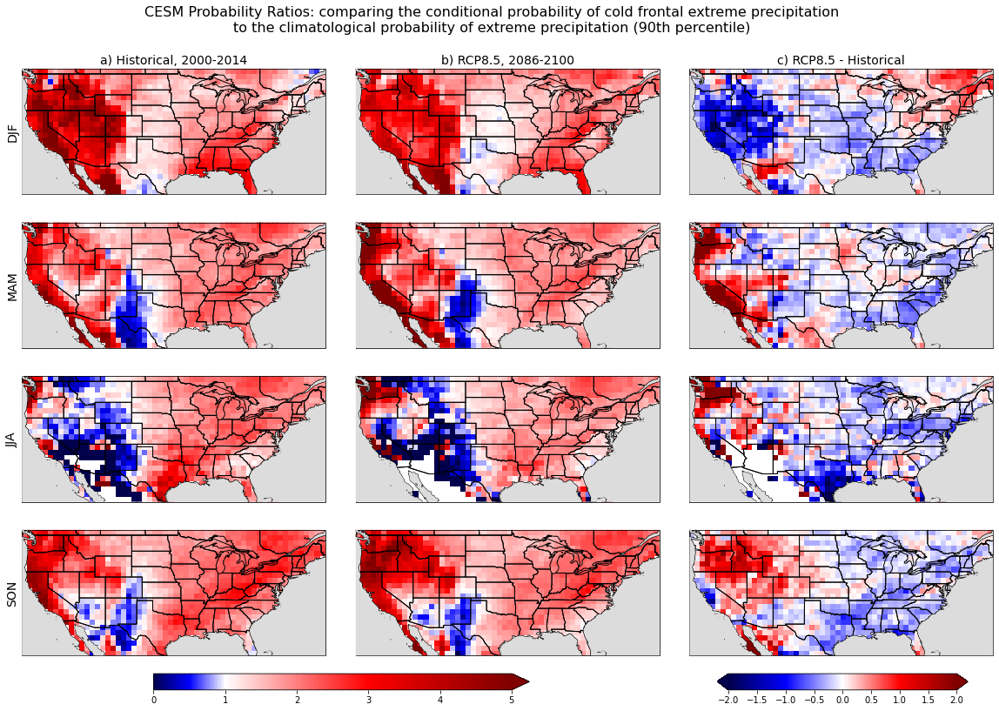

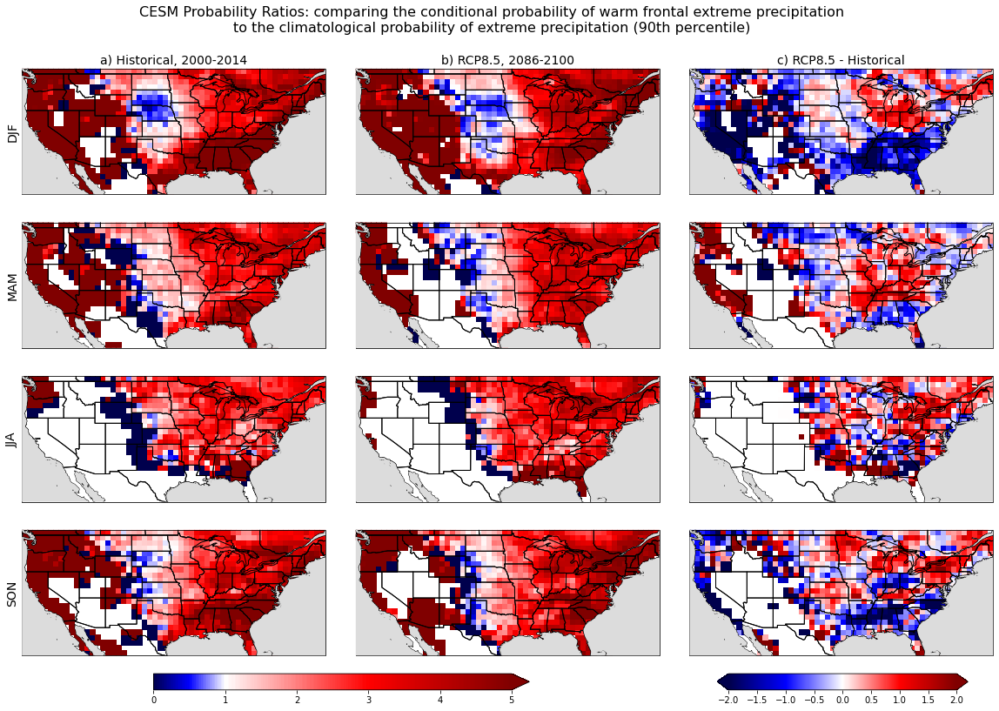

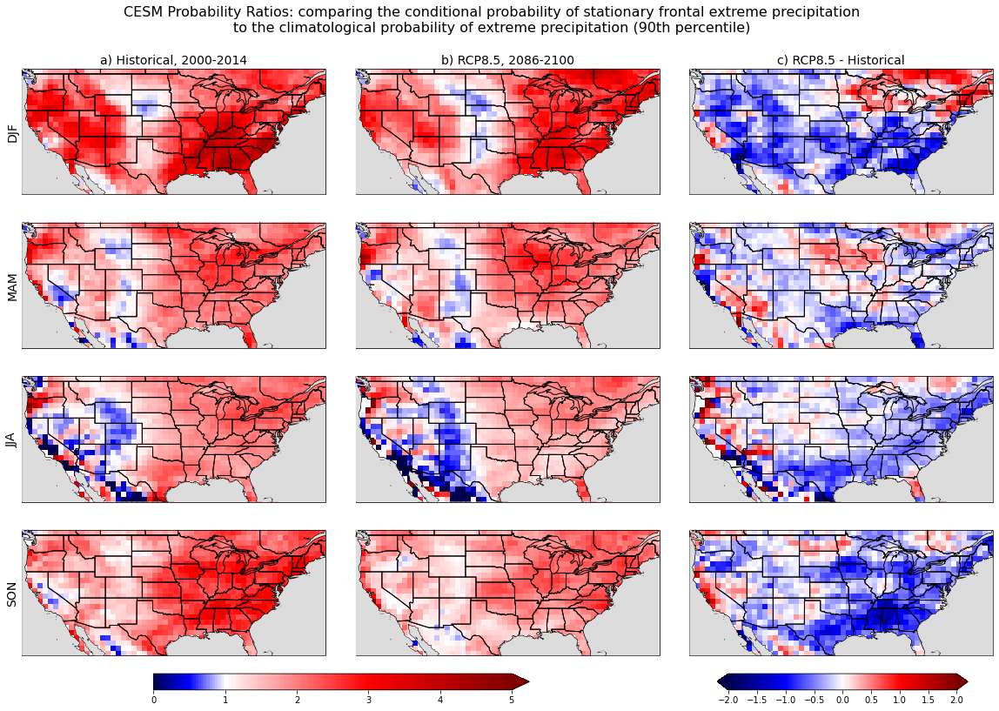

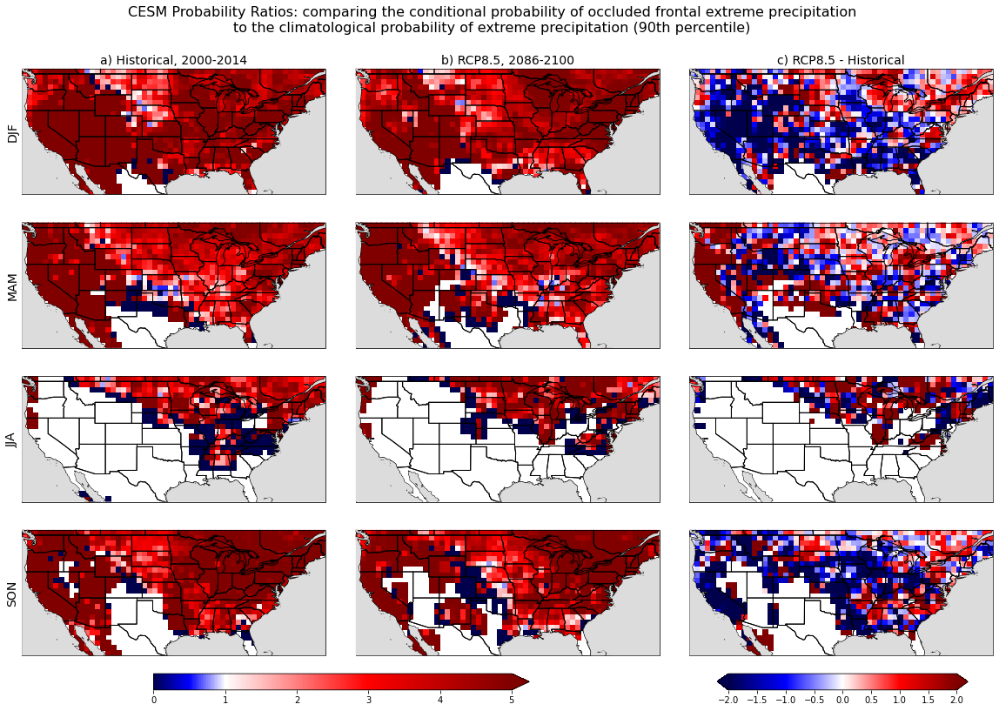

In [140]:
# loop over front type
frstrings = ('Cold', 'Warm', 'Stationary', 'Occluded') # for labels
ftypes = ('cold', 'warm', 'stationary', 'occluded') # lowercase for indexing
nfr = len(frstrings)

#vmaxes = [40,20,40,10]
#ncols = [16,16,16,10]
#vdiffs = [15,10,15,10]

# then season
seastrings = ('DJF', 'MAM', 'JJA', 'SON')
nsea = len(seastrings)

for f in range(nfr):
    fig, axs = plt.subplots(4, 3, figsize=(20,13), subplot_kw={'projection': ccrs.PlateCarree()})

    # continuous colormap centered on 1
    cmap = plt.cm.get_cmap('seismic')
    vmin=0
    vmax=5

    # different mapping on either side of center
    norm = mpl.colors.TwoSlopeNorm(vmin=vmin, vmax=vmax, vcenter=1)

    for i, season in enumerate(('DJF', 'MAM', 'JJA', 'SON')):
        if i == 0:
            axs[i,0].set_title('a) Historical, 2000-2014', fontsize=14) 
        field, lon = add_cyclic_point(PR_season_type_CONUS.sel(season=season, front_type=ftypes[f]), coord=PR_season_type_CONUS.lon)
        lat = PR_season_type_CONUS.lat
        cf = axs[i,0].pcolor(lon, lat, field, cmap=cmap, vmin=vmin, vmax=vmax, norm=norm, transform=ccrs.PlateCarree())
        axs[i,0].coastlines(zorder=1)
        axs[i,0].add_feature(cfeature.BORDERS, zorder=2)
        axs[i,0].add_feature(cfeature.STATES, zorder=3)
        # add greyed out ocean
        axs[i,0].add_feature(cfeature.OCEAN, zorder=4, facecolor='gainsboro', edgecolor='none')
        axs[i,0].set_ylabel(season, fontsize=14)
        axs[i,0].set_yticks([])

    for i, season in enumerate(('DJF', 'MAM', 'JJA', 'SON')):
        if i == 0:
            axs[i,1].set_title('b) RCP8.5, 2086-2100', fontsize=14)
        field, lon = add_cyclic_point(PR_season_type_CONUS_rcp.sel(season=season, front_type=ftypes[f]), coord=PR_season_type_CONUS_rcp.lon)
        lat = PR_season_type_CONUS_rcp.lat
        cf = axs[i,1].pcolor(lon, lat, field, cmap=cmap, vmin=vmin, vmax=vmax, norm=norm, transform=ccrs.PlateCarree())
        axs[i,1].coastlines(zorder=1)
        axs[i,1].add_feature(cfeature.BORDERS, zorder=2)
        axs[i,1].add_feature(cfeature.STATES, zorder=3)
        axs[i,1].add_feature(cfeature.OCEAN, zorder=4, facecolor='gainsboro', edgecolor='none')
    
    # add colorbar for absolute plots
    cb1_ax = fig.add_axes([0.23, 0.1, 0.3, 0.02])
    cb1 = mpl.colorbar.ColorbarBase(cb1_ax, cmap=cmap, norm=norm, orientation='horizontal', extend='max')

    # colormap for diff plots
    cmap2 = plt.cm.get_cmap('seismic')
    # absolute changes
    vmin2=-2
    vmax2=2

    for i, season in enumerate(('DJF', 'MAM', 'JJA', 'SON')):
        if i == 0:
            axs[i,2].set_title('c) RCP8.5 - Historical', fontsize=14)
        field, lon = add_cyclic_point(PR_season_type_CONUS_diff.sel(season=season, front_type=ftypes[f]), coord=PR_season_type_CONUS_diff.lon) # absolute
        lat = PR_season_type_CONUS_diff.lat
        cf = axs[i,2].pcolor(lon, lat, field, cmap=cmap2, vmin=vmin2, vmax=vmax2, transform=ccrs.PlateCarree())
        axs[i,2].coastlines(zorder=1)
        axs[i,2].add_feature(cfeature.BORDERS, zorder=2)
        axs[i,2].add_feature(cfeature.STATES, zorder=3)
        axs[i,2].add_feature(cfeature.OCEAN, zorder=4, facecolor='gainsboro', edgecolor='none')

    # colorbar for diff plots
    cb2_ax = fig.add_axes([0.68, 0.1, 0.2, 0.02])
    norm2 = mpl.colors.Normalize(vmin=vmin2, vmax=vmax2)
    cb2 = mpl.colorbar.ColorbarBase(cb2_ax, cmap=cmap2, norm=norm2, orientation='horizontal', extend='both')

    # add title
    fig.suptitle('CESM Probability Ratios: comparing the conditional probability of '+ftypes[f]+' frontal extreme precipitation\nto the climatological probability of extreme precipitation (90th percentile)', fontsize=16, y=0.94)

    plt.subplots_adjust(wspace=0.1, hspace=0)

    plt.savefig('../figures/toSCP/PR90_season_hist_rcp_diff_CONUS_'+ftypes[f]+'_fronts.png', bbox_inches='tight', dpi=300)

## Changes in PEx plots

In [ ]:
# subset CONUS
PExgridpoints_CONUS = PExgridpoints.sel(lat=slice(26,50), lon=slice(-125,-68)).persist()
PExgridpoints_CONUS_rcp = PExgridpoints_rcp.sel(lat=slice(26,50), lon=slice(-125,-68)).persist()

In [ ]:
# this is constant over space
PExgridpoints_CONUS.sel(season='DJF').plot()

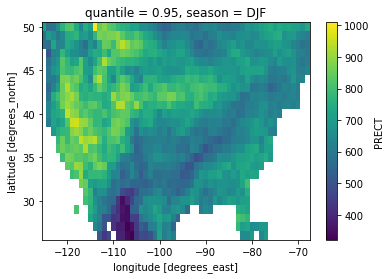

In [165]:
# this is not, because the percentile is based on the historical simulation
PExgridpoints_CONUS_rcp.sel(season='DJF').plot()

In [22]:
# calculating the % changes in PEx (w/o fronts)
PExgridpoints_CONUS_perdiff = 100*(PExgridpoints_CONUS_rcp - PExgridpoints_CONUS)/PExgridpoints_CONUS

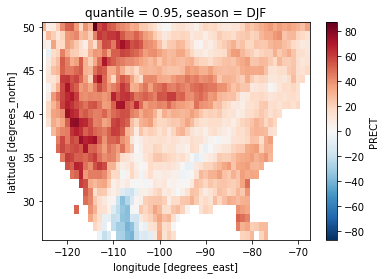

In [168]:
PExgridpoints_CONUS_perdiff.sel(season='DJF').plot()

In [23]:
PExgridpoints_CONUS_perdiff.max().values

array(206.36363636)

In [24]:
PExgridpoints_CONUS_perdiff.min().values

array(-72.07207207)

In [191]:
# sanity check there are nans where there should be
PExgridpoints_CONUS_perdiff.sel(lon=-70, lat=26, method='nearest').sel(season='DJF').values

array(nan)

In [ ]:
# absolute changes (units = number of gridpoints, not that helpful to visualize)
PExgridpoints_time_CONUS_byseason_diff = PExgridpoints_time_CONUS_byseason_rcp - PExgridpoints_time_CONUS_byseason
PExgridpoints_time_CONUS_byseason_diff = PExgridpoints_time_CONUS_byseason_diff.persist()

/glade/work/kdagon/miniconda/envs/PEx/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1887: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  result = matplotlib.axes.Axes.pcolor(self, *args, **kwargs)


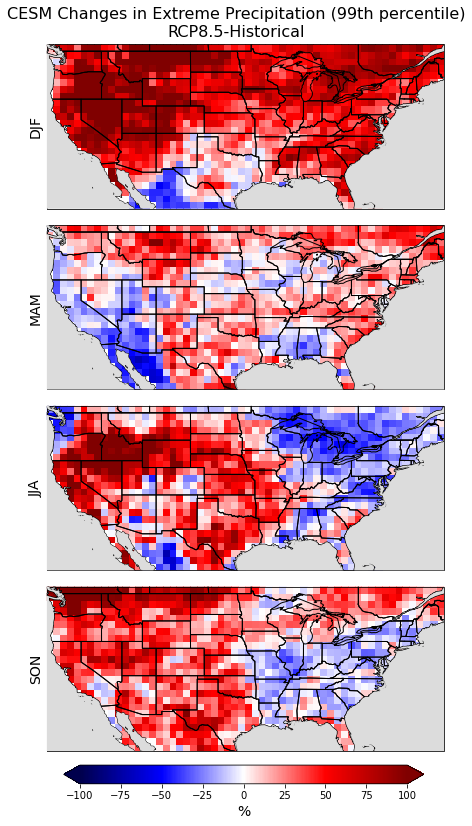

In [25]:
fig, axs = plt.subplots(4, 1, figsize=(10,13), subplot_kw={'projection': ccrs.PlateCarree()})

# seasons
sea_strs = ('DJF', 'MAM', 'JJA', 'SON')

# colormap for diff plots
cmap = plt.cm.get_cmap('seismic')
# 90th, 95th percentiles
vmin=-100
vmax=100

for i, season in enumerate(sea_strs):
    #if i == 0:
        #axs[i].set_title('Change in Extreme Precipitation (90th percentile), RCP8.5-Historical', fontsize=14)
    field, lon = add_cyclic_point(PExgridpoints_CONUS_perdiff.sel(season=season), coord=PExgridpoints_CONUS_perdiff.lon)
    lat = PExgridpoints_CONUS_perdiff.lat
    cf = axs[i].pcolor(lon, lat, field, cmap=cmap, vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree())
    axs[i].coastlines(zorder=1)
    axs[i].add_feature(cfeature.BORDERS, zorder=2)
    axs[i].add_feature(cfeature.STATES, zorder=3)
    axs[i].add_feature(cfeature.OCEAN, zorder=4, facecolor='gainsboro', edgecolor='none')
    axs[i].set_ylabel(season, fontsize=14)
    axs[i].set_yticks([])
    
cb_ax = fig.add_axes([0.26, 0.09, 0.5, 0.02])
norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
cb = mpl.colorbar.ColorbarBase(cb_ax, cmap=cmap, norm=norm, orientation='horizontal', extend='both')
cb.ax.set_xlabel('%', fontsize=14)  
    
# add title
#fig.suptitle('CESM Changes in Extreme Precipitation (90th percentile)\nRCP8.5-Historical', fontsize=16, y=0.92)
#fig.suptitle('CESM Changes in Extreme Precipitation (95th percentile)\nRCP8.5-Historical', fontsize=16, y=0.92)
fig.suptitle('CESM Changes in Extreme Precipitation (99th percentile)\nRCP8.5-Historical', fontsize=16, y=0.92)

plt.subplots_adjust(wspace=0, hspace=0.1)

#plt.savefig('../figures/toSCP/PEx90gridpoints_CONUS_perdiff.png', bbox_inches='tight', dpi=300)
#plt.savefig('../figures/toSCP/PEx95gridpoints_CONUS_perdiff.png', bbox_inches='tight', dpi=300)
#plt.savefig('../figures/toSCP/PEx99gridpoints_CONUS_perdiff.png', bbox_inches='tight', dpi=300)

### Changes based on amount of extreme precip

In [17]:
# subset CONUS
PEx_sum_CONUS = PEx_sum.sel(lat=slice(26,50), lon=slice(-125,-68)).persist()
PEx_sum_CONUS_rcp = PEx_sum_rcp.sel(lat=slice(26,50), lon=slice(-125,-68)).persist()

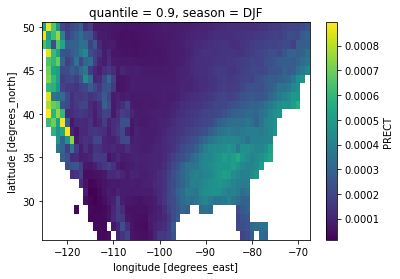

In [61]:
PEx_sum_CONUS.sel(season='DJF').plot()

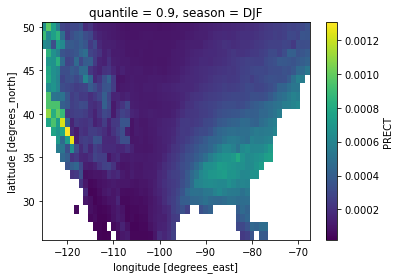

In [62]:
PEx_sum_CONUS_rcp.sel(season='DJF').plot()

In [18]:
# calculating the % changes in PEx amount (w/o fronts)
PEx_sum_CONUS_perdiff = 100*(PEx_sum_CONUS_rcp - PEx_sum_CONUS)/PEx_sum_CONUS

In [19]:
print(PEx_sum_CONUS_perdiff.max().values, PEx_sum_CONUS_perdiff.min().values)

223.9842572904985 -61.899664042625126


/glade/work/kdagon/miniconda/envs/PEx/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1887: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  result = matplotlib.axes.Axes.pcolor(self, *args, **kwargs)


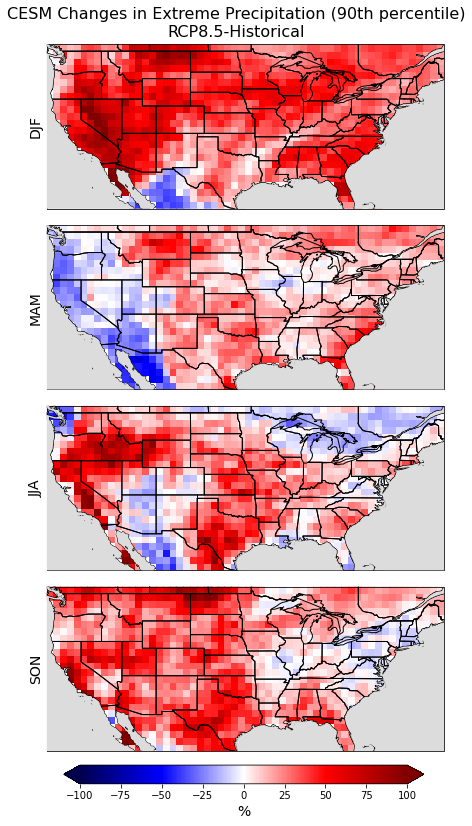

In [68]:
fig, axs = plt.subplots(4, 1, figsize=(10,13), subplot_kw={'projection': ccrs.PlateCarree()})

# seasons
sea_strs = ('DJF', 'MAM', 'JJA', 'SON')

# colormap for diff plots
cmap = plt.cm.get_cmap('seismic')
vmin=-100
vmax=100

for i, season in enumerate(sea_strs):
    field, lon = add_cyclic_point(PEx_sum_CONUS_perdiff.sel(season=season), coord=PEx_sum_CONUS_perdiff.lon)
    lat = PEx_sum_CONUS_perdiff.lat
    cf = axs[i].pcolor(lon, lat, field, cmap=cmap, vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree())
    axs[i].coastlines(zorder=1)
    axs[i].add_feature(cfeature.BORDERS, zorder=2)
    axs[i].add_feature(cfeature.STATES, zorder=3)
    axs[i].add_feature(cfeature.OCEAN, zorder=4, facecolor='gainsboro', edgecolor='none')
    axs[i].set_ylabel(season, fontsize=14)
    axs[i].set_yticks([])
    
cb_ax = fig.add_axes([0.26, 0.09, 0.5, 0.02])
norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
cb = mpl.colorbar.ColorbarBase(cb_ax, cmap=cmap, norm=norm, orientation='horizontal', extend='both')
cb.ax.set_xlabel('%', fontsize=14)  
    
# add title
fig.suptitle('CESM Changes in Extreme Precipitation (90th percentile)\nRCP8.5-Historical', fontsize=16, y=0.92)
plt.subplots_adjust(wspace=0, hspace=0.1)

#plt.savefig('../figures/toSCP/PEx90_CONUS_perdiff.png', bbox_inches='tight', dpi=300)

### Plot mean and extreme precip changes side by side

In [20]:
def process_PRECT(path, file):
    PRECT_1deg = xr.open_dataarray(path+file, chunks={'time':600, 'lat':10, 'lon':20})
    
    # subset for a 15-year climatology (if applicable)
    if PRECT_1deg.shape[0] > 43800:
        PRECT_1deg = PRECT_1deg[:43800]

    return(PRECT_1deg)

In [21]:
PRECT = process_PRECT(postprocessing_filepath, PRECT_file)
PRECT_rcp = process_PRECT(postprocessing_filepath, PRECT_file_rcp)

In [22]:
Punits = 60*60*24*1000 # convert m/s to mm/day

In [23]:
# mean change in precip by season, mm/day
# by simple averaging over all 3hrly time points
mean_PRECT_CONUS_byseason = ((PRECT_rcp.groupby('time.season').mean(dim='time') - PRECT.groupby('time.season').mean(dim='time'))*Punits).sel(lat=slice(26,50), lon=slice(-125,-68)).persist()

In [24]:
print(mean_PRECT_CONUS_byseason.max().values, mean_PRECT_CONUS_byseason.min().values)

4.306107448834873 -1.9278725036314566


In [87]:
# % change in precip by summing
PRECT_sum_CONUS_perdiff = (100*(PRECT_rcp.groupby('time.season').sum(dim='time') - PRECT.groupby('time.season').sum(dim='time'))/PRECT.groupby('time.season').sum(dim='time')).sel(lat=slice(26,50), lon=slice(-125,-68)).persist()

In [88]:
print(PRECT_sum_CONUS_perdiff.max().values, PRECT_sum_CONUS_perdiff.min().values)

1050.2660530954365 -60.94958095266344


In [85]:
# % change in PEx by summing
print(PEx_sum_CONUS_perdiff.max().values, PEx_sum_CONUS_perdiff.min().values)

223.9842572904985 -61.899664042625126


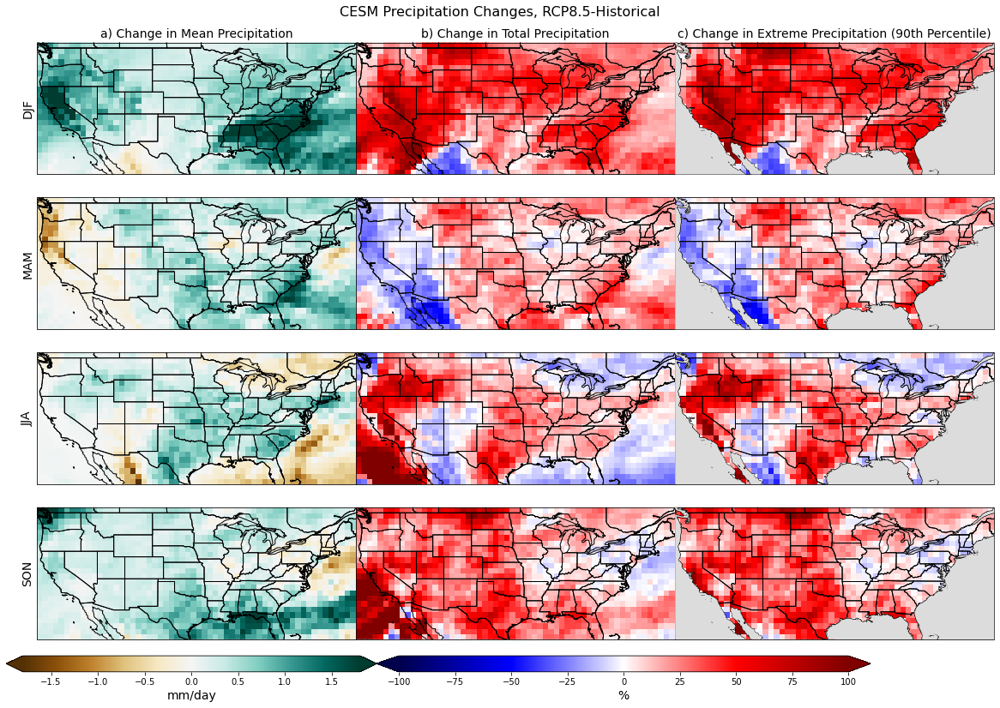

In [91]:
# comparing PRECT seasonal changes computed without fronts
seastrings = ('DJF', 'MAM', 'JJA', 'SON')
nsea = len(seastrings)
fig, axs = plt.subplots(nsea, 3, figsize=(20,13), subplot_kw={'projection': ccrs.PlateCarree()})

cmap1 = plt.cm.get_cmap('BrBG')
vmin1=-1.8
vmax1=1.8

for i, season in enumerate(seastrings):
    if i==0:
        axs[i,0].set_title('a) Change in Mean Precipitation', fontsize=14)
    field, lon = add_cyclic_point(mean_PRECT_CONUS_byseason.sel(season=season), coord=mean_PRECT_CONUS_byseason.lon)
    lat = mean_PRECT_CONUS_byseason.lat
    cf = axs[i,0].pcolor(lon, lat, field, cmap=cmap1, vmin=vmin1, vmax=vmax1, transform=ccrs.PlateCarree())
    axs[i,0].coastlines(zorder=1)
    axs[i,0].add_feature(cfeature.BORDERS, zorder=2)
    axs[i,0].add_feature(cfeature.STATES, zorder=3)
    axs[i,0].set_ylabel(season, fontsize=14)
    axs[i,0].set_yticks([])
    
cb1_ax = fig.add_axes([0.1, 0.09, 0.3, 0.02])
norm1 = mpl.colors.Normalize(vmin=vmin1, vmax=vmax1)
cb1 = mpl.colorbar.ColorbarBase(cb1_ax, cmap=cmap1, norm=norm1, orientation='horizontal', extend='both')
cb1.ax.set_xlabel('mm/day', fontsize=14)  

# colormap for diff plots
cmap2 = plt.cm.get_cmap('seismic')
vmin2=-100
vmax2=100

for i, season in enumerate(seastrings):
    if i == 0:
        axs[i,1].set_title('b) Change in Total Precipitation', fontsize=14)
    field, lon = add_cyclic_point(PRECT_sum_CONUS_perdiff.sel(season=season), coord=PRECT_sum_CONUS_perdiff.lon)
    lat = PRECT_sum_CONUS_perdiff.lat
    cf = axs[i,1].pcolor(lon, lat, field, cmap=cmap2, vmin=vmin2, vmax=vmax2, transform=ccrs.PlateCarree())
    axs[i,1].coastlines(zorder=1)
    axs[i,1].add_feature(cfeature.BORDERS, zorder=2)
    axs[i,1].add_feature(cfeature.STATES, zorder=3)
    
for i, season in enumerate(seastrings):
    if i == 0:
        axs[i,2].set_title('c) Change in Extreme Precipitation (90th Percentile)', fontsize=14)
    field, lon = add_cyclic_point(PEx_sum_CONUS_perdiff.sel(season=season), coord=PEx_sum_CONUS_perdiff.lon)
    lat = PEx_sum_CONUS_perdiff.lat
    cf = axs[i,2].pcolor(lon, lat, field, cmap=cmap2, vmin=vmin2, vmax=vmax2, transform=ccrs.PlateCarree())
    axs[i,2].coastlines(zorder=1)
    axs[i,2].add_feature(cfeature.BORDERS, zorder=2)
    axs[i,2].add_feature(cfeature.STATES, zorder=3)
    axs[i,2].add_feature(cfeature.OCEAN, zorder=4, facecolor='gainsboro', edgecolor='none')

# colorbar for diff plots
cb2_ax = fig.add_axes([0.4, 0.09, 0.4, 0.02])
norm2 = mpl.colors.Normalize(vmin=vmin2, vmax=vmax2)
cb2 = mpl.colorbar.ColorbarBase(cb2_ax, cmap=cmap2, norm=norm2, orientation='horizontal', extend='both')
cb2.ax.set_xlabel('%', fontsize=14)    
    
# add title
fig.suptitle('CESM Precipitation Changes, RCP8.5-Historical', fontsize=16, y=0.92)
plt.subplots_adjust(wspace=0, hspace=0.1)

#plt.savefig('../figures/toSCP/PRECT_frontint_hist_rcp_diff_CONUS.png', bbox_inches='tight', dpi=300)

### Read in quantiles for significance hatching

In [25]:
PRECT_quantiles = xr.open_dataarray(postprocessing_filepath+'PRECT_boot_diffs_byseason.nc')
PRECT_quantiles

<xarray.DataArray 'PRECT' (season: 4, quantile: 2, lat: 25, lon: 58)>
array([[[[-0.110627, ..., -0.290332],
         ...,
         [-0.398811, ..., -0.2253  ]],

        [[ 0.109886, ...,  0.307044],
         ...,
         [ 0.417413, ...,  0.228397]]],


       ...,


       [[[-0.091332, ..., -0.277072],
         ...,
         [-0.466051, ..., -0.334515]],

        [[ 0.092253, ...,  0.291776],
         ...,
         [ 0.494328, ...,  0.320209]]]])
Coordinates:
  * lon       (lon) float64 -125.0 -124.0 -123.0 -122.0 ... -70.0 -69.0 -68.0
  * lat       (lat) float64 26.0 27.0 28.0 29.0 30.0 ... 47.0 48.0 49.0 50.0
  * quantile  (quantile) float64 0.025 0.975
  * season    (season) object 'DJF' 'MAM' 'JJA' 'SON'

In [42]:
PEx_quantiles = xr.open_dataarray(postprocessing_filepath+'PEx90_boot_diffs_byseason.nc')
PEx_quantiles

<xarray.DataArray 'PRECT' (season: 4, quantile: 2, lat: 25, lon: 58)>
array([[[[      nan, ...,       nan],
         ...,
         [-8.643281, ..., -9.738892]],

        [[      nan, ...,       nan],
         ...,
         [ 9.575816, ..., 11.16582 ]]],


       ...,


       [[[      nan, ...,       nan],
         ...,
         [-4.429217, ..., -7.714606]],

        [[      nan, ...,       nan],
         ...,
         [ 4.377035, ...,  7.94927 ]]]])
Coordinates:
  * lon       (lon) float64 -125.0 -124.0 -123.0 -122.0 ... -70.0 -69.0 -68.0
  * lat       (lat) float64 26.0 27.0 28.0 29.0 30.0 ... 47.0 48.0 49.0 50.0
  * quantile  (quantile) float64 0.025 0.975
  * season    (season) object 'DJF' 'MAM' 'JJA' 'SON'

In [35]:
# try masking small diffs so small changes don't look overly significant
# how to determine this threshold? some percentage?
mean_PRECT_CONUS_byseason_mask = mean_PRECT_CONUS_byseason.where(abs(mean_PRECT_CONUS_byseason)>0.001)

/glade/work/kdagon/miniconda/envs/PEx/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1887: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  result = matplotlib.axes.Axes.pcolor(self, *args, **kwargs)
/glade/work/kdagon/miniconda/envs/PEx/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1887: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  result = matplotlib.axes.Axes.pcolor(self, *args, **kwargs)
/glade/work/kdagon/miniconda/envs/PEx/lib/python3.9/site-pac

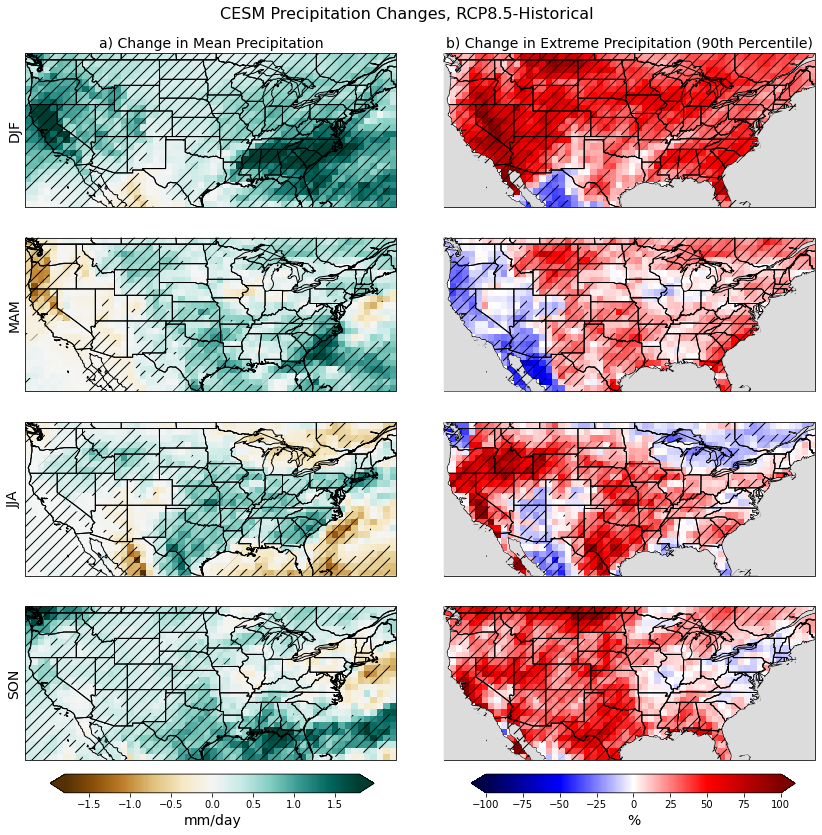

In [44]:
# 2 panels only: mean absolute and extreme percent changes
seastrings = ('DJF', 'MAM', 'JJA', 'SON')
nsea = len(seastrings)
fig, axs = plt.subplots(nsea, 2, figsize=(15,13), subplot_kw={'projection': ccrs.PlateCarree()})

cmap1 = plt.cm.get_cmap('BrBG')
vmin1=-1.8
vmax1=1.8

for i, season in enumerate(seastrings):
    if i==0:
        axs[i,0].set_title('a) Change in Mean Precipitation', fontsize=14)
    # significance hatching - need to do this first or plots get cut off
    lon = mean_PRECT_CONUS_byseason.lon # need to use original lon (add_cyclic_point adds to the lon dimension)
    lat = mean_PRECT_CONUS_byseason.lat
    axs[i,0].contourf(lon, lat, xr.where((
        mean_PRECT_CONUS_byseason.sel(season=season) <= PRECT_quantiles.sel(season=season, quantile=0.025)) | (
        mean_PRECT_CONUS_byseason.sel(season=season) >= PRECT_quantiles.sel(season=season, quantile=0.975)),
        1.0, np.nan).data, 
        transform=ccrs.PlateCarree(),
        colors='none', levels=[1.0, 1.5],
        hatches=['//'], #another hatch option, note number of lines changes density of hatching
        #hatches=['XXX'],
        zorder=10)
    field, lon = add_cyclic_point(mean_PRECT_CONUS_byseason.sel(season=season), coord=mean_PRECT_CONUS_byseason.lon)
    lat = mean_PRECT_CONUS_byseason.lat
    cf = axs[i,0].pcolor(lon, lat, field, cmap=cmap1, vmin=vmin1, vmax=vmax1, transform=ccrs.PlateCarree())
    axs[i,0].coastlines(zorder=1)
    axs[i,0].add_feature(cfeature.BORDERS, zorder=2)
    axs[i,0].add_feature(cfeature.STATES, zorder=3)
    axs[i,0].set_ylabel(season, fontsize=14)
    axs[i,0].set_yticks([])
    
cb1_ax = fig.add_axes([0.17, 0.09, 0.3, 0.02])
norm1 = mpl.colors.Normalize(vmin=vmin1, vmax=vmax1)
cb1 = mpl.colorbar.ColorbarBase(cb1_ax, cmap=cmap1, norm=norm1, orientation='horizontal', extend='both')
cb1.ax.set_xlabel('mm/day', fontsize=14)  

# colormap for diff plots
cmap2 = plt.cm.get_cmap('seismic')
vmin2=-100
vmax2=100

for i, season in enumerate(seastrings):
    if i == 0:
        axs[i,1].set_title('b) Change in Extreme Precipitation (90th Percentile)', fontsize=14)
    # significance hatching - need to do this first or plots get cut off
    lon = PEx_sum_CONUS_perdiff.lon # need to use original lon (add_cyclic_point adds to the lon dimension)
    lat = PEx_sum_CONUS_perdiff.lat
    axs[i,1].contourf(lon, lat, xr.where((
        PEx_sum_CONUS_perdiff.sel(season=season) <= PEx_quantiles.sel(season=season, quantile=0.025)) | (
        PEx_sum_CONUS_perdiff.sel(season=season) >= PEx_quantiles.sel(season=season, quantile=0.975)),
        1.0, np.nan).data, 
        transform=ccrs.PlateCarree(),
        colors='none', levels=[1.0, 1.5],
        hatches=['//'],
        #hatches=['XXX'],
        zorder=10)
    field, lon = add_cyclic_point(PEx_sum_CONUS_perdiff.sel(season=season), coord=PEx_sum_CONUS_perdiff.lon)
    lat = PEx_sum_CONUS_perdiff.lat
    cf = axs[i,1].pcolor(lon, lat, field, cmap=cmap2, vmin=vmin2, vmax=vmax2, transform=ccrs.PlateCarree())
    axs[i,1].coastlines(zorder=1)
    axs[i,1].add_feature(cfeature.BORDERS, zorder=2)
    axs[i,1].add_feature(cfeature.STATES, zorder=3)
    axs[i,1].add_feature(cfeature.OCEAN, zorder=4, facecolor='gainsboro', edgecolor='none')

# colorbar for diff plots
cb2_ax = fig.add_axes([0.56, 0.09, 0.3, 0.02])
norm2 = mpl.colors.Normalize(vmin=vmin2, vmax=vmax2)
cb2 = mpl.colorbar.ColorbarBase(cb2_ax, cmap=cmap2, norm=norm2, orientation='horizontal', extend='both')
cb2.ax.set_xlabel('%', fontsize=14)
    
# add title
fig.suptitle('CESM Precipitation Changes, RCP8.5-Historical', fontsize=16, y=0.93)
plt.subplots_adjust(wspace=0, hspace=0.2)

#plt.savefig('../figures/toSCP/CESM_PRECT_PEx90_diff_CONUS.png', bbox_inches='tight', dpi=300)
#plt.savefig('../figures/toSCP/CESM_PRECT_PEx90_diff_CONUS_sig.png', bbox_inches='tight', dpi=300)

In [66]:
# absolute changes, convert m/s to mm/day (is this the correct unit conversion given the sum?)
PEx_sum_CONUS_diff = 1000*60*60*24*(PEx_sum_CONUS_rcp - PEx_sum_CONUS)
print(PEx_sum_CONUS_diff.max().values, PEx_sum_CONUS_diff.min().values)

44906.93839726847 -19185.129533937587


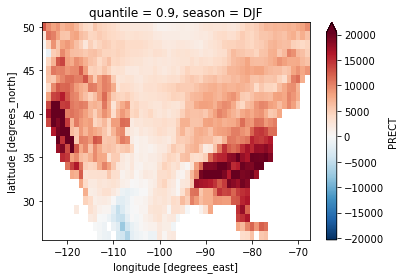

In [69]:
# these are large numbers...sum of mm/day over 15 years
PEx_sum_CONUS_diff.sel(season='DJF').plot(robust=True)

In [77]:
# mean changes (mm/day), but note PRECT has not been filtered here
PEx_mean_CONUS_diff = 1000*60*60*24*(PEx_season_rcp.sel(lat=slice(26,50), lon=slice(-125,-68)).groupby("time.season").mean(dim='time') - PEx_season.sel(lat=slice(26,50), lon=slice(-125,-68)).groupby("time.season").mean(dim='time'))

In [78]:
print(PEx_mean_CONUS_diff.max().values, PEx_mean_CONUS_diff.min().values)

13.309508137323743 -10.187540524431009


/glade/work/kdagon/miniconda/envs/PEx/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1887: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  result = matplotlib.axes.Axes.pcolor(self, *args, **kwargs)


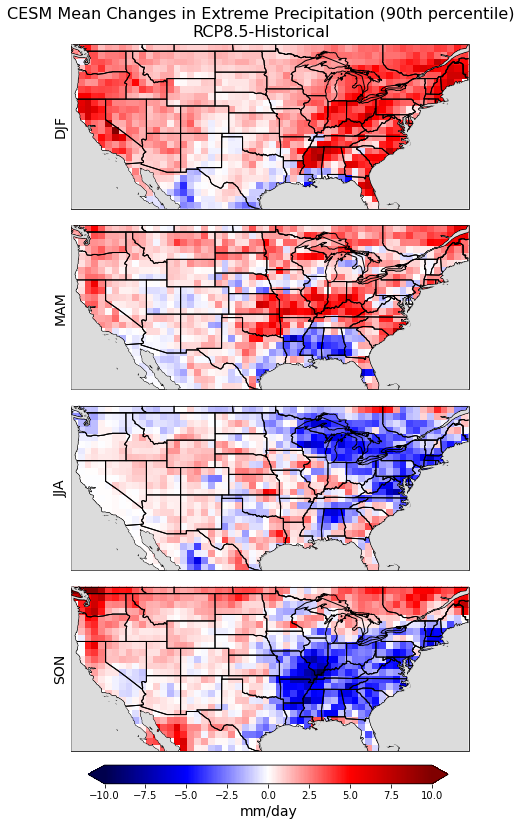

In [79]:
fig, axs = plt.subplots(4, 1, figsize=(10,13), subplot_kw={'projection': ccrs.PlateCarree()})

# seasons
sea_strs = ('DJF', 'MAM', 'JJA', 'SON')

# colormap for diff plots
cmap = plt.cm.get_cmap('seismic')
vmin=-10
vmax=10

for i, season in enumerate(sea_strs):
    field, lon = add_cyclic_point(PEx_mean_CONUS_diff.sel(season=season), coord=PEx_mean_CONUS_diff.lon)
    lat = PEx_mean_CONUS_diff.lat
    cf = axs[i].pcolor(lon, lat, field, cmap=cmap, vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree())
    axs[i].coastlines(zorder=1)
    axs[i].add_feature(cfeature.BORDERS, zorder=2)
    axs[i].add_feature(cfeature.STATES, zorder=3)
    axs[i].add_feature(cfeature.OCEAN, zorder=4, facecolor='gainsboro', edgecolor='none')
    axs[i].set_ylabel(season, fontsize=14)
    axs[i].set_yticks([])
    
cb_ax = fig.add_axes([0.26, 0.09, 0.5, 0.02])
norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
cb = mpl.colorbar.ColorbarBase(cb_ax, cmap=cmap, norm=norm, orientation='horizontal', extend='both')
cb.ax.set_xlabel('mm/day', fontsize=14)  
    
# add title
fig.suptitle('CESM Mean Changes in Extreme Precipitation (90th percentile)\nRCP8.5-Historical', fontsize=16, y=0.92)

plt.subplots_adjust(wspace=0, hspace=0.1)

#plt.savefig('../figures/toSCP/PEx90_mean_CONUS_diff.png', bbox_inches='tight', dpi=300)

### Calculating the changes in fronts (usually done in a different notebook)

In [47]:
# function for calculating seasonal climatological rates over CONUS (spatial field, spatial mean, spatial stdev)
def srates_clim_CONUS(path, file, grid):

    # read in files
    rates_fronts = xr.open_dataset(path+file)
    
    # process seasonal rate climatology and standard deviation
    srates_clim = rates_fronts.seasonal_rate_climatology
    srates_clim_stdev = rates_fronts.seasonal_rate_climatology_stdev
    
    # check gridtype
    # approx. lat/lon here to get a CONUS rectangular region - may not exactly match Jim's analysis
    if grid=="CESM":
        srates_clim_CONUS = srates_clim.sel(lat=slice(26,50), lon=slice(235,292)) # CESM grid lons
        srates_clim_stdev_CONUS = srates_clim_stdev.sel(lat=slice(26,50), lon=slice(235,292))
    elif grid=="MERRA":
        srates_clim_CONUS = srates_clim.sel(lat=slice(26,50), lon=slice(-125, -68)) # MERRA2 grid lons for rates calculated via polylines
        srates_clim_stdev_CONUS = srates_clim_stdev.sel(lat=slice(26,50), lon=slice(-125, -68))
    
    # average over CONUS
    weights = np.cos(np.deg2rad(srates_clim_CONUS.lat))
    weights.name = "weights"
    srates_clim_CONUS_weighted = srates_clim_CONUS.weighted(weights)
    srates_clim_CONUS_weighted_mean = srates_clim_CONUS_weighted.mean(("lon","lat"))
    srates_clim_stdev_CONUS_weighted = srates_clim_stdev_CONUS.weighted(weights)
    srates_clim_stdev_CONUS_weighted_mean = srates_clim_stdev_CONUS_weighted.mean(("lon","lat"))
    
    return(srates_clim_CONUS, srates_clim_stdev_CONUS, srates_clim_CONUS_weighted_mean, srates_clim_stdev_CONUS_weighted_mean)

In [48]:
# cesm rates with a modified 15-year climatology to match RCP #years (2000-2014)
cesm_filepath = "/glade/work/kdagon/FrontDetector/CESMOutputs/"
cesm_fullmod_rates_file = "cesm_fronts_2000-2014_frontRates_viaPolylines_customgrid.nc"
cesm_fullmod_srates_clim_CONUS, cesm_fullmod_srates_clim_stdev_CONUS, cesm_fullmod_srates_clim_CONUS_mean, cesm_fullmod_srates_clim_stdev_CONUS_mean = srates_clim_CONUS(cesm_filepath, cesm_fullmod_rates_file, "MERRA")

# cesm rcp8.5 results
cesm_rcp85_rates_file = "cesm_fronts_2086-2100_frontRates_viaPolylines_customgrid.nc" # generated via poylines
cesm_rcp85_srates_clim_CONUS, cesm_rcp85_srates_clim_stdev_CONUS, cesm_rcp85_srates_clim_CONUS_mean, cesm_rcp85_srates_clim_stdev_CONUS_mean = srates_clim_CONUS(cesm_filepath, cesm_rcp85_rates_file, "MERRA")

cesm_srates_clim_CONUS_diff = cesm_rcp85_srates_clim_CONUS - cesm_fullmod_srates_clim_CONUS

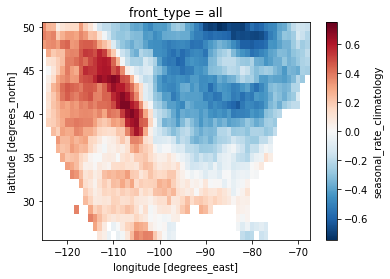

In [49]:
# mask the front rate diffs to match
cesm_srates_clim_CONUS_diff_land = cesm_srates_clim_CONUS_diff.where(landfrac > 0)
(cesm_srates_clim_CONUS_diff_land*7)[0,4,:,:].plot()

In [53]:
# sanity check there are nans where there should be
cesm_srates_clim_CONUS_diff_land.sel(lon=-70, lat=26, method='nearest')

<xarray.DataArray 'seasonal_rate_climatology' (seasons4: 4, front: 5)>
array([[nan, nan, nan, nan, nan],
       [nan, nan, nan, nan, nan],
       [nan, nan, nan, nan, nan],
       [nan, nan, nan, nan, nan]], dtype=float32)
Coordinates:
    lat         float64 26.0
    lon         float64 -70.0
    front_type  (front) object 'cold' 'warm' 'stationary' 'occluded' 'all'
Dimensions without coordinates: seasons4, front

### Plot side by side changes in npercentPEx, fronts, and PEx

In [45]:
# first panel: change in PEx and Front as above

# second panel: spatial pattern correlation of front frequency with first panel (as a map)

# third panel: spatial pattern correlation of change in PEx with first panel (as a map)

# Also, could look at high-res (0.25deg) version of panel c) to investigate changes in PEx in the model

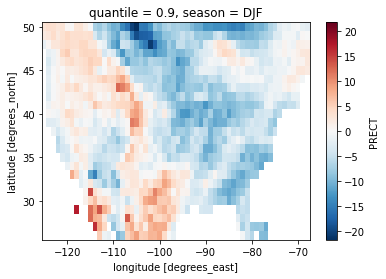

In [50]:
# this is already a masked array so everything going into spearman calculation should be masked
npercentPEx_time_CONUS_byseason_diff.sel(season='DJF').plot()

In [55]:
# sanity check there are nans where there should be
npercentPEx_time_CONUS_byseason_diff.sel(lon=-70, lat=26, method='nearest').sel(season='DJF').values

array(nan)

In [51]:
# calculating spearman rank correlations to add to plots; axis=None doesn't change results but nan_policy='omit' DOES!
test_spear = stats.mstats.spearmanr(x=npercentPEx_time_CONUS_byseason_diff.sel(season='DJF'), y=(cesm_srates_clim_CONUS_diff_land*7)[0,4,:,:], axis=None, nan_policy='omit')
test_spear

SpearmanrResult(correlation=0.6785366416803167, pvalue=1.9065732036221934e-155)

In [52]:
test_spear = stats.mstats.spearmanr(x=npercentPEx_time_CONUS_byseason_diff.sel(season='DJF'), y=PExgridpoints_time_CONUS_byseason_perdiff.sel(season='DJF'), axis=None, nan_policy='omit')
test_spear

SpearmanrResult(correlation=-0.19008647684387253, pvalue=8.748277397804185e-11)

In [228]:
# For spearmanr: If axis=0 (default), then each column (lon) represents a variable, with observations in the rows (lats). 
npercentPEx_time_CONUS_byseason_diff

<xarray.DataArray 'PRECT' (season: 4, lat: 25, lon: 58)>
dask.array<sub, shape=(4, 25, 58), dtype=float64, chunksize=(1, 10, 20), chunktype=numpy.ndarray>
Coordinates:
  * lat       (lat) float64 26.0 27.0 28.0 29.0 30.0 ... 47.0 48.0 49.0 50.0
  * lon       (lon) float64 -125.0 -124.0 -123.0 -122.0 ... -70.0 -69.0 -68.0
    quantile  float64 0.9
  * season    (season) object 'DJF' 'JJA' 'MAM' 'SON'

In [194]:
# string formatting for correlation labels
spearstr = r'$\rho$ = '+str(round(test_spear.correlation,2))
spearstr

'$\\rho$ = -0.05'

/glade/work/kdagon/miniconda/envs/PEx/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1887: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  result = matplotlib.axes.Axes.pcolor(self, *args, **kwargs)


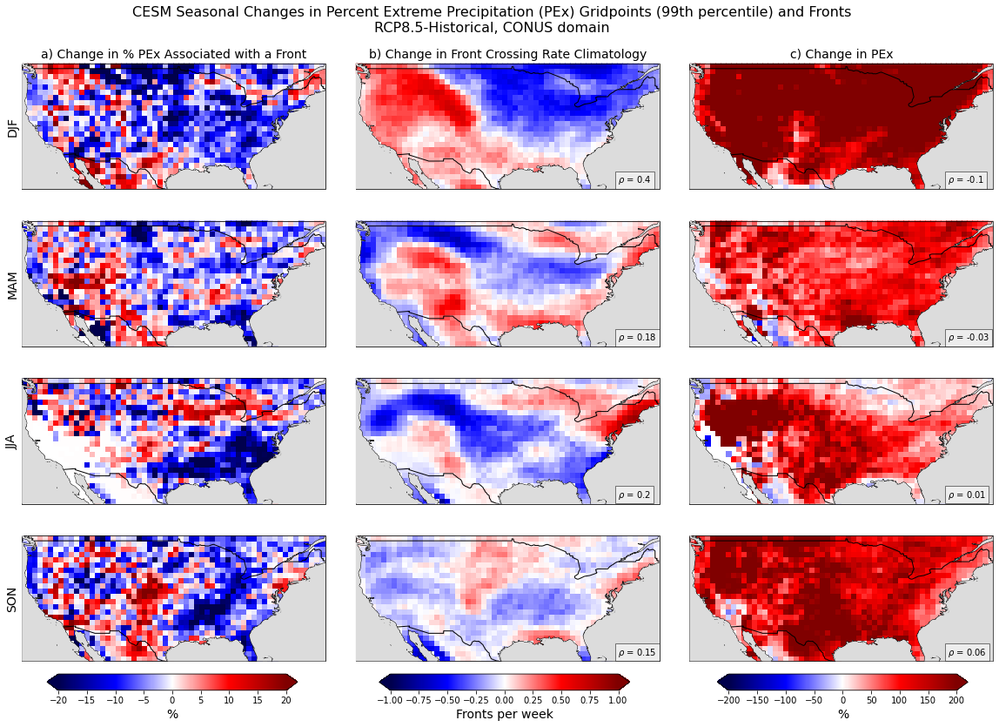

In [77]:
fig, axs = plt.subplots(4, 3, figsize=(20,13), subplot_kw={'projection': ccrs.PlateCarree()})

# seasons
sea_strs = ('DJF', 'MAM', 'JJA', 'SON')

# colormap for diff plots
cmap = plt.cm.get_cmap('seismic')
# 90, 95th percentiles and 99th percentile land only
vmin1=-20
vmax1=20
# 99th percentile all gridpoints
#vmin1=-40
#vmax1=40

# first panel: change in PEx and Front
for i, season in enumerate(sea_strs):
    if i == 0:
        axs[i,0].set_title('a) Change in % PEx Associated with a Front', fontsize=14)
    field, lon = add_cyclic_point(npercentPEx_time_CONUS_byseason_diff.sel(season=season), coord=npercentPEx_time_CONUS_byseason_diff.lon)
    lat = npercentPEx_time_CONUS_byseason_diff.lat
    cf = axs[i,0].pcolor(lon, lat, field, cmap=cmap, vmin=vmin1, vmax=vmax1, transform=ccrs.PlateCarree())
    axs[i,0].coastlines(zorder=1)
    axs[i,0].add_feature(cfeature.BORDERS, zorder=2)
    # add greyed out ocean
    axs[i,0].add_feature(cfeature.OCEAN, zorder=3, facecolor='gainsboro', edgecolor='none')
    axs[i,0].set_ylabel(season, fontsize=14)
    axs[i,0].set_yticks([])
    
# add colorbar for first panel
cb1_ax = fig.add_axes([0.145, 0.1, 0.2, 0.02])
norm1 = mpl.colors.Normalize(vmin=vmin1, vmax=vmax1)
cb1 = mpl.colorbar.ColorbarBase(cb1_ax, cmap=cmap, norm=norm1, orientation='horizontal', extend='both')
cb1.ax.set_xlabel('%', fontsize=14)
    
# second panel: change in fronts    
vmin2=-1
vmax2=1
for i, season in enumerate(sea_strs):
    if i == 0:
        axs[i,1].set_title('b) Change in Front Crossing Rate Climatology', fontsize=14) 
    #field, lon = add_cyclic_point((cesm_srates_clim_CONUS_diff*7)[i,4,:,:], coord=cesm_srates_clim_CONUS_diff.lon)
    field, lon = add_cyclic_point((cesm_srates_clim_CONUS_diff_land*7)[i,4,:,:], coord=cesm_srates_clim_CONUS_diff_land.lon) # land only for correlation coefficients
    #lat = cesm_srates_clim_CONUS_diff.lat
    lat = cesm_srates_clim_CONUS_diff_land.lat
    cf = axs[i,1].pcolor(lon, lat, field, cmap=cmap, vmin=vmin2, vmax=vmax2, transform=ccrs.PlateCarree())
    #spear = stats.mstats.spearmanr(x=npercentPEx_time_CONUS_byseason_diff.sel(season=season), y=(cesm_srates_clim_CONUS_diff*7)[i,4,:,:])
    spear = stats.mstats.spearmanr(x=npercentPEx_time_CONUS_byseason_diff.sel(season=season), y=(cesm_srates_clim_CONUS_diff_land*7)[i,4,:,:], nan_policy='omit')
    spearstr = r'$\rho$ = '+str(round(spear.correlation,2))
    axs[i,1].coastlines(zorder=1)
    axs[i,1].add_feature(cfeature.BORDERS, zorder=2)
    axs[i,1].add_feature(cfeature.OCEAN, zorder=3, facecolor='gainsboro', edgecolor='none')
    axs[i,1].text(0.865, 0.05, spearstr, transform=axs[i,1].transAxes, bbox=dict(boxstyle='square', facecolor='white', alpha=0.5), zorder=4)
    
cb2_ax = fig.add_axes([0.41, 0.1, 0.2, 0.02])
norm2 = mpl.colors.Normalize(vmin=vmin2, vmax=vmax2)
cb2 = mpl.colorbar.ColorbarBase(cb2_ax, cmap=cmap, norm=norm2, orientation='horizontal', extend='both')
cb2.ax.set_xlabel('Fronts per week', fontsize=14)

# third panel: change in PEx 
# 90, 95th percentiles
#vmin3=-100
#vmax3=100
# 99th percentile
vmin3=-200
vmax3=200
for i, season in enumerate(sea_strs):
    if i == 0:
        axs[i,2].set_title('c) Change in PEx', fontsize=14)
    field, lon = add_cyclic_point(PExgridpoints_time_CONUS_byseason_perdiff.sel(season=season), coord=PExgridpoints_time_CONUS_byseason_perdiff.lon)
    lat = PExgridpoints_time_CONUS_byseason_perdiff.lat
    #field, lon = add_cyclic_point(PExgridpoints_time_CONUS_byseason_diff.sel(season=season), coord=PExgridpoints_time_CONUS_byseason_diff.lon)
    #lat = PExgridpoints_time_CONUS_byseason_diff.lat
    cf = axs[i,2].pcolor(lon, lat, field, cmap=cmap, vmin=vmin3, vmax=vmax3, transform=ccrs.PlateCarree())
    spear = stats.mstats.spearmanr(x=npercentPEx_time_CONUS_byseason_diff.sel(season=season), y=PExgridpoints_time_CONUS_byseason_perdiff.sel(season=season), nan_policy='omit')
    spearstr = r'$\rho$ = '+str(round(spear.correlation,2))
    axs[i,2].coastlines(zorder=1)
    axs[i,2].add_feature(cfeature.BORDERS, zorder=2)
    axs[i,2].add_feature(cfeature.OCEAN, zorder=3, facecolor='gainsboro', edgecolor='none')
    #axs[i,2].text(0.85, 0.05, spearstr, transform=axs[i,2].transAxes, bbox=dict(boxstyle='square', facecolor='white', alpha=0.5))
    axs[i,2].text(0.85, 0.05, spearstr, transform=axs[i,2].transAxes, bbox=dict(boxstyle='square', facecolor='white', alpha=0.5), zorder=4) # land only
    
cb3_ax = fig.add_axes([0.68, 0.1, 0.2, 0.02])
norm3 = mpl.colors.Normalize(vmin=vmin3, vmax=vmax3)
cb3 = mpl.colorbar.ColorbarBase(cb3_ax, cmap=cmap, norm=norm3, orientation='horizontal', extend='both')
cb3.ax.set_xlabel('%', fontsize=14)  
    
# add title
#fig.suptitle('CESM Seasonal Changes in Percent Extreme Precipitation (PEx) Gridpoints (90th percentile) and Fronts\nRCP8.5-Historical, CONUS domain', fontsize=16, y=0.94)
#fig.suptitle('CESM Seasonal Changes in Percent Extreme Precipitation (PEx) Gridpoints (95th percentile) and Fronts\nRCP8.5-Historical, CONUS domain', fontsize=16, y=0.94)
fig.suptitle('CESM Seasonal Changes in Percent Extreme Precipitation (PEx) Gridpoints (99th percentile) and Fronts\nRCP8.5-Historical, CONUS domain', fontsize=16, y=0.94)

plt.subplots_adjust(wspace=0.1, hspace=0.1)

#plt.savefig('../figures/toSCP/npercentPEx_time_CONUS_byseason_diff_withfronts_andPEx_andspearmanr.png', bbox_inches='tight')
#plt.savefig('../figures/toSCP/npercentPEx95_time_CONUS_byseason_diff_withfronts_andPEx_andspearmanr.png', bbox_inches='tight')
#plt.savefig('../figures/toSCP/npercentPEx99_time_CONUS_byseason_diff_withfronts_andPEx_andspearmanr.png', bbox_inches='tight')
# plots with altered PEx baseline for RCP simulation
#plt.savefig('../figures/toSCP/npercentPEx90_time_CONUS_byseason_diff_withfronts_andPEx_andspearmanr_alterbase.png', bbox_inches='tight')
#plt.savefig('../figures/toSCP/npercentPEx95_time_CONUS_byseason_diff_withfronts_andPEx_andspearmanr_alterbase.png', bbox_inches='tight')
#plt.savefig('../figures/toSCP/npercentPEx99_time_CONUS_byseason_diff_withfronts_andPEx_andspearmanr_alterbase.png', bbox_inches='tight')
# plot with PRECT conservative regridding
#plt.savefig('../figures/toSCP/npercentPEx90_time_CONUS_byseason_diff_withfronts_andPEx_andspearmanr_alterbase_consregrid.png', bbox_inches='tight')
# plot land points only
#plt.savefig('../figures/toSCP/npercentPEx90_time_CONUS_byseason_diff_withfronts_andPEx_andspearmanr_alterbase_landonly.png', bbox_inches='tight')
#plt.savefig('../figures/toSCP/npercentPEx95_time_CONUS_byseason_diff_withfronts_andPEx_andspearmanr_alterbase_landonly.png', bbox_inches='tight')
#plt.savefig('../figures/toSCP/npercentPEx99_time_CONUS_byseason_diff_withfronts_andPEx_andspearmanr_alterbase_landonly.png', bbox_inches='tight')

#### Cold fronts

/glade/work/kdagon/miniconda/envs/PEx/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1887: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  result = matplotlib.axes.Axes.pcolor(self, *args, **kwargs)


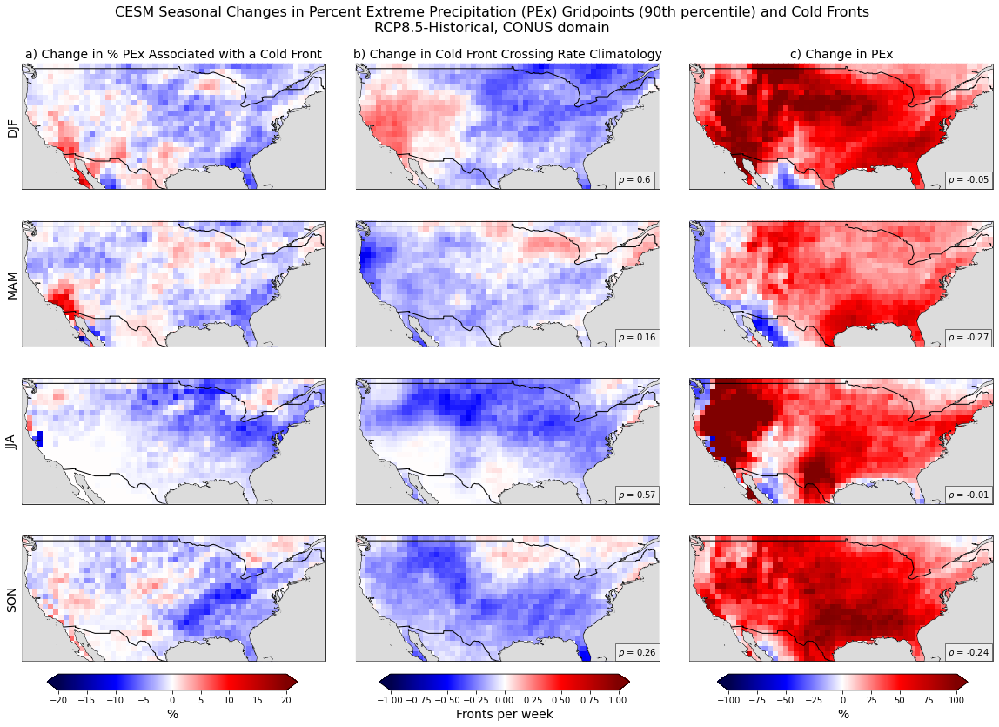

In [57]:
fig, axs = plt.subplots(4, 3, figsize=(20,13), subplot_kw={'projection': ccrs.PlateCarree()})

# seasons
sea_strs = ('DJF', 'MAM', 'JJA', 'SON')

# colormap for diff plots
cmap = plt.cm.get_cmap('seismic')
# 90th percentile
vmin1=-20
vmax1=20

# first panel: change in PEx and Front
for i, season in enumerate(sea_strs):
    if i == 0:
        axs[i,0].set_title('a) Change in % PEx Associated with a Cold Front', fontsize=14)
    field, lon = add_cyclic_point(npercentPEx_c_time_CONUS_byseason_diff.sel(season=season), coord=npercentPEx_c_time_CONUS_byseason_diff.lon)
    lat = npercentPEx_c_time_CONUS_byseason_diff.lat
    cf = axs[i,0].pcolor(lon, lat, field, cmap=cmap, vmin=vmin1, vmax=vmax1, transform=ccrs.PlateCarree())
    axs[i,0].coastlines(zorder=1)
    axs[i,0].add_feature(cfeature.BORDERS, zorder=2)
    # add greyed out ocean
    axs[i,0].add_feature(cfeature.OCEAN, zorder=3, facecolor='gainsboro', edgecolor='none')
    axs[i,0].set_ylabel(season, fontsize=14)
    axs[i,0].set_yticks([])
    
# add colorbar for first panel
cb1_ax = fig.add_axes([0.145, 0.1, 0.2, 0.02])
norm1 = mpl.colors.Normalize(vmin=vmin1, vmax=vmax1)
cb1 = mpl.colorbar.ColorbarBase(cb1_ax, cmap=cmap, norm=norm1, orientation='horizontal', extend='both')
cb1.ax.set_xlabel('%', fontsize=14)
    
# second panel: change in fronts    
vmin2=-1
vmax2=1
for i, season in enumerate(sea_strs):
    if i == 0:
        axs[i,1].set_title('b) Change in Cold Front Crossing Rate Climatology', fontsize=14) 
    #field, lon = add_cyclic_point((cesm_srates_clim_CONUS_diff*7)[i,0,:,:], coord=cesm_srates_clim_CONUS_diff.lon)
    field, lon = add_cyclic_point((cesm_srates_clim_CONUS_diff_land*7)[i,0,:,:], coord=cesm_srates_clim_CONUS_diff_land.lon) # land only for correlation coefficients
    #lat = cesm_srates_clim_CONUS_diff.lat
    lat = cesm_srates_clim_CONUS_diff_land.lat
    cf = axs[i,1].pcolor(lon, lat, field, cmap=cmap, vmin=vmin2, vmax=vmax2, transform=ccrs.PlateCarree())
    #spear = stats.mstats.spearmanr(x=npercentPEx_c_time_CONUS_byseason_diff.sel(season=season), y=(cesm_srates_clim_CONUS_diff*7)[i,0,:,:])
    spear = stats.mstats.spearmanr(x=npercentPEx_c_time_CONUS_byseason_diff.sel(season=season), y=(cesm_srates_clim_CONUS_diff_land*7)[i,0,:,:], nan_policy='omit')
    spearstr = r'$\rho$ = '+str(round(spear.correlation,2))
    axs[i,1].coastlines(zorder=1)
    axs[i,1].add_feature(cfeature.BORDERS, zorder=2)
    axs[i,1].add_feature(cfeature.OCEAN, zorder=3, facecolor='gainsboro', edgecolor='none')
    axs[i,1].text(0.865, 0.05, spearstr, transform=axs[i,1].transAxes, bbox=dict(boxstyle='square', facecolor='white', alpha=0.5), zorder=4)
    
cb2_ax = fig.add_axes([0.41, 0.1, 0.2, 0.02])
norm2 = mpl.colors.Normalize(vmin=vmin2, vmax=vmax2)
cb2 = mpl.colorbar.ColorbarBase(cb2_ax, cmap=cmap, norm=norm2, orientation='horizontal', extend='both')
cb2.ax.set_xlabel('Fronts per week', fontsize=14)

# third panel: change in PEx 
# 90th percentile
vmin3=-100
vmax3=100

for i, season in enumerate(sea_strs):
    if i == 0:
        axs[i,2].set_title('c) Change in PEx', fontsize=14)
    field, lon = add_cyclic_point(PExgridpoints_time_CONUS_byseason_perdiff.sel(season=season), coord=PExgridpoints_time_CONUS_byseason_perdiff.lon)
    lat = PExgridpoints_time_CONUS_byseason_perdiff.lat
    #field, lon = add_cyclic_point(PExgridpoints_time_CONUS_byseason_diff.sel(season=season), coord=PExgridpoints_time_CONUS_byseason_diff.lon)
    #lat = PExgridpoints_time_CONUS_byseason_diff.lat
    cf = axs[i,2].pcolor(lon, lat, field, cmap=cmap, vmin=vmin3, vmax=vmax3, transform=ccrs.PlateCarree())
    spear = stats.mstats.spearmanr(x=npercentPEx_c_time_CONUS_byseason_diff.sel(season=season), y=PExgridpoints_time_CONUS_byseason_perdiff.sel(season=season), nan_policy='omit')
    spearstr = r'$\rho$ = '+str(round(spear.correlation,2))
    axs[i,2].coastlines(zorder=1)
    axs[i,2].add_feature(cfeature.BORDERS, zorder=2)
    axs[i,2].add_feature(cfeature.OCEAN, zorder=3, facecolor='gainsboro', edgecolor='none')
    axs[i,2].text(0.85, 0.05, spearstr, transform=axs[i,2].transAxes, bbox=dict(boxstyle='square', facecolor='white', alpha=0.5), zorder=4)
    
cb3_ax = fig.add_axes([0.68, 0.1, 0.2, 0.02])
norm3 = mpl.colors.Normalize(vmin=vmin3, vmax=vmax3)
cb3 = mpl.colorbar.ColorbarBase(cb3_ax, cmap=cmap, norm=norm3, orientation='horizontal', extend='both')
cb3.ax.set_xlabel('%', fontsize=14)  
    
# add title
fig.suptitle('CESM Seasonal Changes in Percent Extreme Precipitation (PEx) Gridpoints (90th percentile) and Cold Fronts\nRCP8.5-Historical, CONUS domain', fontsize=16, y=0.94)

plt.subplots_adjust(wspace=0.1, hspace=0.1)

#plt.savefig('../figures/toSCP/npercentPEx90_time_CONUS_byseason_diff_withfronts_andPEx_andspearmanr_cold_fronts.png', bbox_inches='tight')
#plt.savefig('../figures/toSCP/npercentPEx90_time_CONUS_byseason_diff_withfronts_andPEx_andspearmanr_cold_fronts_landonly.png', bbox_inches='tight')

#### Stationary fronts

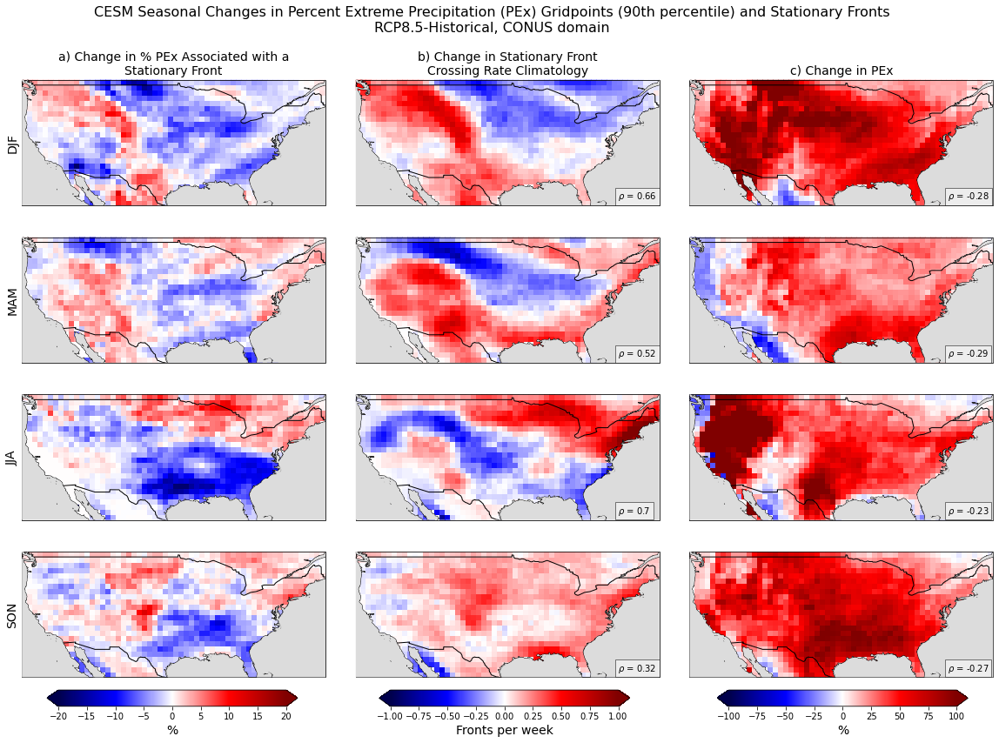

In [58]:
fig, axs = plt.subplots(4, 3, figsize=(20,13), subplot_kw={'projection': ccrs.PlateCarree()})

# seasons
sea_strs = ('DJF', 'MAM', 'JJA', 'SON')

# colormap for diff plots
cmap = plt.cm.get_cmap('seismic')
# 90th percentile
vmin1=-20
vmax1=20

# first panel: change in PEx and Front
for i, season in enumerate(sea_strs):
    if i == 0:
        axs[i,0].set_title('a) Change in % PEx Associated with a\nStationary Front', fontsize=14)
    field, lon = add_cyclic_point(npercentPEx_s_time_CONUS_byseason_diff.sel(season=season), coord=npercentPEx_s_time_CONUS_byseason_diff.lon)
    lat = npercentPEx_s_time_CONUS_byseason_diff.lat
    cf = axs[i,0].pcolor(lon, lat, field, cmap=cmap, vmin=vmin1, vmax=vmax1, transform=ccrs.PlateCarree())
    axs[i,0].coastlines(zorder=1)
    axs[i,0].add_feature(cfeature.BORDERS, zorder=2)
    # add greyed out ocean
    axs[i,0].add_feature(cfeature.OCEAN, zorder=3, facecolor='gainsboro', edgecolor='none')
    axs[i,0].set_ylabel(season, fontsize=14)
    axs[i,0].set_yticks([])
    
# add colorbar for first panel
cb1_ax = fig.add_axes([0.145, 0.1, 0.2, 0.02])
norm1 = mpl.colors.Normalize(vmin=vmin1, vmax=vmax1)
cb1 = mpl.colorbar.ColorbarBase(cb1_ax, cmap=cmap, norm=norm1, orientation='horizontal', extend='both')
cb1.ax.set_xlabel('%', fontsize=14)
    
# second panel: change in fronts    
vmin2=-1
vmax2=1
for i, season in enumerate(sea_strs):
    if i == 0:
        axs[i,1].set_title('b) Change in Stationary Front\nCrossing Rate Climatology', fontsize=14) 
    #field, lon = add_cyclic_point((cesm_srates_clim_CONUS_diff*7)[i,2,:,:], coord=cesm_srates_clim_CONUS_diff.lon)
    field, lon = add_cyclic_point((cesm_srates_clim_CONUS_diff_land*7)[i,2,:,:], coord=cesm_srates_clim_CONUS_diff_land.lon)
    #lat = cesm_srates_clim_CONUS_diff.lat
    lat = cesm_srates_clim_CONUS_diff_land.lat
    cf = axs[i,1].pcolor(lon, lat, field, cmap=cmap, vmin=vmin2, vmax=vmax2, transform=ccrs.PlateCarree())
    #spear = stats.mstats.spearmanr(x=npercentPEx_s_time_CONUS_byseason_diff.sel(season=season), y=(cesm_srates_clim_CONUS_diff*7)[i,2,:,:])
    spear = stats.mstats.spearmanr(x=npercentPEx_s_time_CONUS_byseason_diff.sel(season=season), y=(cesm_srates_clim_CONUS_diff_land*7)[i,2,:,:], nan_policy='omit')
    spearstr = r'$\rho$ = '+str(round(spear.correlation,2))
    axs[i,1].coastlines(zorder=1)
    axs[i,1].add_feature(cfeature.BORDERS, zorder=2)
    axs[i,1].add_feature(cfeature.OCEAN, zorder=3, facecolor='gainsboro', edgecolor='none')
    axs[i,1].text(0.865, 0.05, spearstr, transform=axs[i,1].transAxes, bbox=dict(boxstyle='square', facecolor='white', alpha=0.5), zorder=4)
    
cb2_ax = fig.add_axes([0.41, 0.1, 0.2, 0.02])
norm2 = mpl.colors.Normalize(vmin=vmin2, vmax=vmax2)
cb2 = mpl.colorbar.ColorbarBase(cb2_ax, cmap=cmap, norm=norm2, orientation='horizontal', extend='both')
cb2.ax.set_xlabel('Fronts per week', fontsize=14)

# third panel: change in PEx 
# 90th percentile
vmin3=-100
vmax3=100
for i, season in enumerate(sea_strs):
    if i == 0:
        axs[i,2].set_title('c) Change in PEx', fontsize=14)
    field, lon = add_cyclic_point(PExgridpoints_time_CONUS_byseason_perdiff.sel(season=season), coord=PExgridpoints_time_CONUS_byseason_perdiff.lon)
    lat = PExgridpoints_time_CONUS_byseason_perdiff.lat
    #field, lon = add_cyclic_point(PExgridpoints_time_CONUS_byseason_diff.sel(season=season), coord=PExgridpoints_time_CONUS_byseason_diff.lon)
    #lat = PExgridpoints_time_CONUS_byseason_diff.lat
    cf = axs[i,2].pcolor(lon, lat, field, cmap=cmap, vmin=vmin3, vmax=vmax3, transform=ccrs.PlateCarree())
    spear = stats.mstats.spearmanr(x=npercentPEx_s_time_CONUS_byseason_diff.sel(season=season), y=PExgridpoints_time_CONUS_byseason_perdiff.sel(season=season), nan_policy='omit')
    spearstr = r'$\rho$ = '+str(round(spear.correlation,2))
    axs[i,2].coastlines(zorder=1)
    axs[i,2].add_feature(cfeature.BORDERS, zorder=2)
    axs[i,2].add_feature(cfeature.OCEAN, zorder=3, facecolor='gainsboro', edgecolor='none')
    axs[i,2].text(0.85, 0.05, spearstr, transform=axs[i,2].transAxes, bbox=dict(boxstyle='square', facecolor='white', alpha=0.5), zorder=4)
    
cb3_ax = fig.add_axes([0.68, 0.1, 0.2, 0.02])
norm3 = mpl.colors.Normalize(vmin=vmin3, vmax=vmax3)
cb3 = mpl.colorbar.ColorbarBase(cb3_ax, cmap=cmap, norm=norm3, orientation='horizontal', extend='both')
cb3.ax.set_xlabel('%', fontsize=14)  
    
# add title
fig.suptitle('CESM Seasonal Changes in Percent Extreme Precipitation (PEx) Gridpoints (90th percentile) and Stationary Fronts\nRCP8.5-Historical, CONUS domain', fontsize=16, y=0.96)

plt.subplots_adjust(wspace=0.1, hspace=0.1)

#plt.savefig('../figures/toSCP/npercentPEx90_time_CONUS_byseason_diff_withfronts_andPEx_andspearmanr_stationary_fronts.png', bbox_inches='tight')
#plt.savefig('../figures/toSCP/npercentPEx90_time_CONUS_byseason_diff_withfronts_andPEx_andspearmanr_stationary_fronts_landonly.png', bbox_inches='tight')

### Other spatial pattern correlation methods

In [34]:
# spatial pattern correlation
from scipy import signal
corr_test = signal.correlate2d(npercentPEx_time_CONUS_byseason_diff.sel(season='DJF'), PExgridpoints_time_CONUS_byseason_perdiff.sel(season='DJF'), mode='same', boundary='fill')
corr_test
# how to interpret these numbers? do they need to be rescaled/normalized somehow?

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])

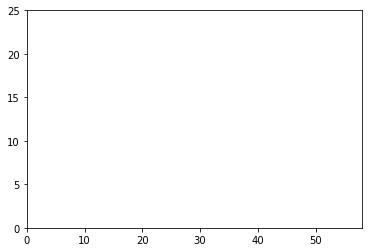

In [35]:
plt.pcolor(corr_test)

In [36]:
# mode='valid' gives a single number?
corr_test = signal.correlate2d(npercentPEx_time_CONUS_byseason_diff.sel(season='DJF'), PExgridpoints_time_CONUS_byseason_perdiff.sel(season='DJF'), mode='valid', boundary='fill')
corr_test

array([[nan]])

In [37]:
# what is the difference using boundary='symm'? output is definitely different
corr_symm = signal.correlate2d(npercentPEx_time_CONUS_byseason_diff.sel(season='DJF'), PExgridpoints_time_CONUS_byseason_perdiff.sel(season='DJF'), mode='same', boundary='symm')
corr_symm
# also a boundary='wrap' option...

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])

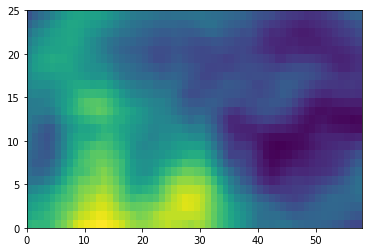

In [66]:
plt.pcolor(corr_symm)

In [68]:
corr_test_fronts = signal.correlate2d(npercentPEx_time_CONUS_byseason_diff.sel(season='DJF'), cesm_srates_clim_CONUS_diff[0,4,:,:], mode='same', boundary='fill')
corr_test_fronts
# scale of numbers is very different here

array([[-34.02684229, -31.02508938, -29.19678615, ..., -26.06786052,
        -31.97249809, -37.20272489],
       [-31.64991679, -28.15192885, -25.16184323, ..., -34.59658333,
        -40.20643337, -45.04836551],
       [-29.51567704, -25.66565864, -21.99386837, ..., -42.93102423,
        -48.2888662 , -52.62923128],
       ...,
       [ 26.74445842,  30.69230389,  34.45933308, ..., -83.25288607,
        -80.10881936, -75.22622885],
       [ 24.25894999,  27.14500036,  30.34352987, ..., -74.024844  ,
        -71.42070505, -67.01065928],
       [ 19.99890707,  22.85529487,  25.35927075, ..., -64.95092391,
        -63.06845199, -58.99291268]])

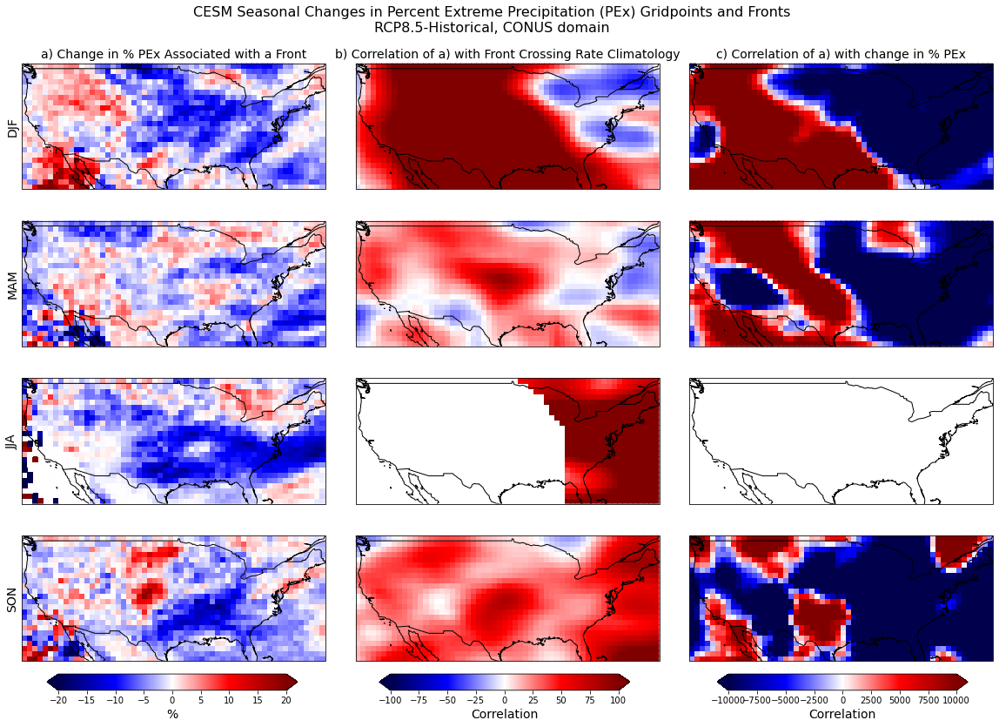

In [71]:
# scales are a bit weird here, especially for correlations of percentage diffs
# also some seasons don't plot / get cut off?
fig, axs = plt.subplots(4, 3, figsize=(20,13), subplot_kw={'projection': ccrs.PlateCarree()})

# seasons
sea_strs = ('DJF', 'MAM', 'JJA', 'SON')

# colormap for diff plots
cmap = plt.cm.get_cmap('seismic')
vmin1=-20
vmax1=20

# first panel: change in PEx and Front
for i, season in enumerate(sea_strs):
    if i == 0:
        axs[i,0].set_title('a) Change in % PEx Associated with a Front', fontsize=14)
    field, lon = add_cyclic_point(npercentPEx_time_CONUS_byseason_diff.sel(season=season), coord=npercentPEx_time_CONUS_byseason_diff.lon)
    lat = npercentPEx_time_CONUS_byseason_diff.lat
    cf = axs[i,0].pcolor(lon, lat, field, cmap=cmap, vmin=vmin1, vmax=vmax1, transform=ccrs.PlateCarree())
    axs[i,0].coastlines()
    axs[i,0].add_feature(cfeature.BORDERS)
    axs[i,0].set_ylabel(season, fontsize=14)
    axs[i,0].set_yticks([])
    
# add colorbar for first panel
cb1_ax = fig.add_axes([0.145, 0.1, 0.2, 0.02])
norm1 = mpl.colors.Normalize(vmin=vmin1, vmax=vmax1)
cb1 = mpl.colorbar.ColorbarBase(cb1_ax, cmap=cmap, norm=norm1, orientation='horizontal', extend='both')
cb1.ax.set_xlabel('%', fontsize=14)
    
# second panel: change in fronts correlation with first panel  
vmin2=-100
vmax2=100
for i, season in enumerate(sea_strs):
    if i == 0:
        axs[i,1].set_title('b) Correlation of a) with Front Crossing Rate Climatology', fontsize=14) 
    corr = signal.correlate2d(npercentPEx_time_CONUS_byseason_diff.sel(season=season), cesm_srates_clim_CONUS_diff[i,4,:,:], mode='same', boundary='symm')
    field, lon = add_cyclic_point(corr, coord=cesm_srates_clim_CONUS_diff.lon)
    lat = cesm_srates_clim_CONUS_diff.lat
    cf = axs[i,1].pcolor(lon, lat, field, cmap=cmap, vmin=vmin2, vmax=vmax2, transform=ccrs.PlateCarree())
    axs[i,1].coastlines()
    axs[i,1].add_feature(cfeature.BORDERS)
    
cb2_ax = fig.add_axes([0.41, 0.1, 0.2, 0.02])
norm2 = mpl.colors.Normalize(vmin=vmin2, vmax=vmax2)
cb2 = mpl.colorbar.ColorbarBase(cb2_ax, cmap=cmap, norm=norm2, orientation='horizontal', extend='both')
cb2.ax.set_xlabel('Correlation', fontsize=14)

# third panel: change in PEx correlation with first panel
vmin3=-10000
vmax3=10000
for i, season in enumerate(sea_strs):
    if i == 0:
        axs[i,2].set_title('c) Correlation of a) with change in % PEx', fontsize=14)
    corr = signal.correlate2d(npercentPEx_time_CONUS_byseason_diff.sel(season=season), PExgridpoints_time_CONUS_byseason_perdiff.sel(season=season), mode='same', boundary='symm')
    field, lon = add_cyclic_point(corr, coord=PExgridpoints_time_CONUS_byseason_perdiff.lon)
    lat = PExgridpoints_time_CONUS_byseason_perdiff.lat
    cf = axs[i,2].pcolor(lon, lat, field, cmap=cmap, vmin=vmin3, vmax=vmax3, transform=ccrs.PlateCarree())
    axs[i,2].coastlines()
    axs[i,2].add_feature(cfeature.BORDERS)
    
cb3_ax = fig.add_axes([0.68, 0.1, 0.2, 0.02])
norm3 = mpl.colors.Normalize(vmin=vmin3, vmax=vmax3)
cb3 = mpl.colorbar.ColorbarBase(cb3_ax, cmap=cmap, norm=norm3, orientation='horizontal', extend='both')
cb3.ax.set_xlabel('Correlation', fontsize=14)  


    
# add title
fig.suptitle('CESM Seasonal Changes in Percent Extreme Precipitation (PEx) Gridpoints and Fronts\nRCP8.5-Historical, CONUS domain', fontsize=16, y=0.94)

plt.subplots_adjust(wspace=0.1, hspace=0.1)

#plt.savefig('../figures/toSCP/npercentPEx_time_CONUS_byseason_diff_withfronts_andPEx.png', bbox_inches='tight')

In [78]:
client.close()
cluster.close()